# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('../input/cs231n-gan/gan-checks-tf.npz')

NOISE_DIM = 96

2024-02-13 20:45:07.502070: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-13 20:45:07.502189: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-13 20:45:07.654437: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

11490434/11490434 [==============================] - 0s 0us/step


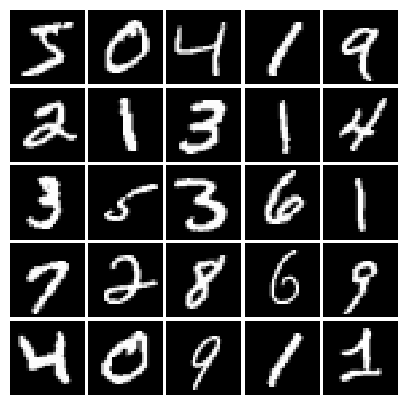

In [3]:
# show a batch
mnist = MNIST(batch_size=25) 
show_images(mnist.X[:25])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    x = tf.nn.leaky_relu(x,alpha)
    return x
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 1.11759e-08


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    noise = tf.random.uniform([batch_size,dim],minval = -1,maxval = 1)
    return noise
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [10]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(noise_dim),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(784,activation = tf.nn.tanh)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [11]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [12]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    real_loss = cross_entropy(tf.ones_like(logits_real), logits_real)
    fake_loss = cross_entropy(tf.zeros_like(logits_fake), logits_fake)
    loss = real_loss + fake_loss
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = cross_entropy(tf.ones_like(logits_fake), logits_fake)
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [13]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 0


In [14]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 7.19722e-17


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [15]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    D_solver = tf.optimizers.Adam(learning_rate,beta1)
    G_solver = tf.optimizers.Adam(learning_rate,beta1)
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [16]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

I0000 00:00:1707857126.979834      34 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Epoch: 0, Iter: 0, D: 1.381, G:0.6621


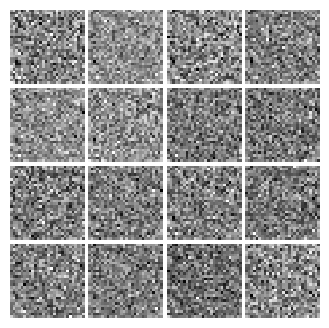

Epoch: 0, Iter: 20, D: 0.5917, G:1.002


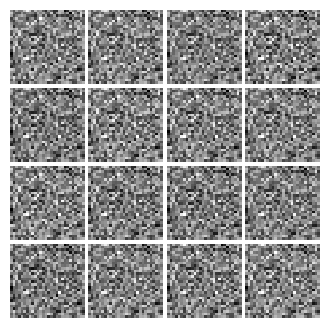

Epoch: 0, Iter: 40, D: 0.4731, G:1.04


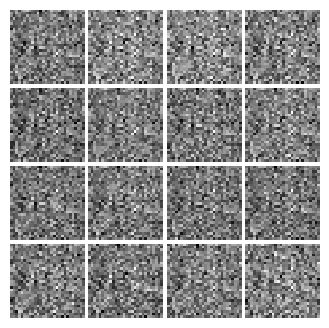

Epoch: 0, Iter: 60, D: 0.2446, G:2.377


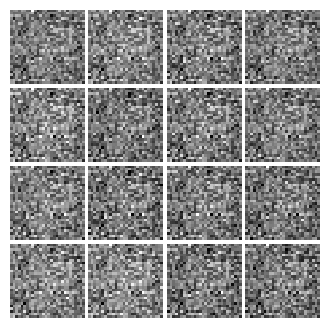

Epoch: 0, Iter: 80, D: 4.233, G:0.8521


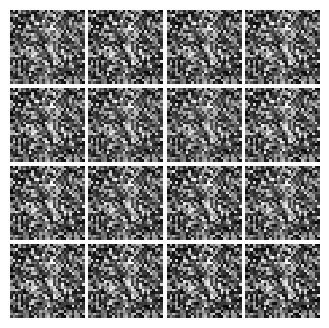

Epoch: 0, Iter: 100, D: 0.5502, G:1.527


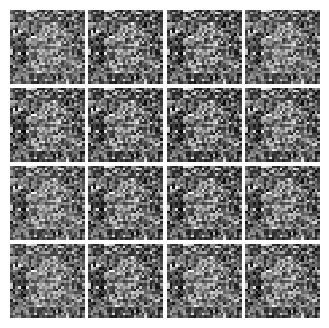

Epoch: 0, Iter: 120, D: 0.5213, G:2.109


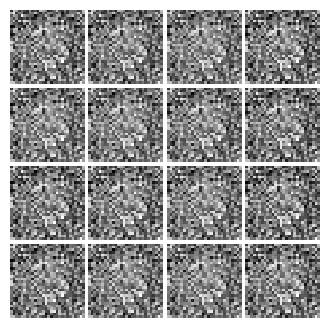

Epoch: 0, Iter: 140, D: 0.873, G:1.963


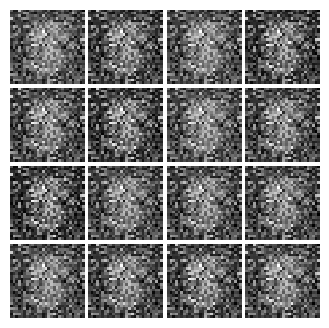

Epoch: 0, Iter: 160, D: 1.279, G:1.714


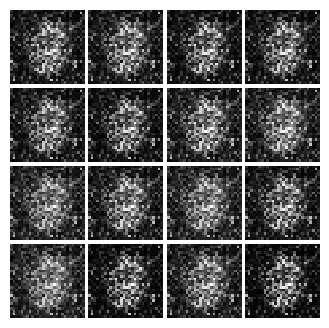

Epoch: 0, Iter: 180, D: 1.767, G:0.8207


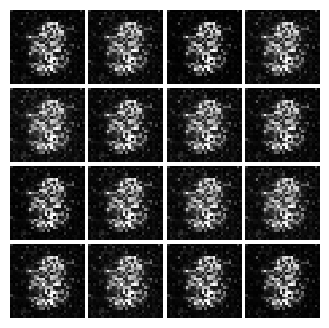

Epoch: 0, Iter: 200, D: 0.9637, G:1.181


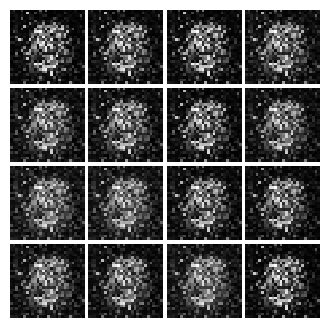

Epoch: 0, Iter: 220, D: 1.353, G:1.087


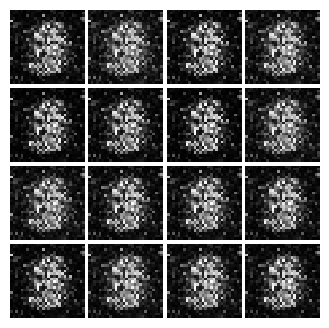

Epoch: 0, Iter: 240, D: 0.9913, G:1.53


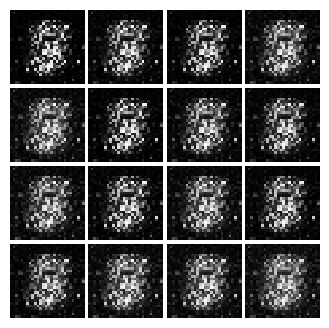

Epoch: 0, Iter: 260, D: 1.073, G:1.071


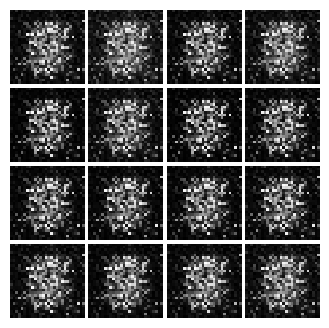

Epoch: 0, Iter: 280, D: 1.028, G:1.871


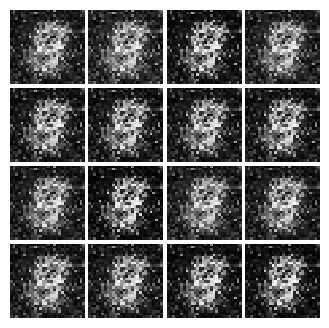

Epoch: 0, Iter: 300, D: 0.7672, G:2.527


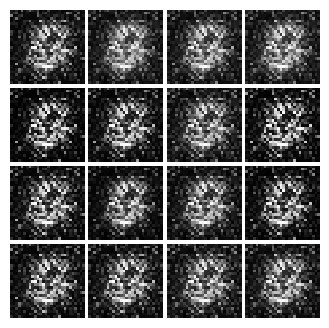

Epoch: 0, Iter: 320, D: 1.261, G:1.105


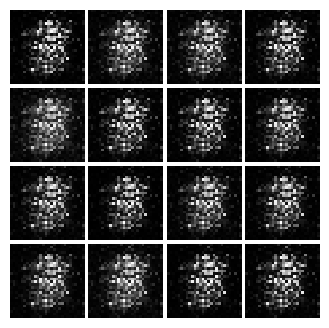

Epoch: 0, Iter: 340, D: 1.113, G:1.542


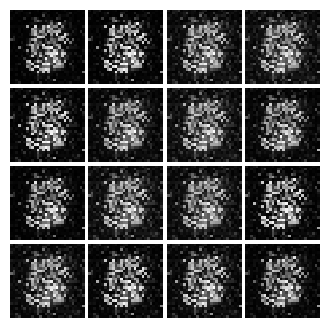

Epoch: 0, Iter: 360, D: 1.062, G:1.503


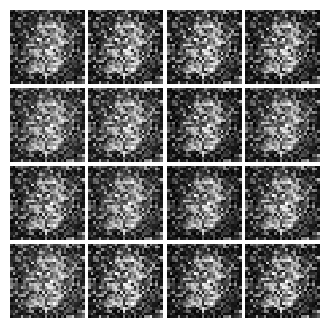

Epoch: 0, Iter: 380, D: 1.208, G:3.236


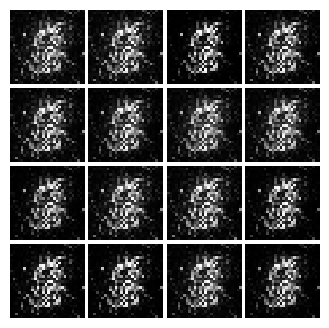

Epoch: 0, Iter: 400, D: 2.168, G:1.452


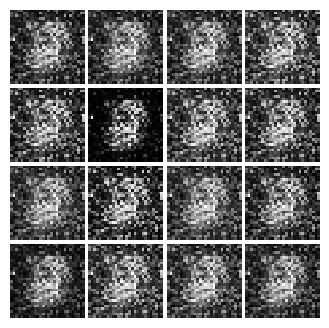

Epoch: 0, Iter: 420, D: 0.948, G:1.537


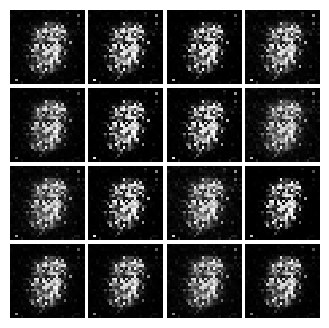

Epoch: 0, Iter: 440, D: 1.024, G:1.509


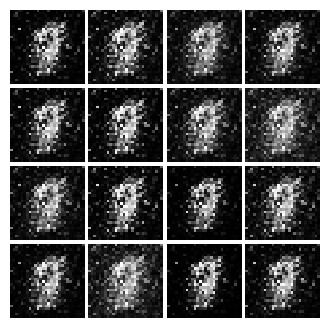

Epoch: 0, Iter: 460, D: 1.089, G:1.686


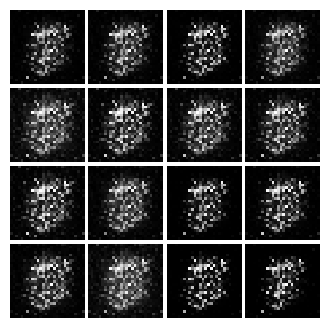

Epoch: 1, Iter: 480, D: 1.548, G:1.375


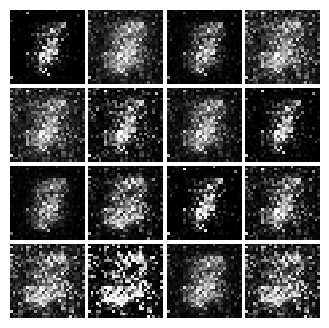

Epoch: 1, Iter: 500, D: 1.313, G:1.097


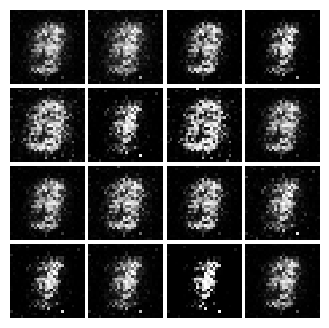

Epoch: 1, Iter: 520, D: 1.273, G:0.989


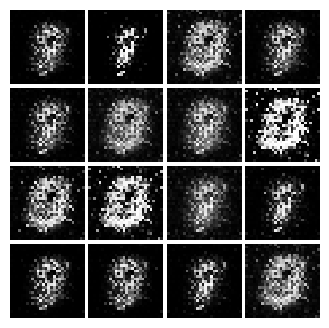

Epoch: 1, Iter: 540, D: 1.121, G:1.07


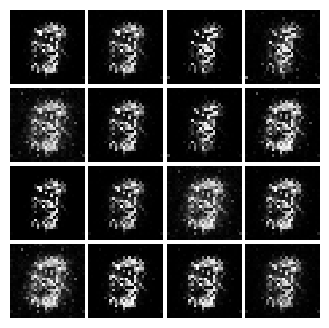

Epoch: 1, Iter: 560, D: 1.03, G:0.9445


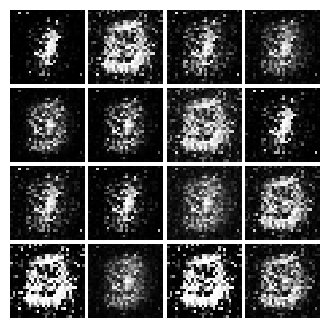

Epoch: 1, Iter: 580, D: 1.166, G:1.112


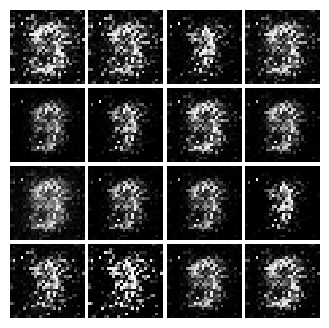

Epoch: 1, Iter: 600, D: 1.464, G:1.362


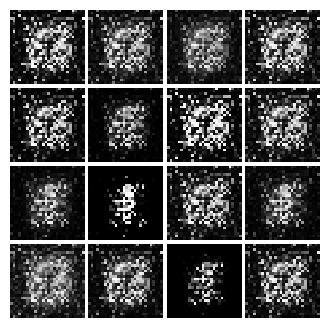

Epoch: 1, Iter: 620, D: 1.218, G:1.116


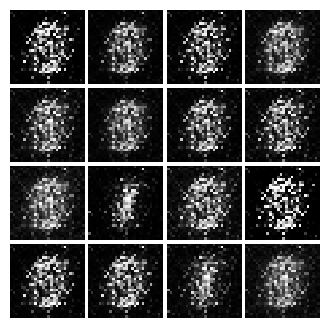

Epoch: 1, Iter: 640, D: 0.852, G:1.517


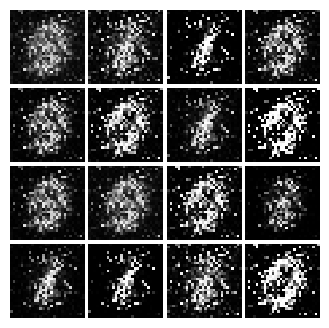

Epoch: 1, Iter: 660, D: 0.9987, G:1.31


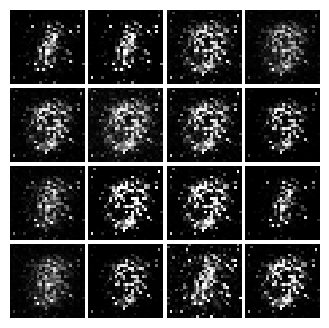

Epoch: 1, Iter: 680, D: 0.9843, G:2.912


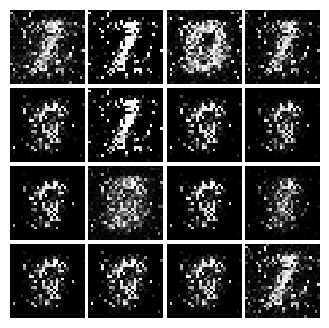

Epoch: 1, Iter: 700, D: 2.552, G:0.3374


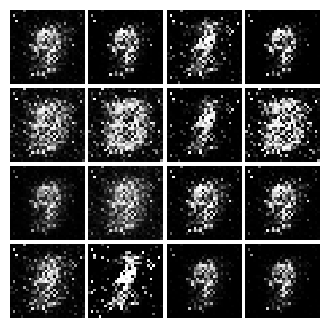

Epoch: 1, Iter: 720, D: 1.035, G:1.601


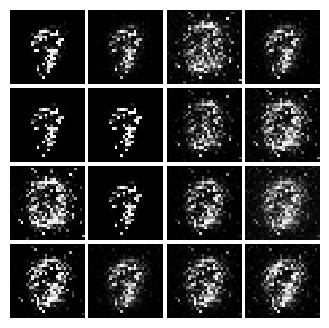

Epoch: 1, Iter: 740, D: 1.242, G:2.631


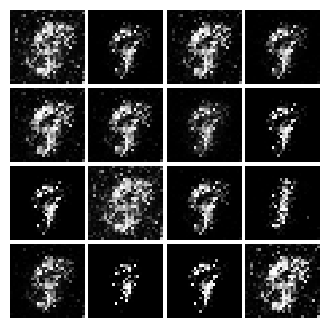

Epoch: 1, Iter: 760, D: 1.11, G:1.217


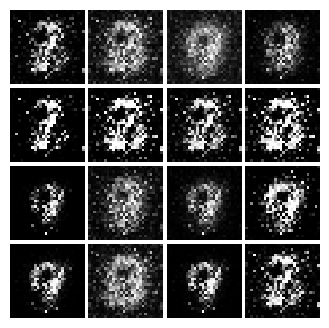

Epoch: 1, Iter: 780, D: 1.11, G:1.841


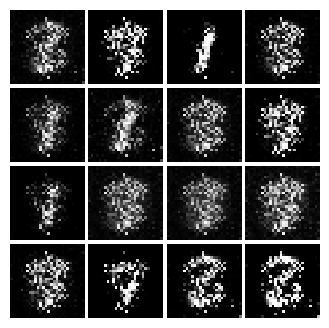

Epoch: 1, Iter: 800, D: 1.311, G:1.651


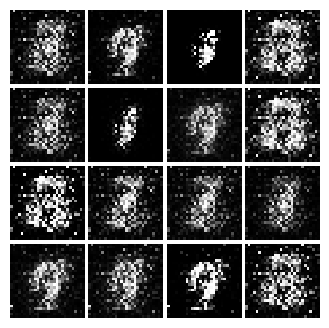

Epoch: 1, Iter: 820, D: 1.263, G:1.134


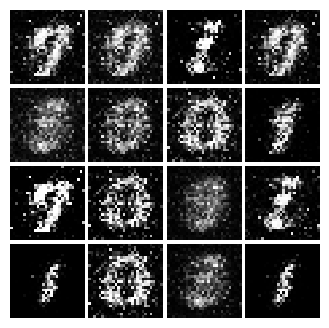

Epoch: 1, Iter: 840, D: 1.047, G:1.16


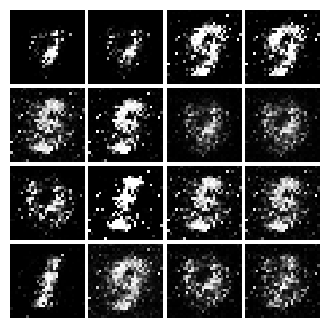

Epoch: 1, Iter: 860, D: 1.334, G:0.6025


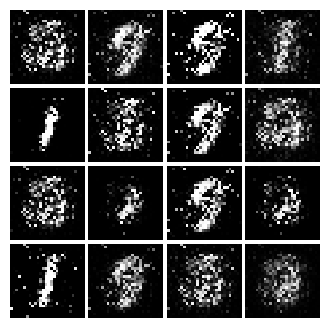

Epoch: 1, Iter: 880, D: 1.191, G:1.257


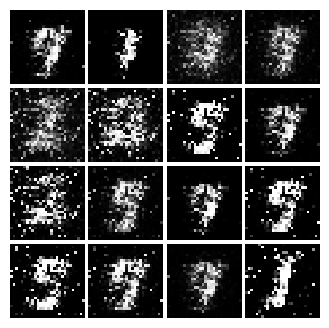

Epoch: 1, Iter: 900, D: 1.118, G:1.263


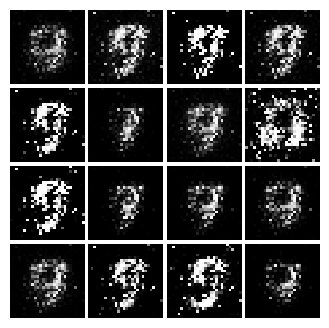

Epoch: 1, Iter: 920, D: 1.35, G:0.9904


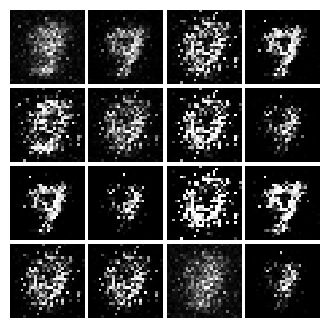

Epoch: 2, Iter: 940, D: 1.473, G:1.066


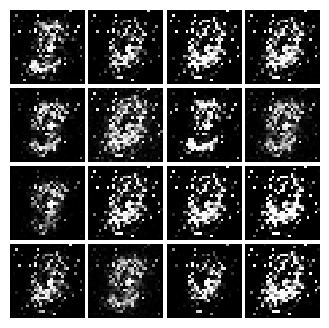

Epoch: 2, Iter: 960, D: 1.188, G:0.7258


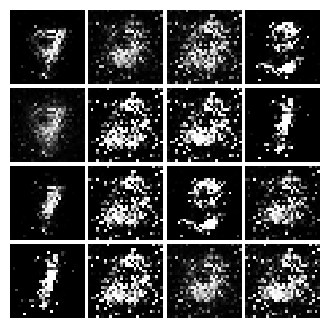

Epoch: 2, Iter: 980, D: 1.616, G:1.379


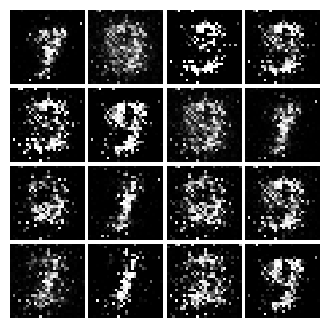

Epoch: 2, Iter: 1000, D: 1.106, G:1.164


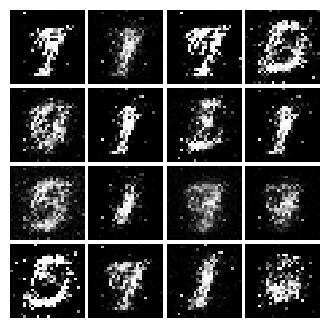

Epoch: 2, Iter: 1020, D: 1.176, G:1.062


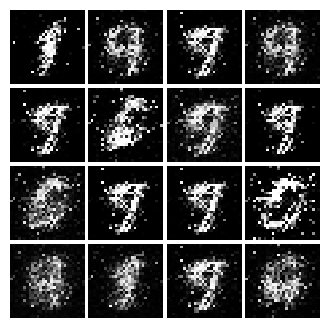

Epoch: 2, Iter: 1040, D: 1.118, G:1.396


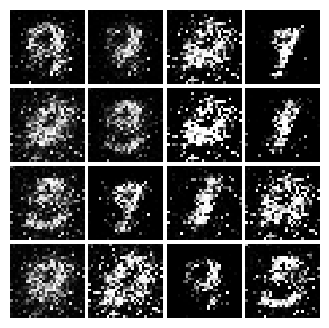

Epoch: 2, Iter: 1060, D: 1.434, G:1.1


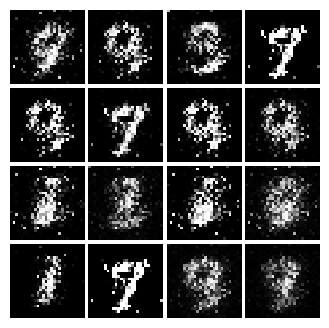

Epoch: 2, Iter: 1080, D: 1.076, G:0.7811


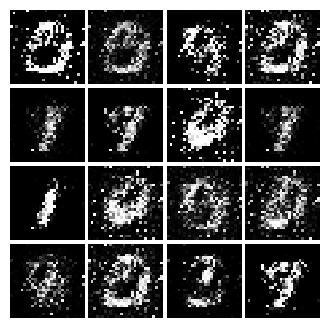

Epoch: 2, Iter: 1100, D: 1.226, G:1.07


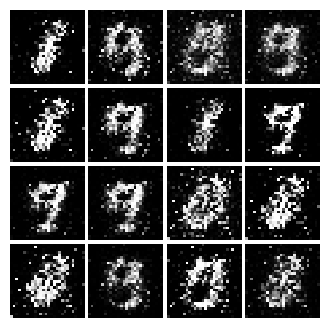

Epoch: 2, Iter: 1120, D: 1.242, G:1.004


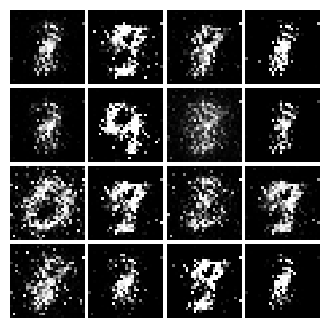

Epoch: 2, Iter: 1140, D: 1.362, G:1.28


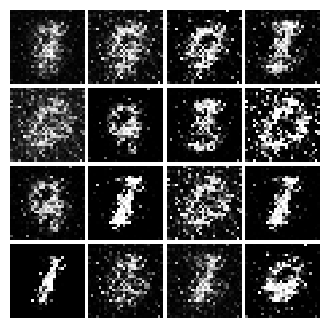

Epoch: 2, Iter: 1160, D: 1.216, G:1.215


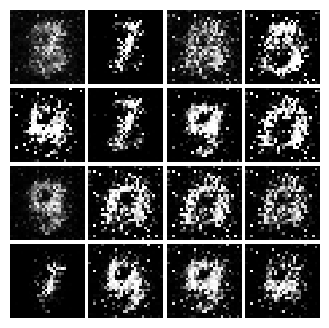

Epoch: 2, Iter: 1180, D: 1.177, G:1.511


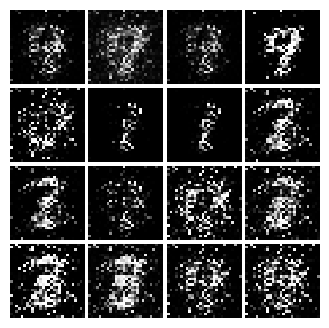

Epoch: 2, Iter: 1200, D: 1.364, G:0.8976


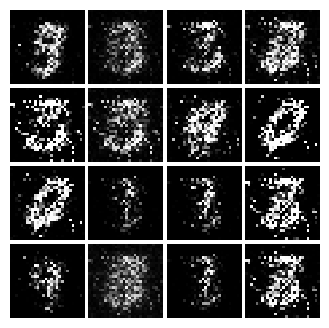

Epoch: 2, Iter: 1220, D: 1.283, G:1.3


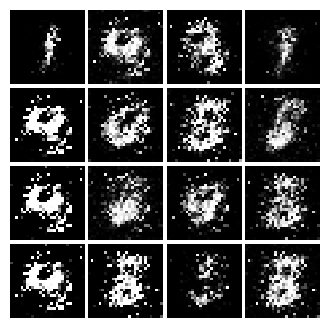

Epoch: 2, Iter: 1240, D: 1.229, G:1.171


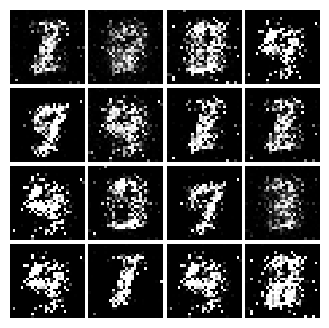

Epoch: 2, Iter: 1260, D: 1.059, G:1.213


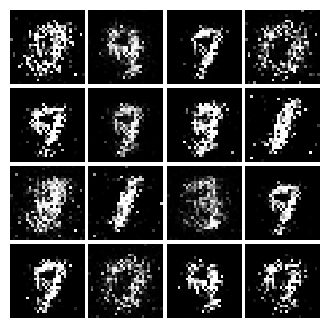

Epoch: 2, Iter: 1280, D: 1.223, G:1.138


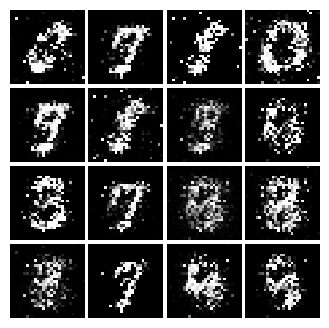

Epoch: 2, Iter: 1300, D: 1.181, G:1.064


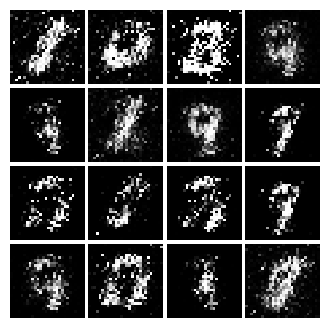

Epoch: 2, Iter: 1320, D: 1.377, G:1.548


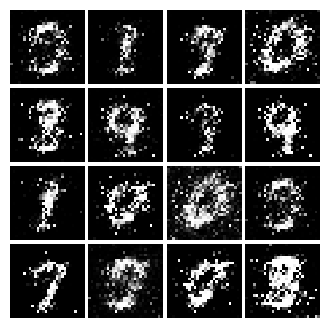

Epoch: 2, Iter: 1340, D: 1.147, G:1.162


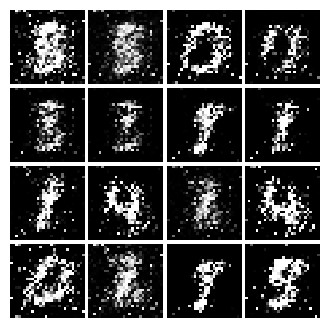

Epoch: 2, Iter: 1360, D: 1.248, G:1.639


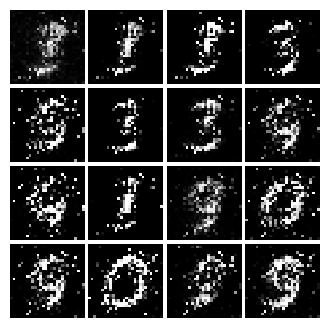

Epoch: 2, Iter: 1380, D: 1.194, G:1.093


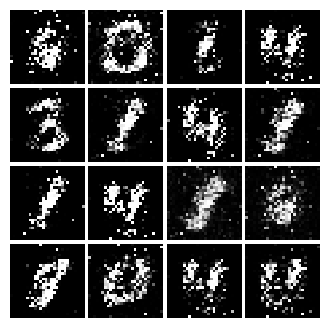

Epoch: 2, Iter: 1400, D: 1.231, G:1.302


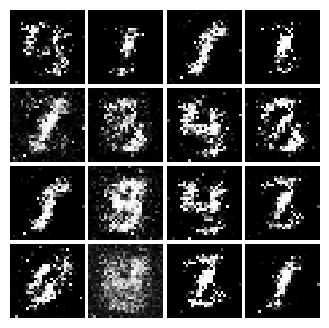

Epoch: 3, Iter: 1420, D: 1.201, G:1.442


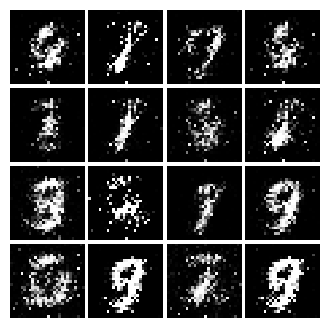

Epoch: 3, Iter: 1440, D: 1.319, G:1.125


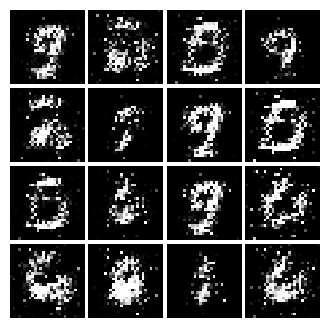

Epoch: 3, Iter: 1460, D: 1.197, G:1.031


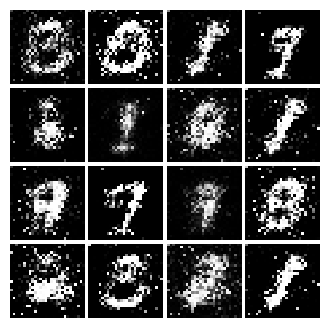

Epoch: 3, Iter: 1480, D: 1.209, G:1.331


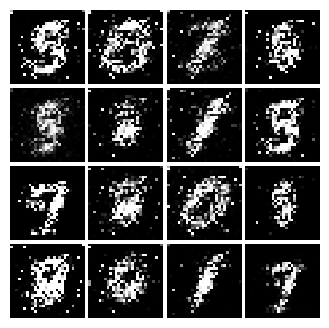

Epoch: 3, Iter: 1500, D: 1.24, G:1.013


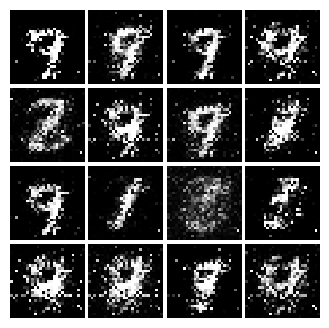

Epoch: 3, Iter: 1520, D: 1.343, G:1.05


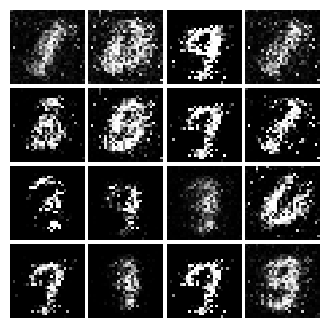

Epoch: 3, Iter: 1540, D: 1.306, G:0.9468


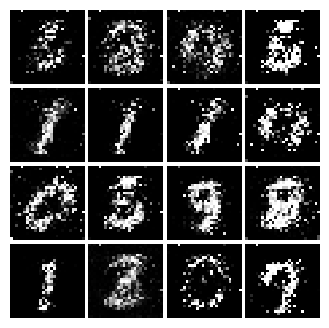

Epoch: 3, Iter: 1560, D: 1.322, G:1.014


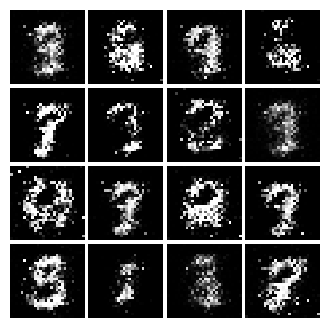

Epoch: 3, Iter: 1580, D: 1.424, G:0.842


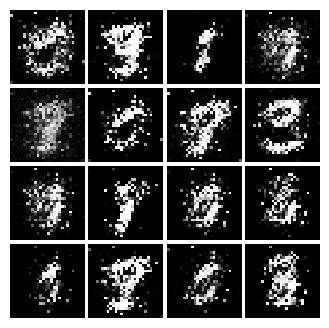

Epoch: 3, Iter: 1600, D: 1.236, G:0.9162


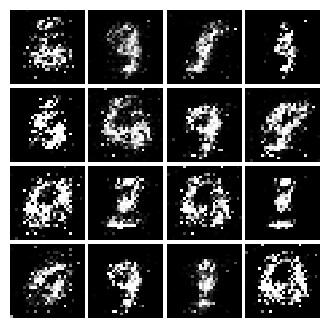

Epoch: 3, Iter: 1620, D: 1.113, G:1.195


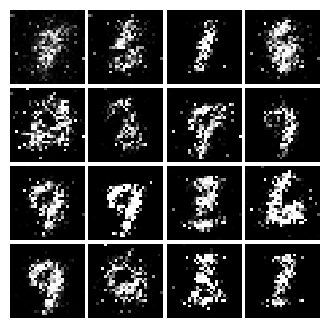

Epoch: 3, Iter: 1640, D: 1.313, G:1.603


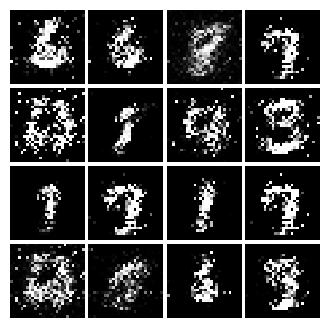

Epoch: 3, Iter: 1660, D: 1.183, G:1.271


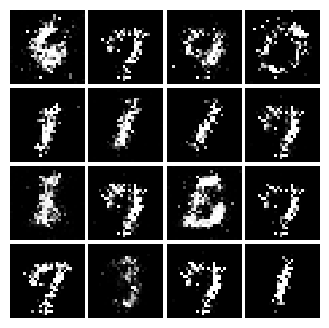

Epoch: 3, Iter: 1680, D: 1.334, G:0.7915


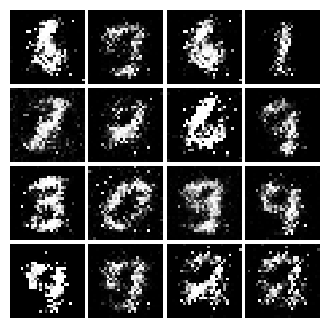

Epoch: 3, Iter: 1700, D: 1.273, G:1.167


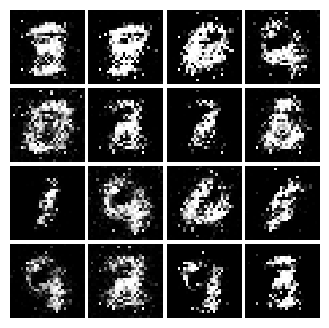

Epoch: 3, Iter: 1720, D: 1.157, G:1.034


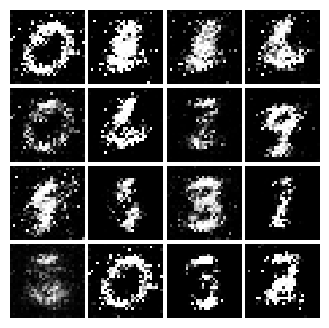

Epoch: 3, Iter: 1740, D: 1.203, G:0.9194


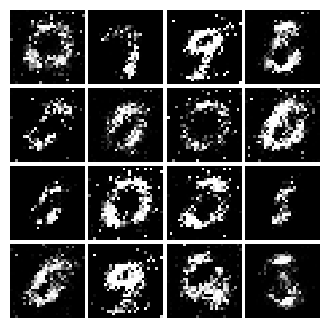

Epoch: 3, Iter: 1760, D: 1.257, G:0.9231


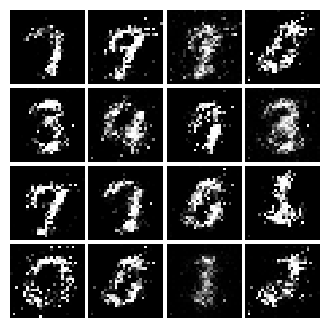

Epoch: 3, Iter: 1780, D: 1.327, G:0.8739


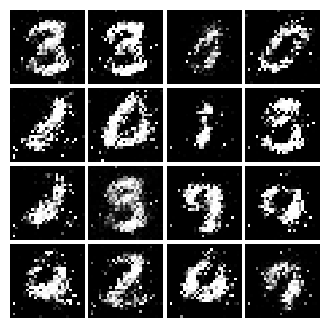

Epoch: 3, Iter: 1800, D: 1.244, G:0.854


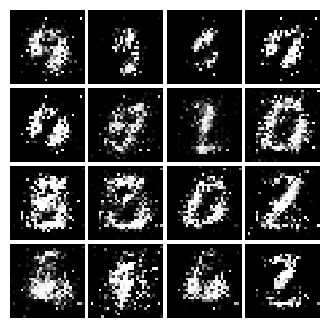

Epoch: 3, Iter: 1820, D: 1.373, G:0.7636


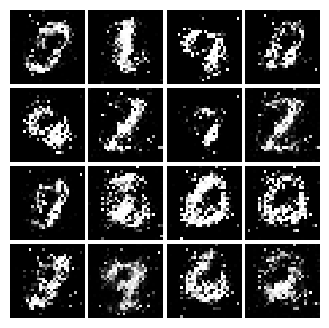

Epoch: 3, Iter: 1840, D: 1.287, G:0.959


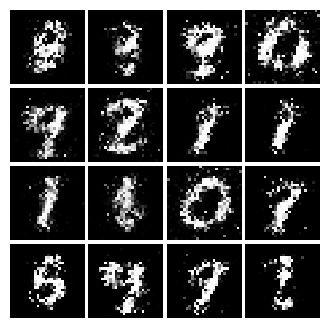

Epoch: 3, Iter: 1860, D: 1.335, G:1.758


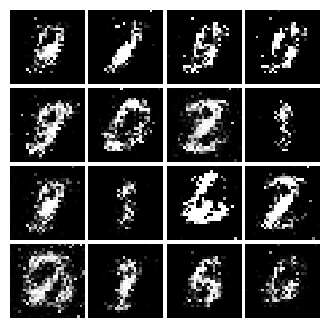

Epoch: 4, Iter: 1880, D: 1.294, G:0.8596


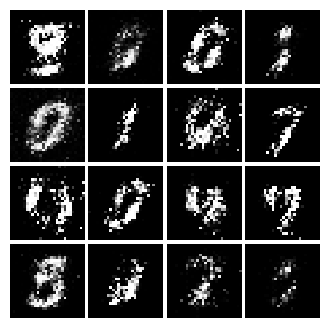

Epoch: 4, Iter: 1900, D: 1.307, G:0.8215


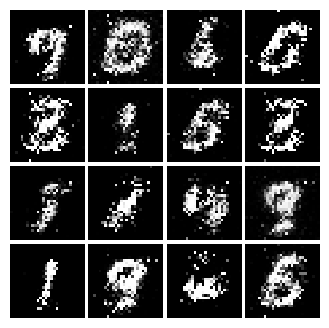

Epoch: 4, Iter: 1920, D: 1.211, G:0.9216


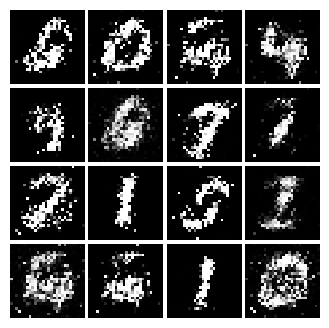

Epoch: 4, Iter: 1940, D: 1.383, G:0.7883


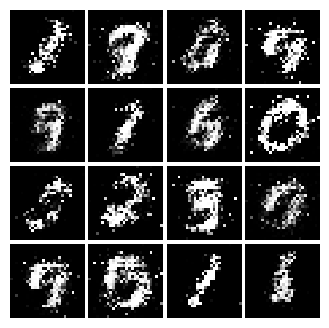

Epoch: 4, Iter: 1960, D: 1.318, G:0.9386


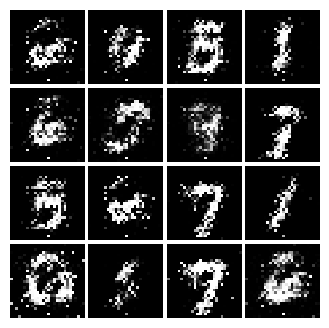

Epoch: 4, Iter: 1980, D: 1.3, G:0.8133


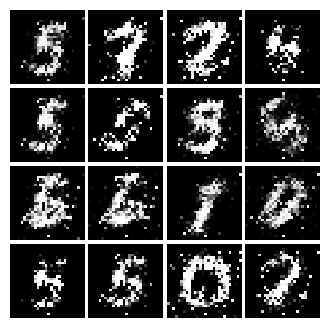

Epoch: 4, Iter: 2000, D: 1.348, G:0.9799


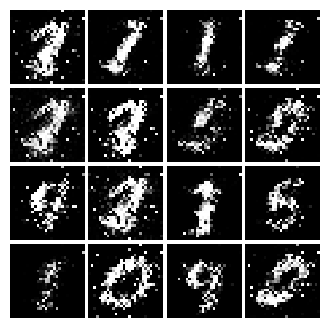

Epoch: 4, Iter: 2020, D: 1.381, G:0.9166


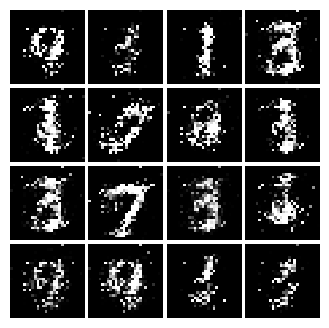

Epoch: 4, Iter: 2040, D: 1.25, G:1.065


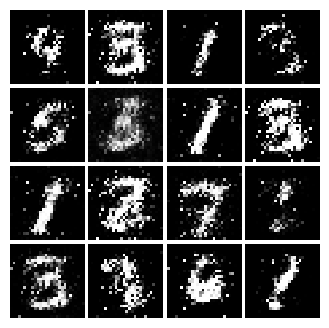

Epoch: 4, Iter: 2060, D: 1.353, G:0.8584


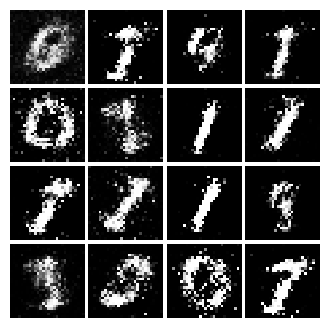

Epoch: 4, Iter: 2080, D: 1.29, G:0.8442


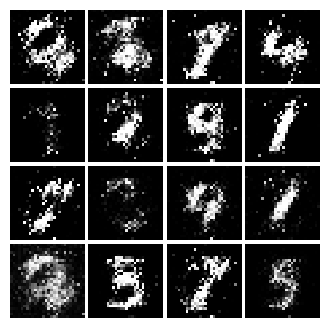

Epoch: 4, Iter: 2100, D: 1.254, G:0.8659


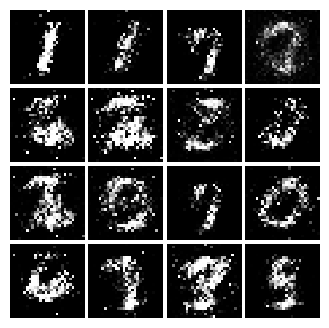

Epoch: 4, Iter: 2120, D: 1.312, G:1.089


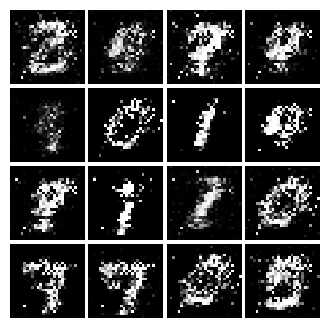

Epoch: 4, Iter: 2140, D: 1.226, G:0.7914


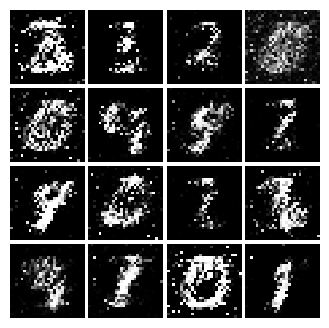

Epoch: 4, Iter: 2160, D: 1.486, G:0.8701


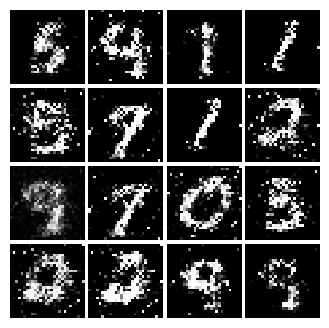

Epoch: 4, Iter: 2180, D: 1.31, G:0.8495


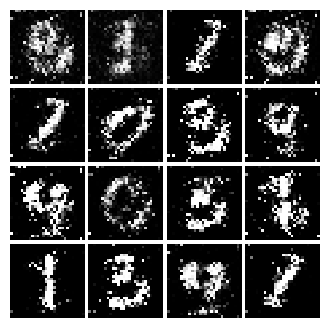

Epoch: 4, Iter: 2200, D: 1.296, G:0.9075


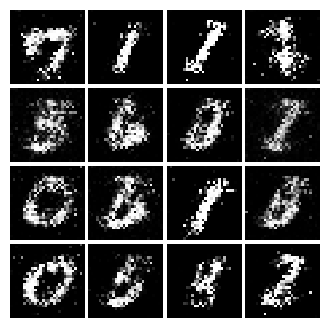

Epoch: 4, Iter: 2220, D: 1.193, G:1.078


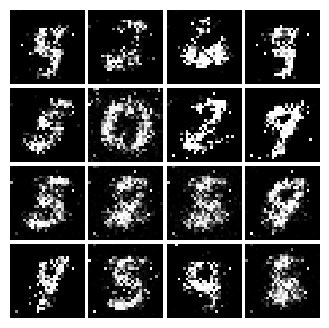

Epoch: 4, Iter: 2240, D: 1.372, G:0.8439


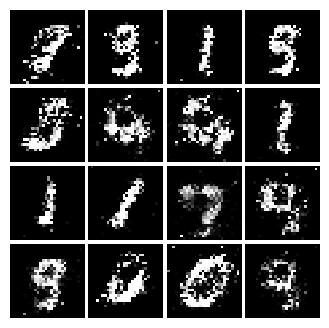

Epoch: 4, Iter: 2260, D: 1.34, G:0.9233


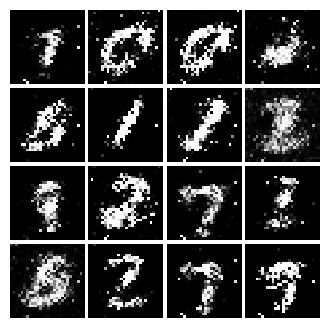

Epoch: 4, Iter: 2280, D: 1.339, G:0.8688


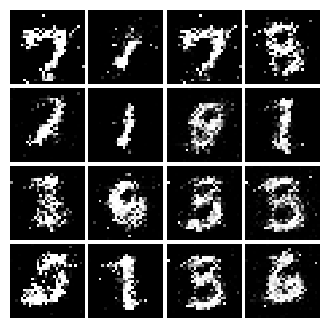

Epoch: 4, Iter: 2300, D: 1.259, G:0.9456


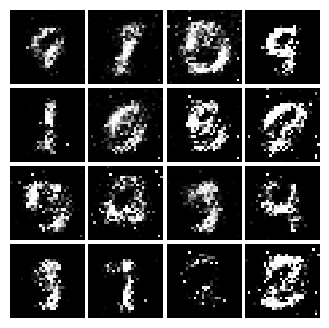

Epoch: 4, Iter: 2320, D: 1.392, G:0.8528


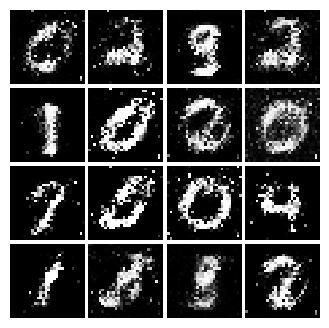

Epoch: 4, Iter: 2340, D: 1.203, G:1.005


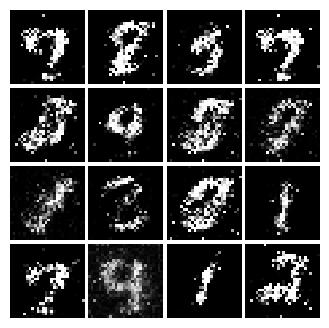

Epoch: 5, Iter: 2360, D: 1.318, G:0.8036


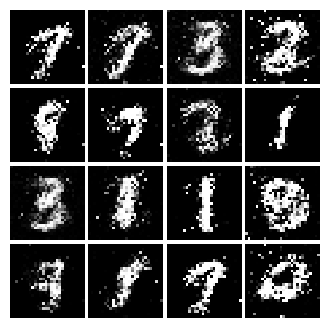

Epoch: 5, Iter: 2380, D: 1.287, G:0.8453


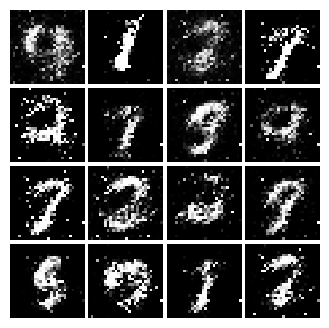

Epoch: 5, Iter: 2400, D: 1.33, G:0.9232


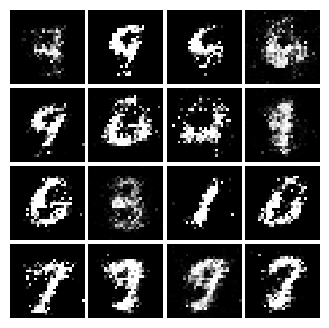

Epoch: 5, Iter: 2420, D: 1.339, G:0.8551


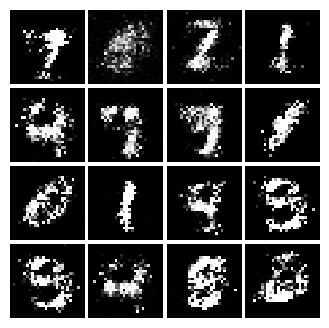

Epoch: 5, Iter: 2440, D: 1.329, G:0.7548


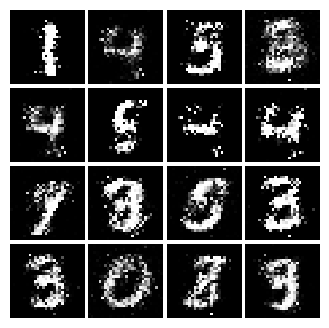

Epoch: 5, Iter: 2460, D: 1.178, G:1.02


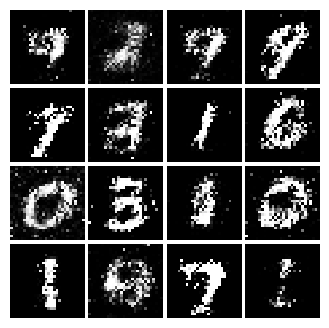

Epoch: 5, Iter: 2480, D: 1.289, G:0.9066


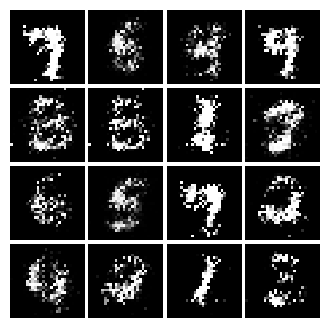

Epoch: 5, Iter: 2500, D: 1.319, G:0.782


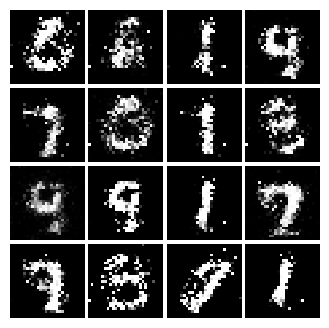

Epoch: 5, Iter: 2520, D: 1.434, G:0.7337


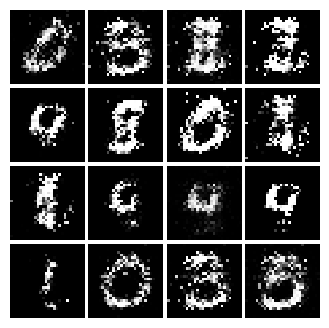

Epoch: 5, Iter: 2540, D: 1.323, G:0.8576


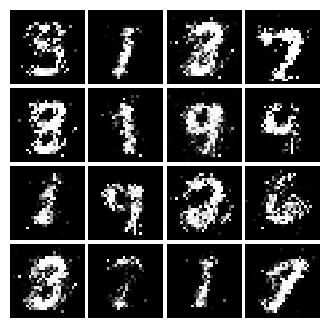

Epoch: 5, Iter: 2560, D: 1.476, G:0.7692


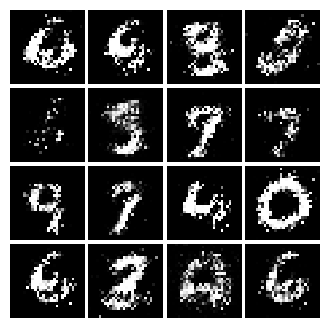

Epoch: 5, Iter: 2580, D: 1.293, G:0.8618


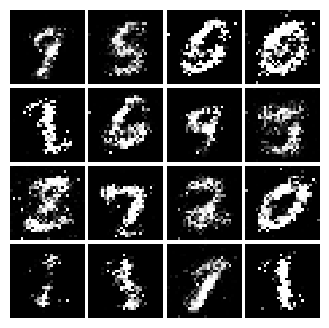

Epoch: 5, Iter: 2600, D: 1.479, G:0.9061


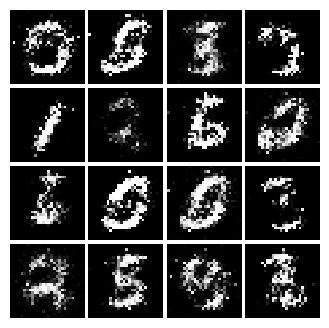

Epoch: 5, Iter: 2620, D: 1.281, G:0.8684


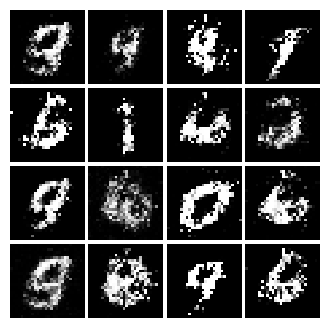

Epoch: 5, Iter: 2640, D: 1.293, G:1.063


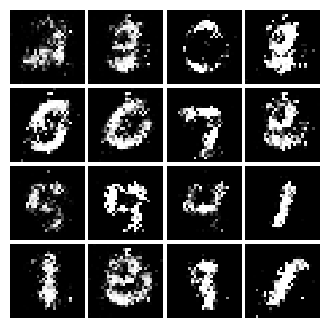

Epoch: 5, Iter: 2660, D: 1.19, G:0.8735


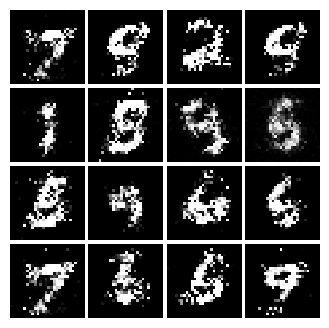

Epoch: 5, Iter: 2680, D: 1.49, G:0.88


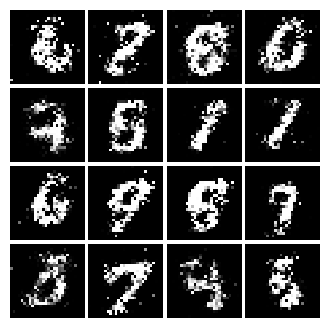

Epoch: 5, Iter: 2700, D: 1.359, G:0.741


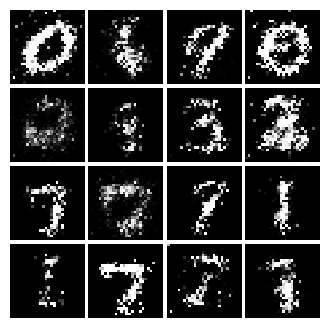

Epoch: 5, Iter: 2720, D: 1.299, G:0.8538


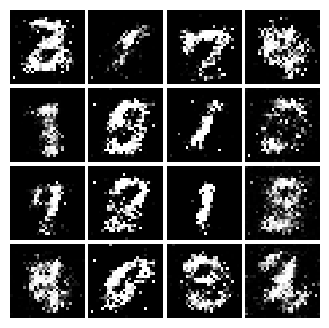

Epoch: 5, Iter: 2740, D: 1.24, G:0.9217


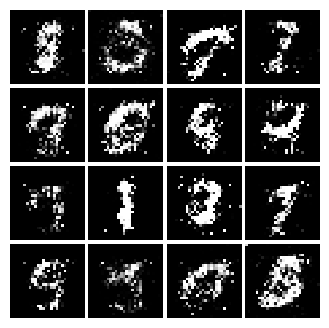

Epoch: 5, Iter: 2760, D: 1.386, G:0.7926


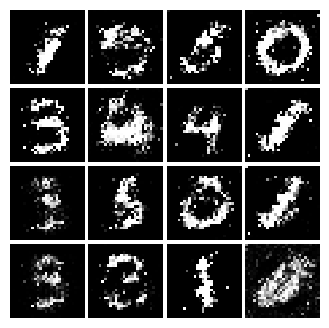

Epoch: 5, Iter: 2780, D: 1.351, G:0.8052


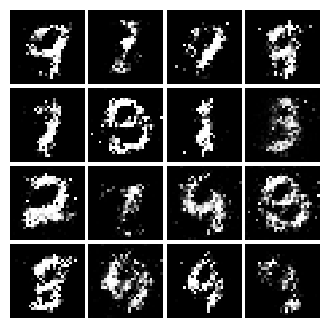

Epoch: 5, Iter: 2800, D: 1.268, G:0.6475


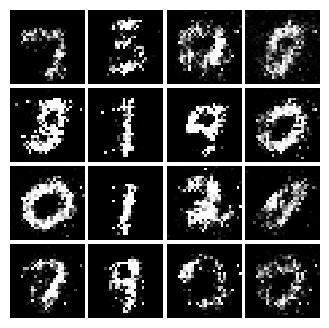

Epoch: 6, Iter: 2820, D: 1.455, G:0.8687


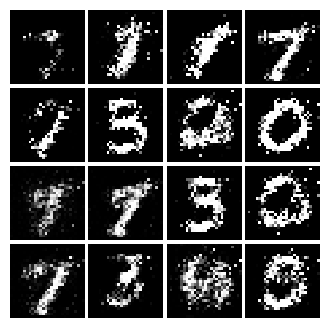

Epoch: 6, Iter: 2840, D: 1.37, G:0.8258


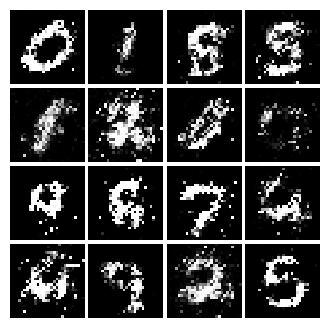

Epoch: 6, Iter: 2860, D: 1.326, G:0.8088


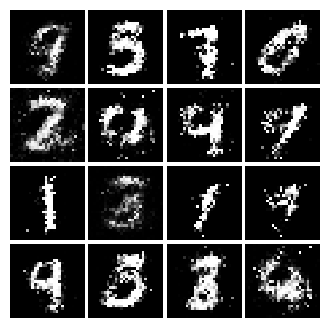

Epoch: 6, Iter: 2880, D: 1.24, G:0.9142


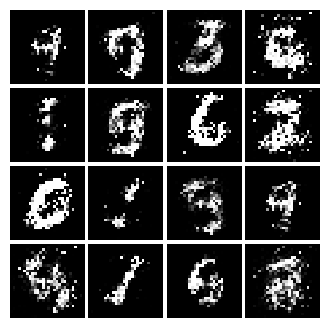

Epoch: 6, Iter: 2900, D: 1.28, G:0.8002


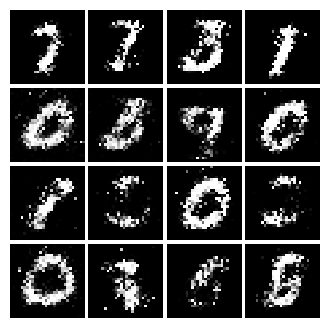

Epoch: 6, Iter: 2920, D: 1.36, G:0.7909


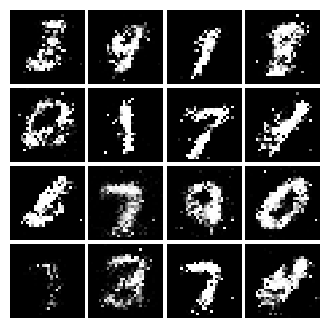

Epoch: 6, Iter: 2940, D: 1.391, G:0.747


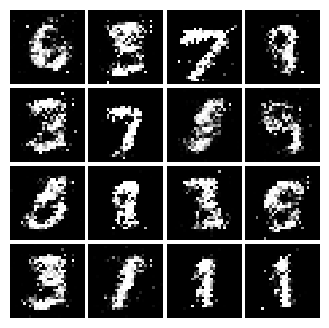

Epoch: 6, Iter: 2960, D: 1.328, G:0.7383


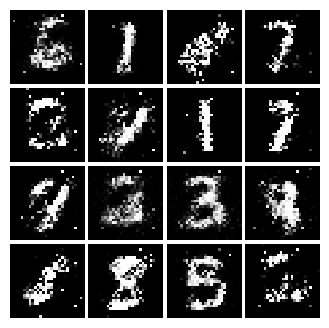

Epoch: 6, Iter: 2980, D: 1.344, G:0.7784


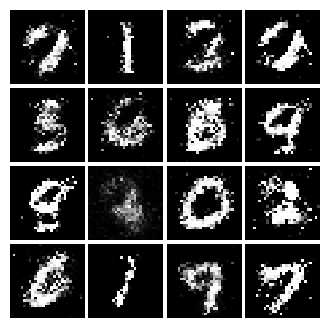

Epoch: 6, Iter: 3000, D: 1.394, G:0.7796


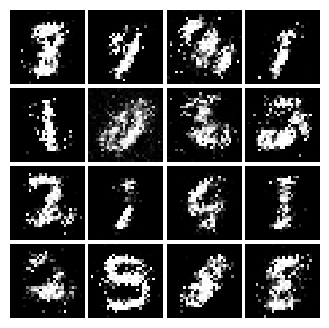

Epoch: 6, Iter: 3020, D: 1.358, G:0.7767


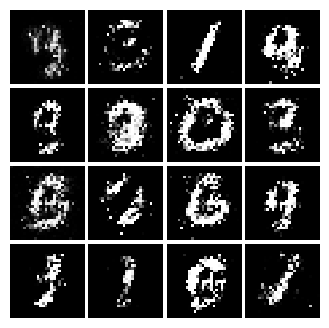

Epoch: 6, Iter: 3040, D: 1.408, G:0.8521


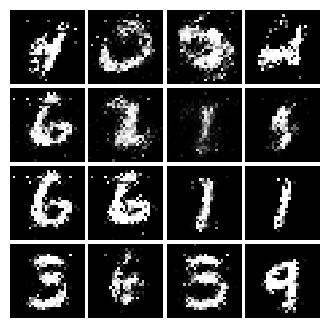

Epoch: 6, Iter: 3060, D: 1.341, G:0.857


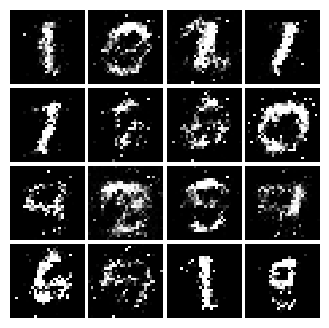

Epoch: 6, Iter: 3080, D: 1.299, G:0.7421


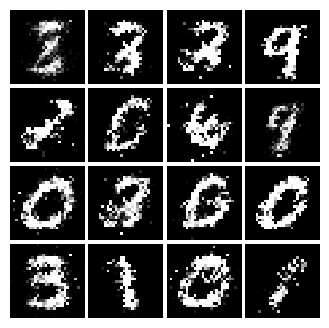

Epoch: 6, Iter: 3100, D: 1.362, G:0.7389


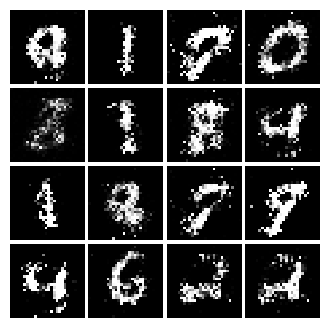

Epoch: 6, Iter: 3120, D: 1.333, G:0.7154


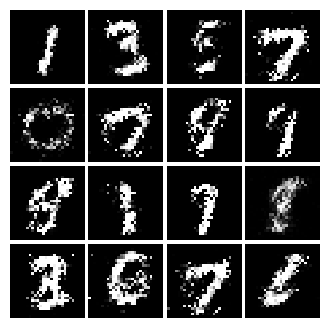

Epoch: 6, Iter: 3140, D: 1.347, G:0.9211


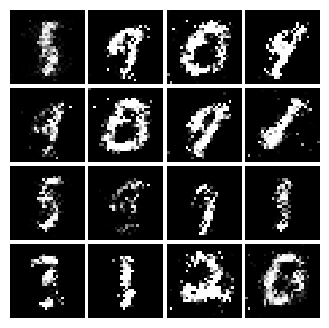

Epoch: 6, Iter: 3160, D: 1.359, G:0.7838


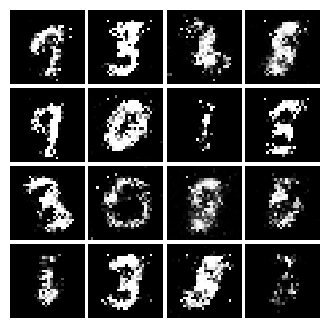

Epoch: 6, Iter: 3180, D: 1.346, G:0.7467


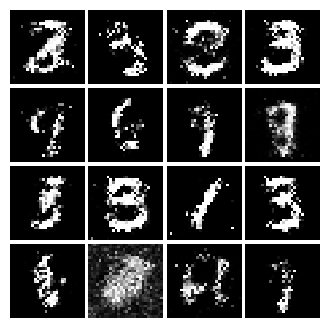

Epoch: 6, Iter: 3200, D: 1.365, G:0.7607


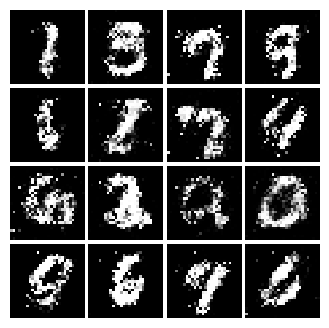

Epoch: 6, Iter: 3220, D: 1.309, G:0.7647


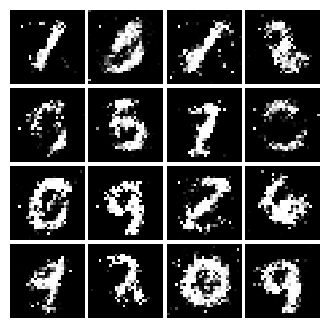

Epoch: 6, Iter: 3240, D: 1.342, G:0.7683


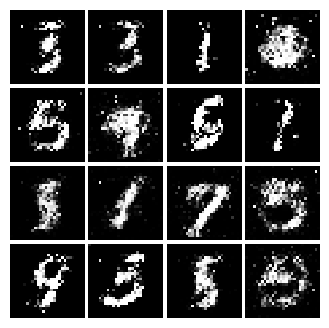

Epoch: 6, Iter: 3260, D: 1.325, G:0.7379


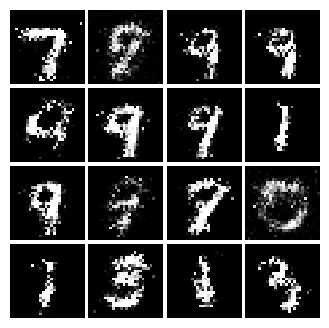

Epoch: 6, Iter: 3280, D: 1.338, G:0.7358


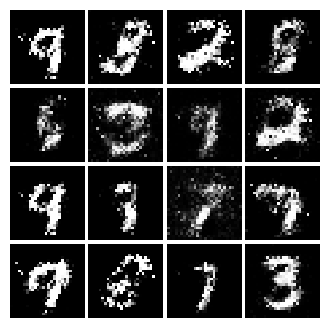

Epoch: 7, Iter: 3300, D: 1.341, G:0.762


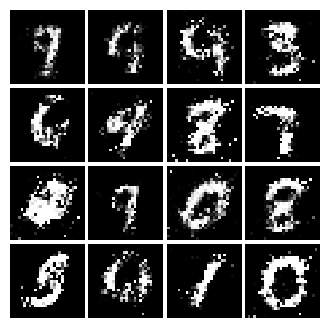

Epoch: 7, Iter: 3320, D: 1.324, G:0.8275


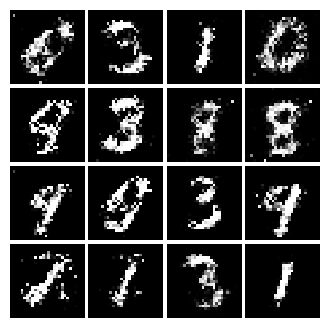

Epoch: 7, Iter: 3340, D: 1.286, G:0.9447


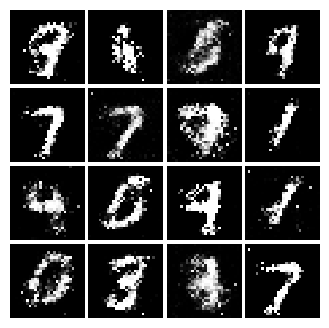

Epoch: 7, Iter: 3360, D: 1.358, G:0.7554


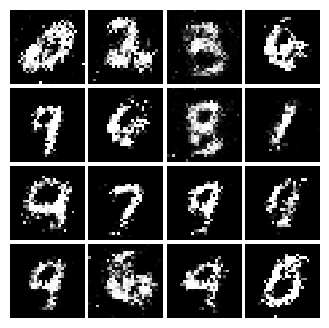

Epoch: 7, Iter: 3380, D: 1.348, G:0.7606


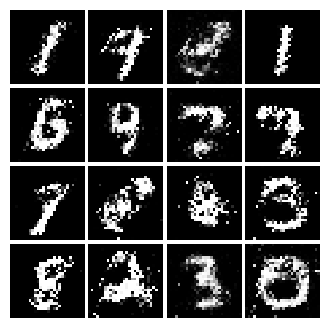

Epoch: 7, Iter: 3400, D: 1.358, G:0.7636


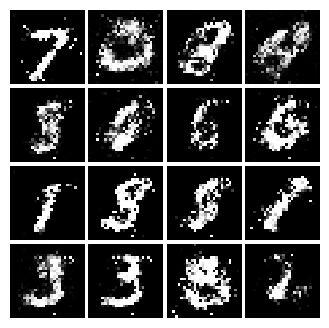

Epoch: 7, Iter: 3420, D: 1.292, G:0.814


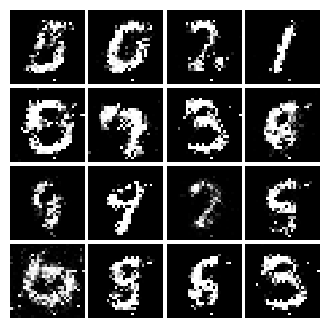

Epoch: 7, Iter: 3440, D: 1.426, G:0.8052


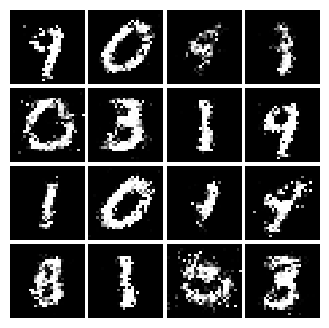

Epoch: 7, Iter: 3460, D: 1.341, G:0.7901


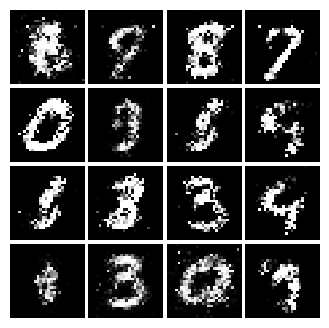

Epoch: 7, Iter: 3480, D: 1.3, G:0.7418


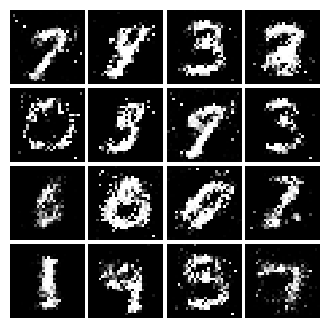

Epoch: 7, Iter: 3500, D: 1.325, G:0.7825


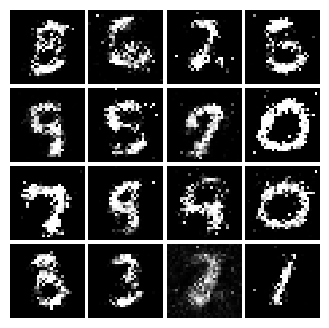

Epoch: 7, Iter: 3520, D: 1.338, G:0.8343


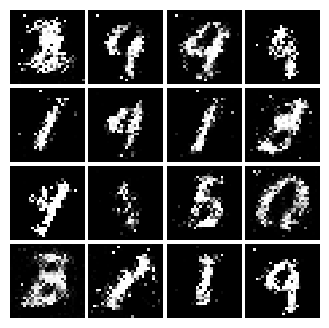

Epoch: 7, Iter: 3540, D: 1.338, G:0.747


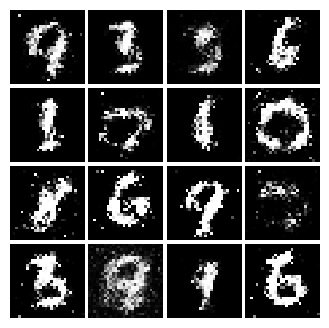

Epoch: 7, Iter: 3560, D: 1.407, G:0.7381


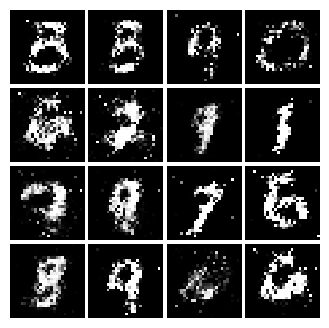

Epoch: 7, Iter: 3580, D: 1.404, G:0.7834


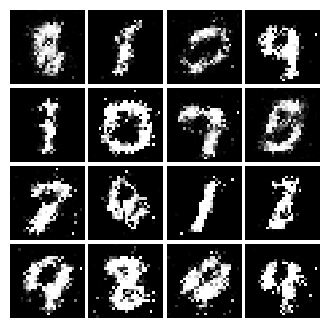

Epoch: 7, Iter: 3600, D: 1.355, G:0.8341


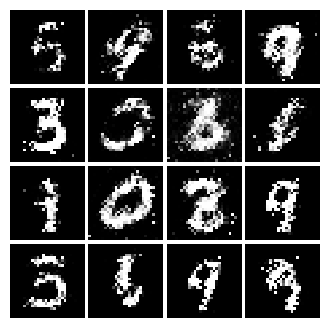

Epoch: 7, Iter: 3620, D: 1.303, G:0.686


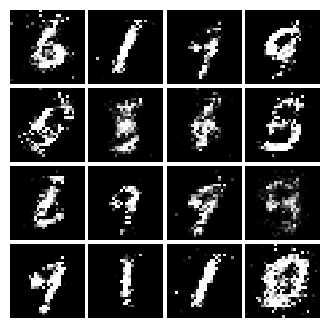

Epoch: 7, Iter: 3640, D: 1.439, G:0.7821


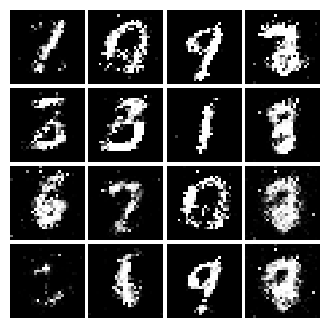

Epoch: 7, Iter: 3660, D: 1.345, G:0.7611


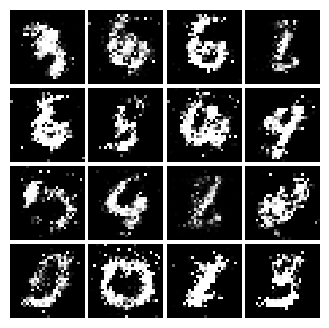

Epoch: 7, Iter: 3680, D: 1.422, G:0.77


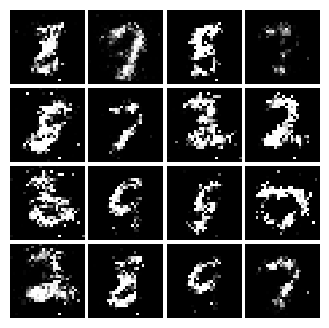

Epoch: 7, Iter: 3700, D: 1.415, G:0.7399


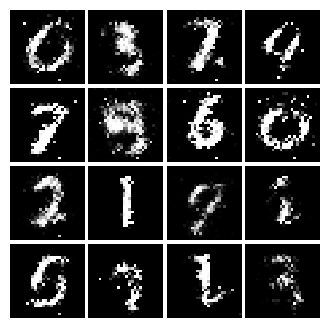

Epoch: 7, Iter: 3720, D: 1.232, G:0.8892


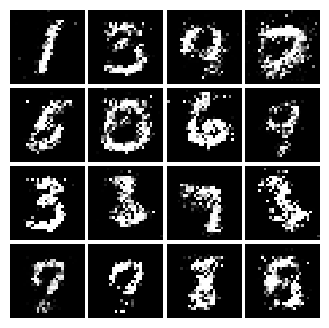

Epoch: 7, Iter: 3740, D: 1.314, G:0.7481


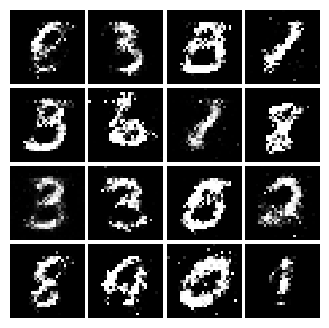

Epoch: 8, Iter: 3760, D: 1.34, G:0.7476


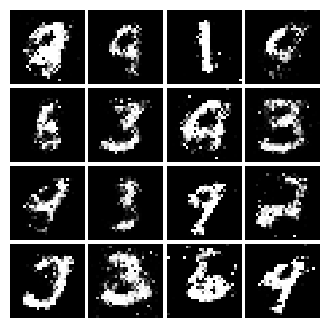

Epoch: 8, Iter: 3780, D: 1.36, G:0.7413


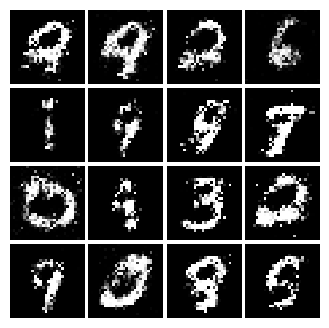

Epoch: 8, Iter: 3800, D: 1.371, G:0.7972


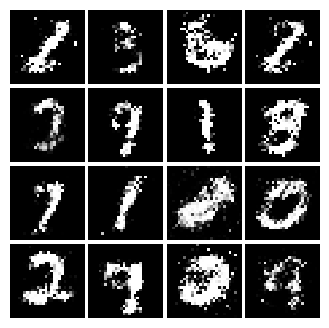

Epoch: 8, Iter: 3820, D: 1.34, G:0.6946


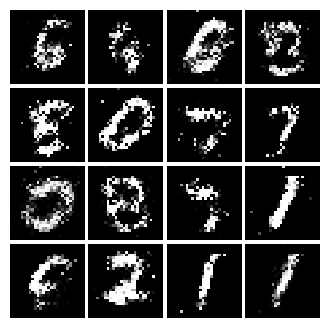

Epoch: 8, Iter: 3840, D: 1.329, G:0.806


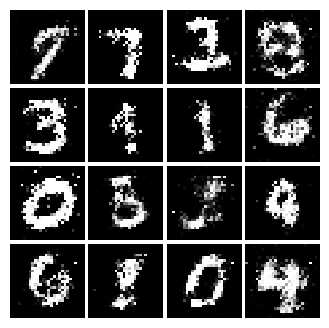

Epoch: 8, Iter: 3860, D: 1.372, G:0.8498


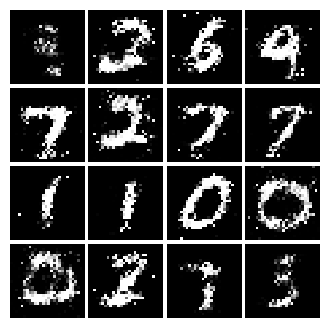

Epoch: 8, Iter: 3880, D: 1.375, G:0.7825


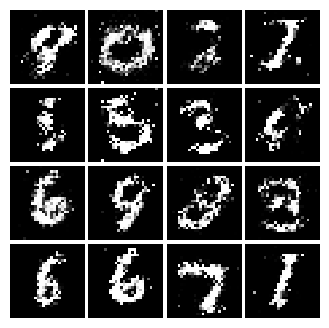

Epoch: 8, Iter: 3900, D: 1.382, G:0.7722


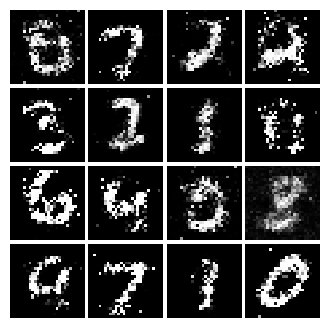

Epoch: 8, Iter: 3920, D: 1.328, G:0.7445


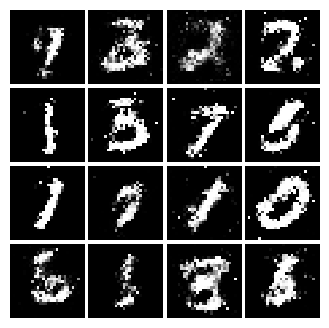

Epoch: 8, Iter: 3940, D: 1.368, G:0.7958


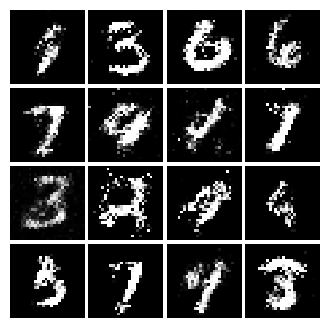

Epoch: 8, Iter: 3960, D: 1.377, G:0.7442


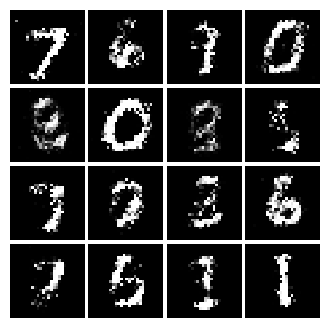

Epoch: 8, Iter: 3980, D: 1.364, G:0.7993


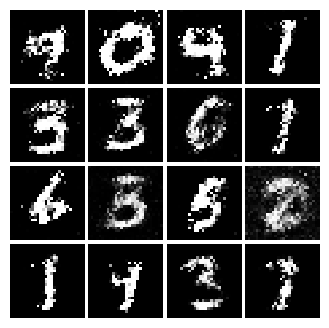

Epoch: 8, Iter: 4000, D: 1.376, G:0.7546


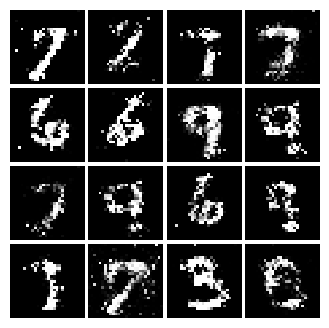

Epoch: 8, Iter: 4020, D: 1.379, G:0.7512


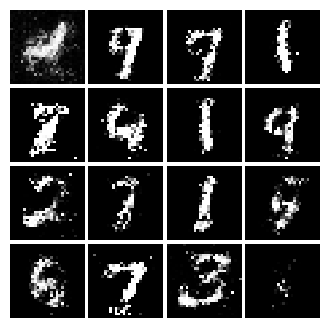

Epoch: 8, Iter: 4040, D: 1.373, G:0.7062


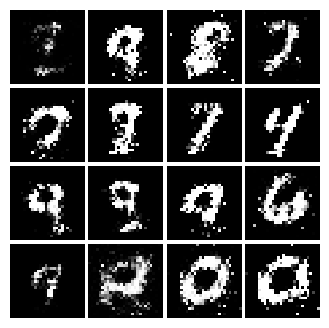

Epoch: 8, Iter: 4060, D: 1.321, G:0.7624


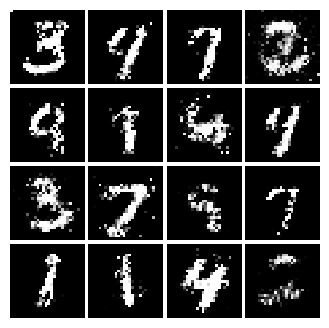

Epoch: 8, Iter: 4080, D: 1.379, G:0.6907


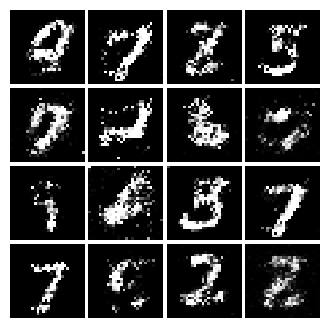

Epoch: 8, Iter: 4100, D: 1.408, G:0.8999


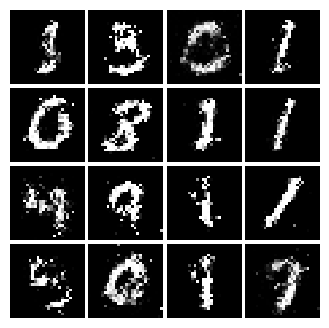

Epoch: 8, Iter: 4120, D: 1.306, G:0.7635


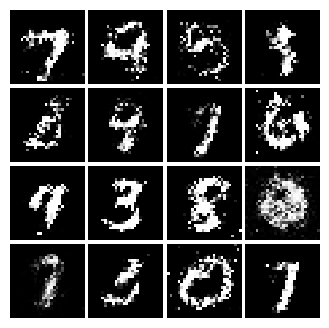

Epoch: 8, Iter: 4140, D: 1.432, G:0.8014


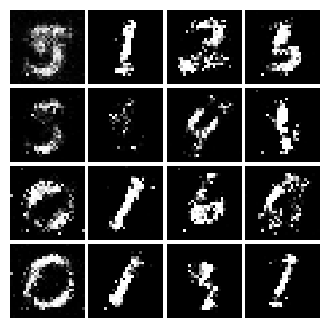

Epoch: 8, Iter: 4160, D: 1.395, G:0.8851


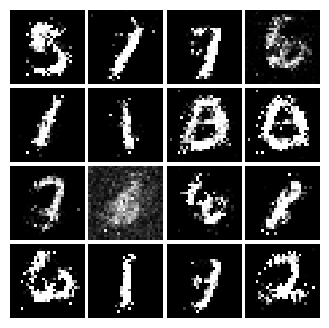

Epoch: 8, Iter: 4180, D: 1.331, G:0.75


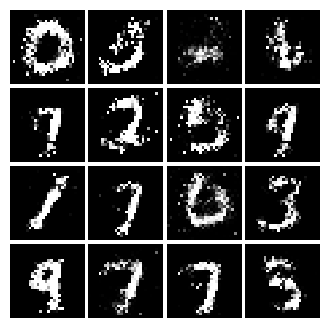

Epoch: 8, Iter: 4200, D: 1.34, G:0.7813


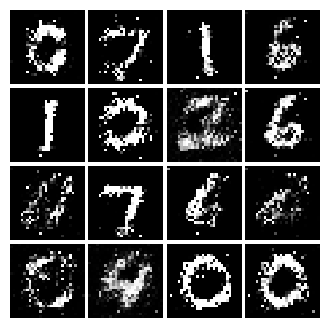

Epoch: 8, Iter: 4220, D: 1.298, G:0.882


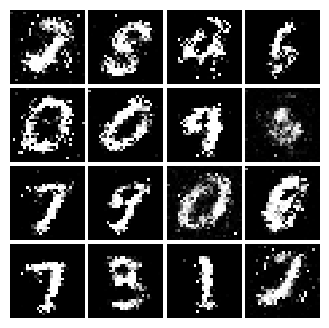

Epoch: 9, Iter: 4240, D: 1.427, G:0.6872


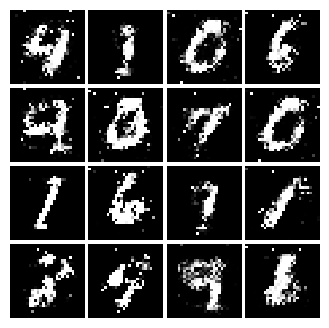

Epoch: 9, Iter: 4260, D: 1.299, G:0.6924


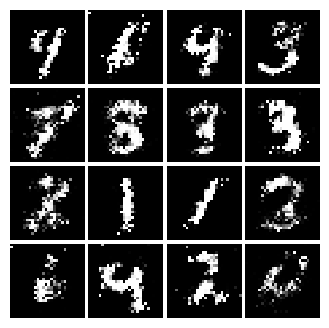

Epoch: 9, Iter: 4280, D: 1.354, G:0.8083


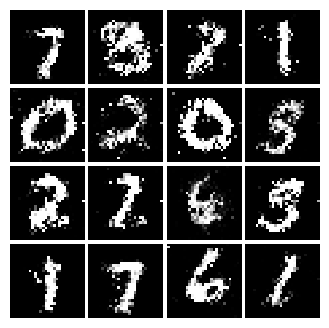

Epoch: 9, Iter: 4300, D: 1.367, G:0.6585


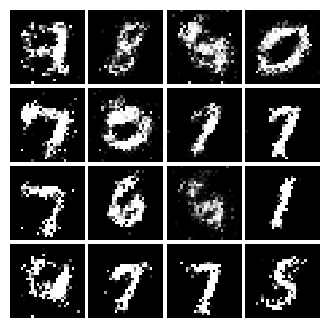

Epoch: 9, Iter: 4320, D: 1.326, G:0.8019


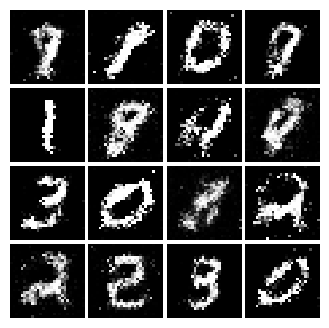

Epoch: 9, Iter: 4340, D: 1.368, G:0.7838


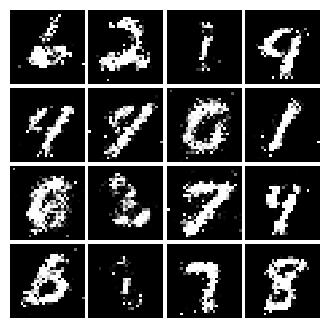

Epoch: 9, Iter: 4360, D: 1.374, G:0.7434


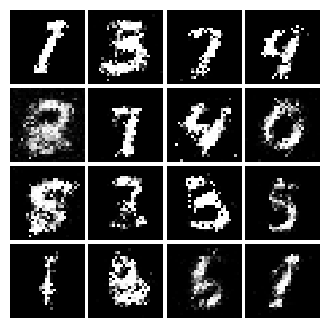

Epoch: 9, Iter: 4380, D: 1.388, G:0.7898


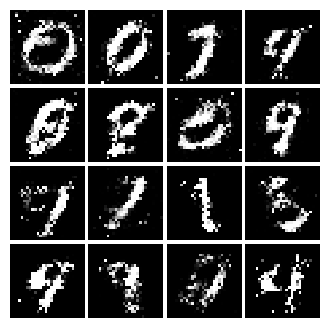

Epoch: 9, Iter: 4400, D: 1.289, G:0.8402


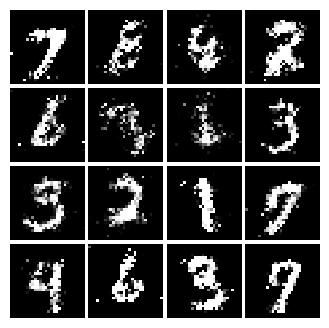

Epoch: 9, Iter: 4420, D: 1.347, G:0.719


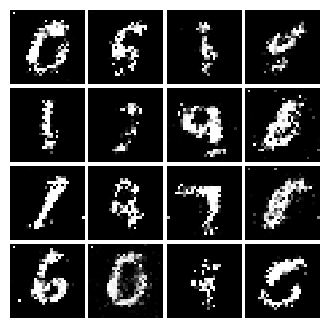

Epoch: 9, Iter: 4440, D: 1.346, G:0.8441


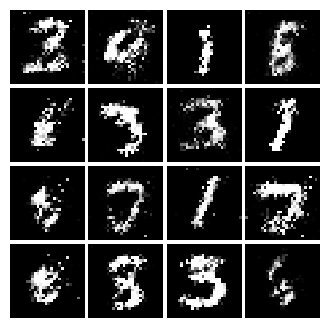

Epoch: 9, Iter: 4460, D: 1.357, G:0.7714


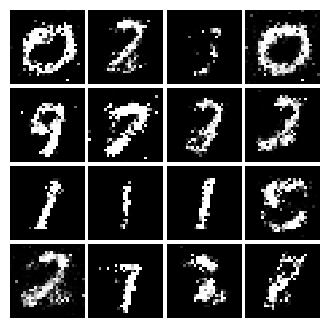

Epoch: 9, Iter: 4480, D: 1.325, G:0.74


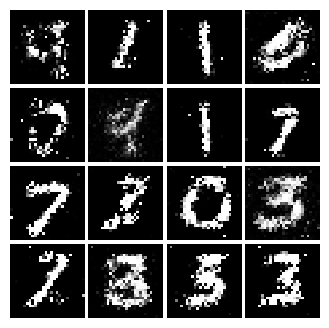

Epoch: 9, Iter: 4500, D: 1.369, G:0.7432


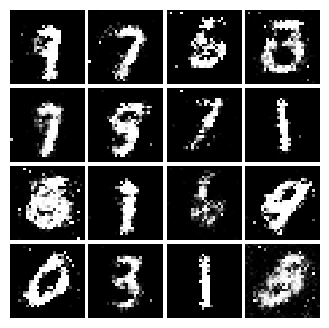

Epoch: 9, Iter: 4520, D: 1.418, G:0.7576


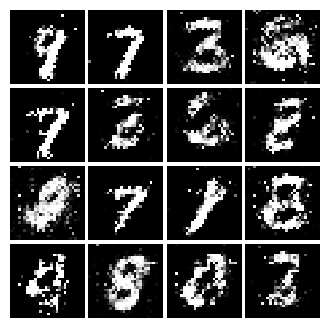

Epoch: 9, Iter: 4540, D: 1.364, G:0.7632


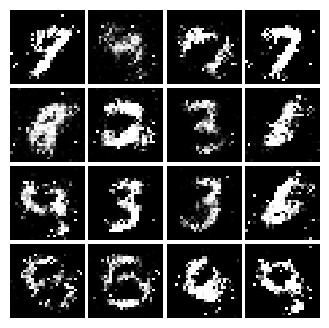

Epoch: 9, Iter: 4560, D: 1.32, G:0.7602


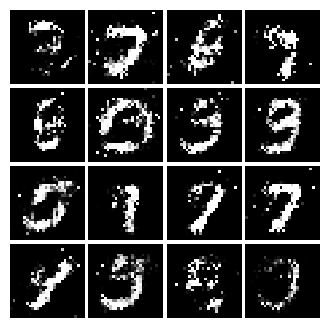

Epoch: 9, Iter: 4580, D: 1.391, G:0.715


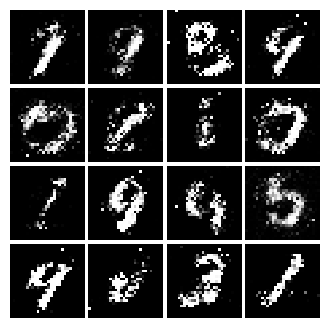

Epoch: 9, Iter: 4600, D: 1.421, G:0.7243


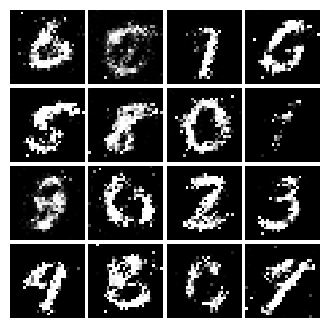

Epoch: 9, Iter: 4620, D: 1.389, G:0.8901


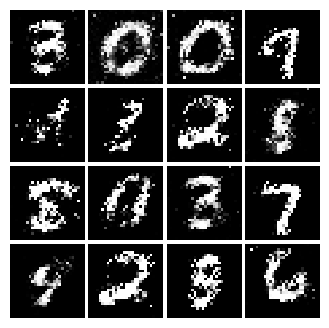

Epoch: 9, Iter: 4640, D: 1.331, G:0.7593


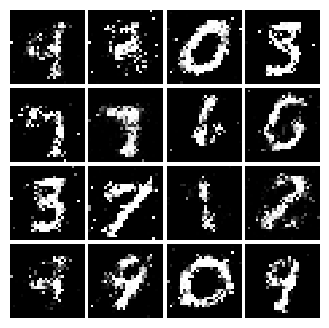

Epoch: 9, Iter: 4660, D: 1.333, G:0.7925


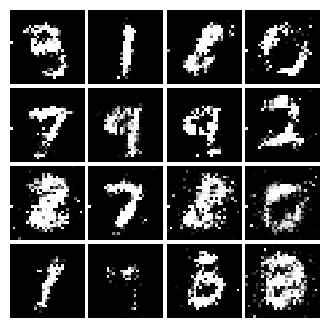

Epoch: 9, Iter: 4680, D: 1.393, G:0.8175


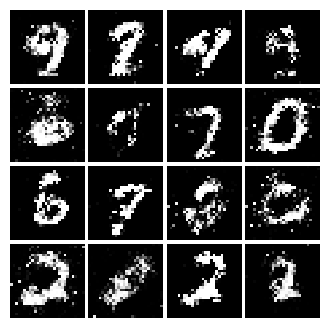

Final images


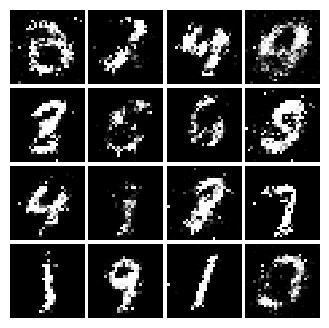

In [17]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [18]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = 0.5*tf.reduce_mean(tf.square(scores_real - 1)) + 0.5*tf.reduce_mean(tf.square(scores_fake))
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = 0.5*tf.reduce_mean((tf.square(scores_fake-1)))
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [19]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.4267, G:0.3976


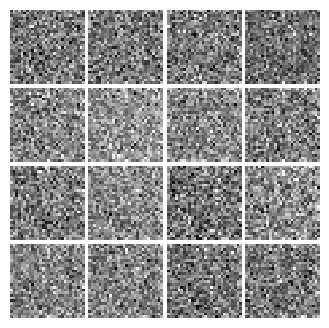

Epoch: 0, Iter: 20, D: 0.1281, G:1.021


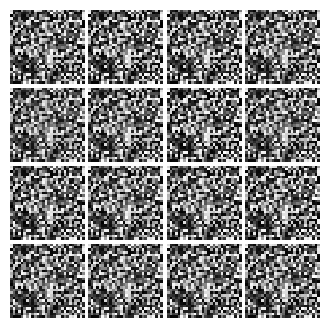

Epoch: 0, Iter: 40, D: 0.02683, G:0.8676


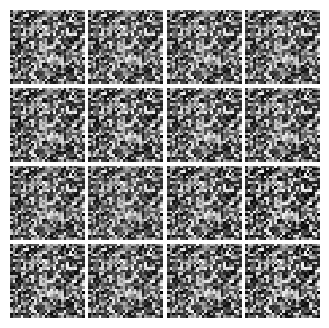

Epoch: 0, Iter: 60, D: 0.04826, G:0.641


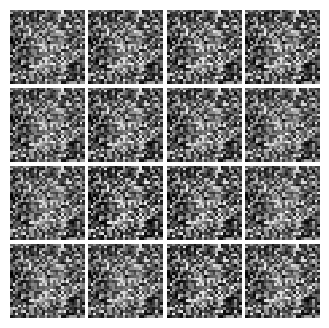

Epoch: 0, Iter: 80, D: 0.06773, G:0.5493


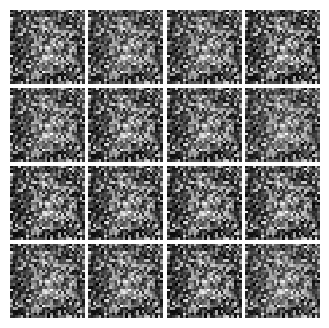

Epoch: 0, Iter: 100, D: 0.1755, G:1.183


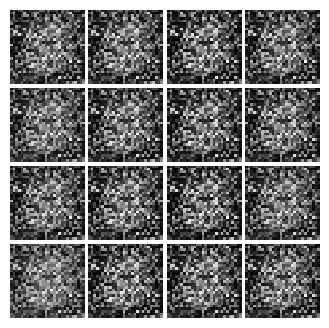

Epoch: 0, Iter: 120, D: 0.2531, G:0.5001


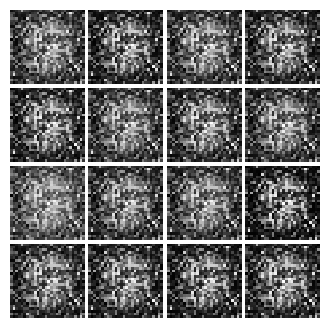

Epoch: 0, Iter: 140, D: 0.1102, G:0.3483


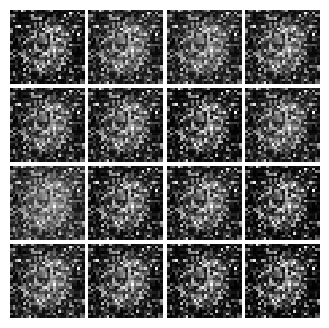

Epoch: 0, Iter: 160, D: 0.4364, G:0.004388


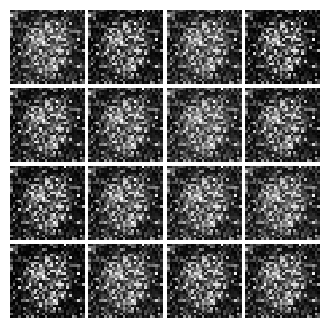

Epoch: 0, Iter: 180, D: 0.154, G:0.2435


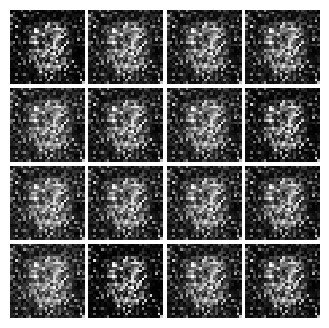

Epoch: 0, Iter: 200, D: 0.3218, G:0.1505


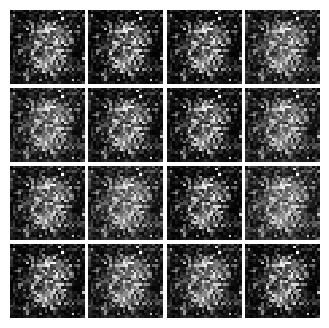

Epoch: 0, Iter: 220, D: 0.194, G:0.4435


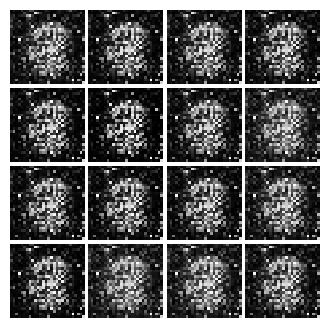

Epoch: 0, Iter: 240, D: 0.1324, G:0.2795


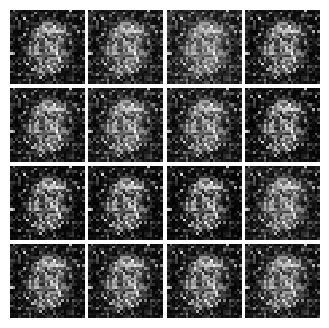

Epoch: 0, Iter: 260, D: 0.2182, G:0.5454


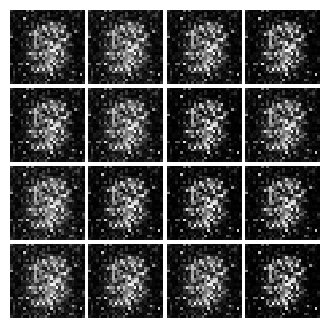

Epoch: 0, Iter: 280, D: 0.215, G:0.26


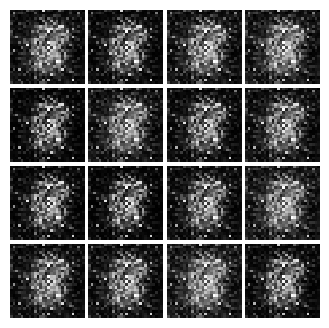

Epoch: 0, Iter: 300, D: 0.1652, G:0.4624


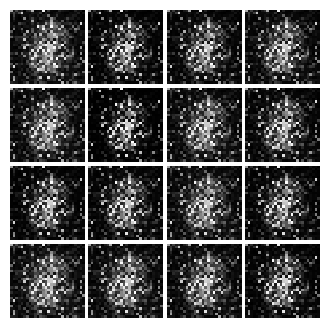

Epoch: 0, Iter: 320, D: 0.1406, G:0.9062


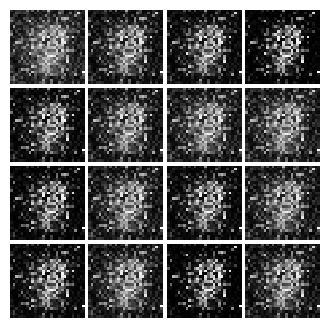

Epoch: 0, Iter: 340, D: 0.09373, G:0.5588


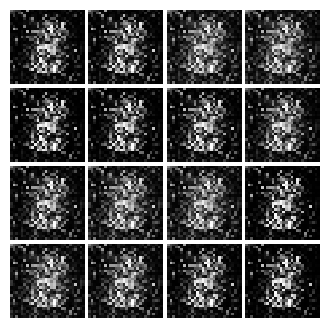

Epoch: 0, Iter: 360, D: 0.1398, G:0.7814


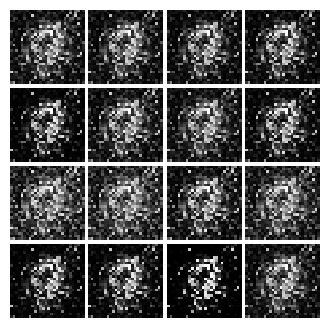

Epoch: 0, Iter: 380, D: 0.1627, G:0.4067


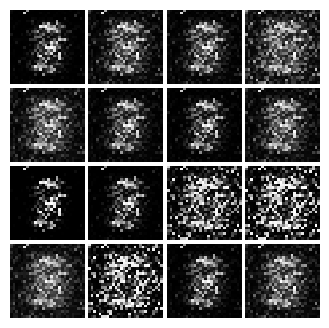

Epoch: 0, Iter: 400, D: 0.1775, G:0.2507


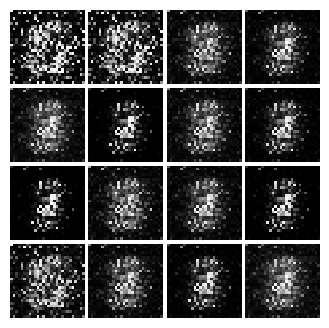

Epoch: 0, Iter: 420, D: 0.08571, G:0.5317


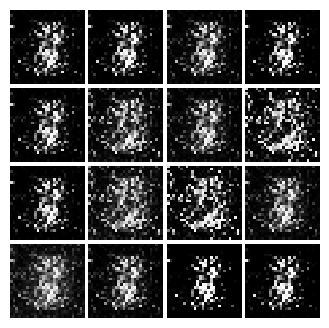

Epoch: 0, Iter: 440, D: 0.2895, G:0.04698


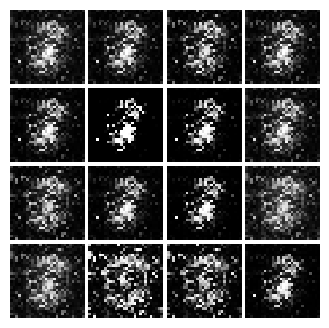

Epoch: 0, Iter: 460, D: 0.1778, G:0.2322


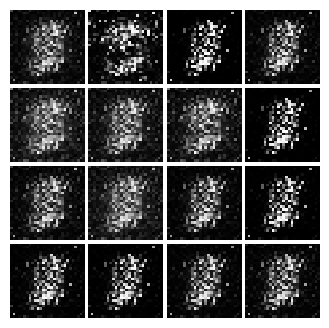

Epoch: 1, Iter: 480, D: 0.09135, G:0.4076


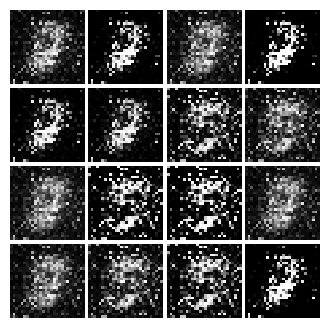

Epoch: 1, Iter: 500, D: 0.09429, G:0.5779


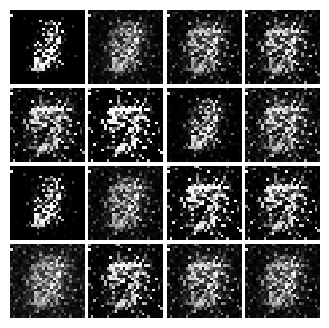

Epoch: 1, Iter: 520, D: 0.1024, G:0.423


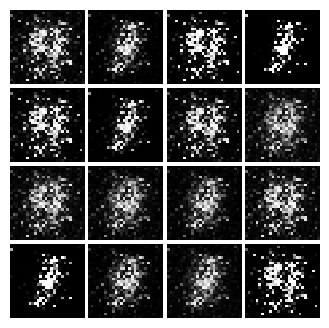

Epoch: 1, Iter: 540, D: 0.1236, G:0.4648


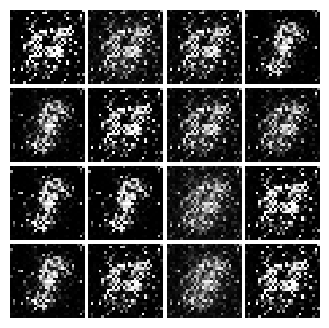

Epoch: 1, Iter: 560, D: 0.08787, G:0.5385


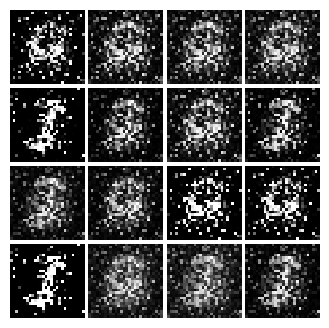

Epoch: 1, Iter: 580, D: 0.201, G:0.3283


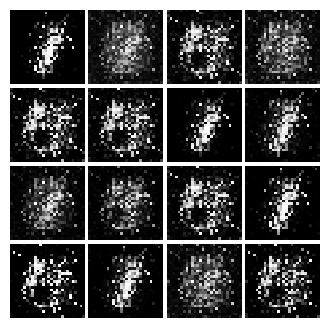

Epoch: 1, Iter: 600, D: 0.1269, G:0.4172


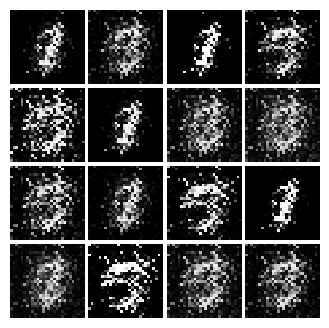

Epoch: 1, Iter: 620, D: 0.09663, G:0.4262


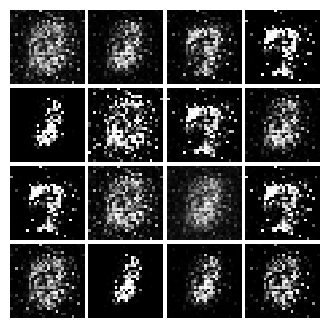

Epoch: 1, Iter: 640, D: 0.1006, G:0.4805


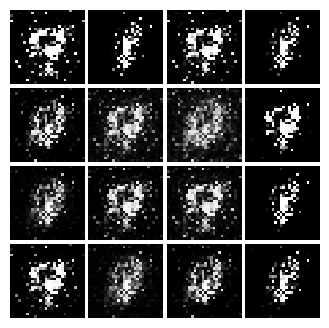

Epoch: 1, Iter: 660, D: 0.08484, G:0.8439


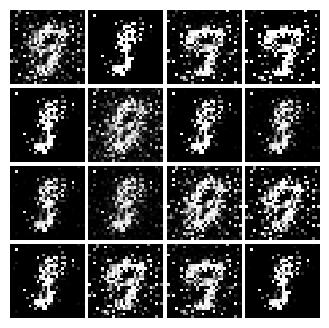

Epoch: 1, Iter: 680, D: 0.1337, G:0.413


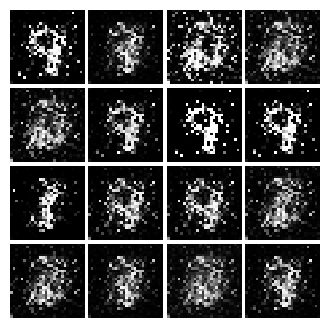

Epoch: 1, Iter: 700, D: 0.1317, G:0.3694


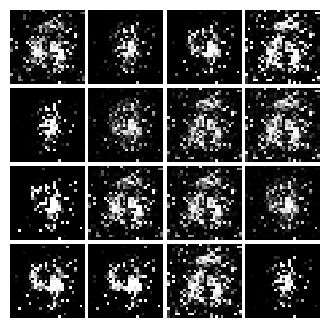

Epoch: 1, Iter: 720, D: 0.1122, G:0.3395


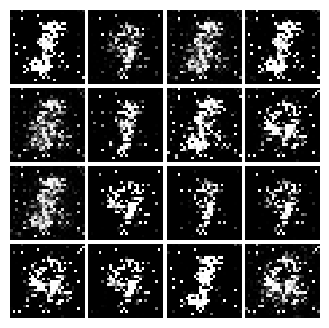

Epoch: 1, Iter: 740, D: 0.1233, G:0.3532


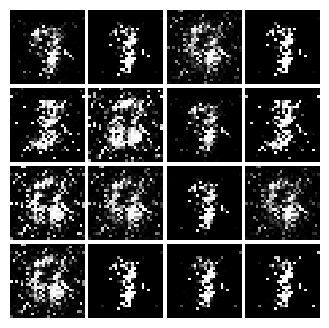

Epoch: 1, Iter: 760, D: 0.09019, G:0.3295


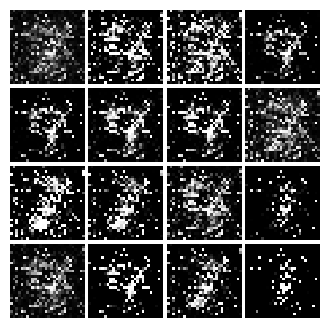

Epoch: 1, Iter: 780, D: 0.07797, G:0.3939


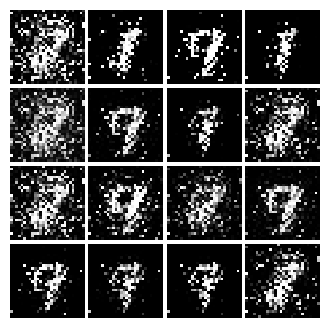

Epoch: 1, Iter: 800, D: 0.1241, G:0.4185


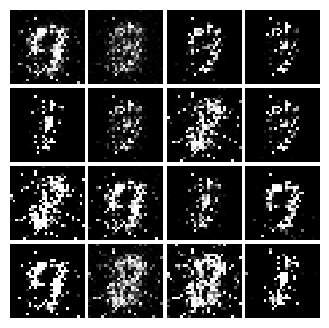

Epoch: 1, Iter: 820, D: 0.1162, G:0.3427


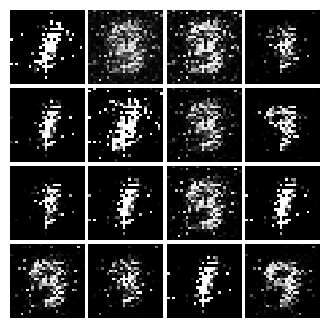

Epoch: 1, Iter: 840, D: 0.1705, G:0.3352


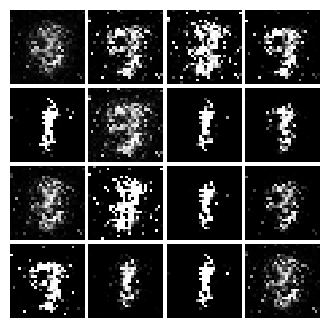

Epoch: 1, Iter: 860, D: 0.1269, G:0.3448


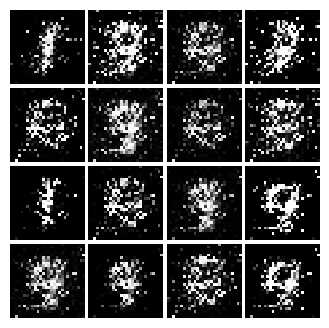

Epoch: 1, Iter: 880, D: 0.1492, G:0.386


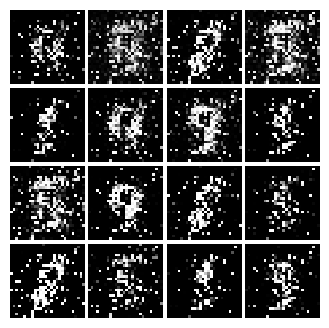

Epoch: 1, Iter: 900, D: 0.1286, G:0.5202


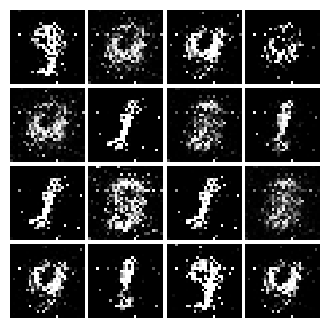

Epoch: 1, Iter: 920, D: 0.1634, G:0.3276


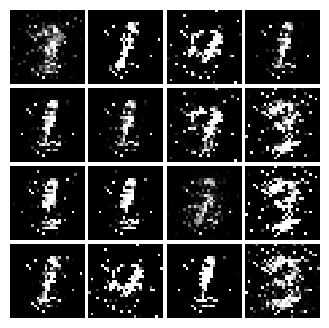

Epoch: 2, Iter: 940, D: 0.1167, G:0.3363


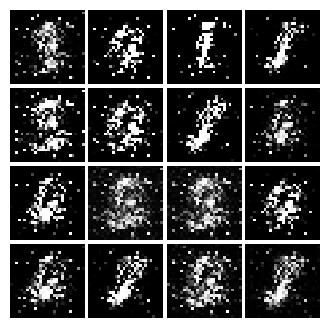

Epoch: 2, Iter: 960, D: 0.1018, G:0.5421


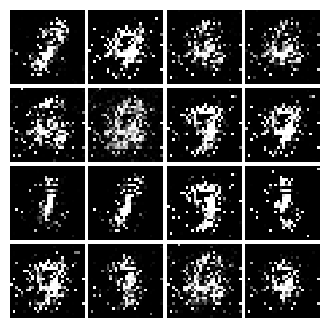

Epoch: 2, Iter: 980, D: 0.1715, G:0.1995


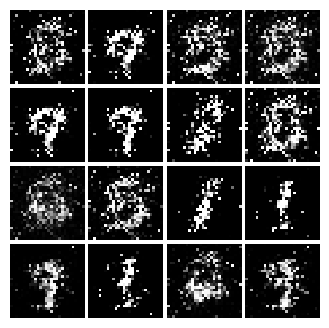

Epoch: 2, Iter: 1000, D: 0.1171, G:0.4017


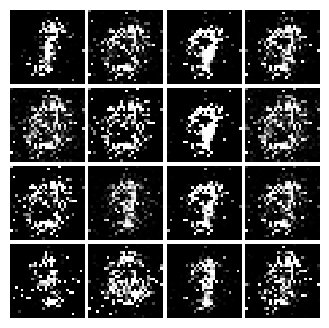

Epoch: 2, Iter: 1020, D: 0.1097, G:0.4699


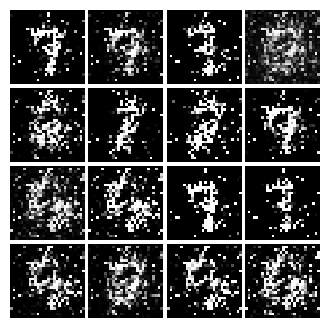

Epoch: 2, Iter: 1040, D: 0.1445, G:0.6399


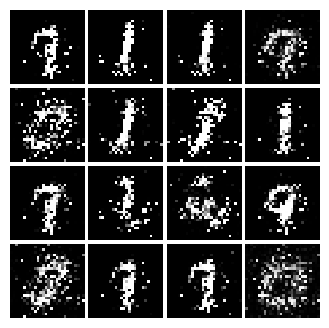

Epoch: 2, Iter: 1060, D: 0.14, G:0.3761


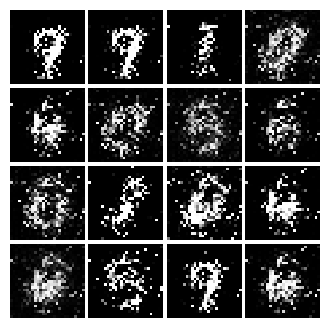

Epoch: 2, Iter: 1080, D: 0.1063, G:0.6668


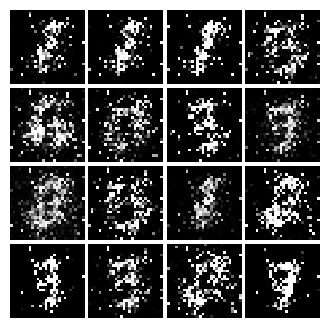

Epoch: 2, Iter: 1100, D: 0.1508, G:0.2937


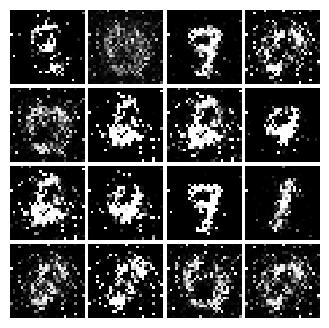

Epoch: 2, Iter: 1120, D: 0.1122, G:0.3155


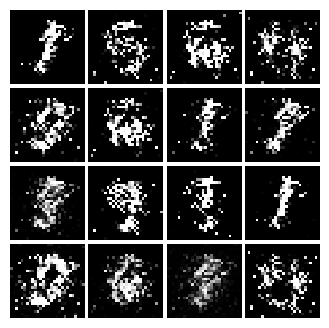

Epoch: 2, Iter: 1140, D: 0.2222, G:0.4329


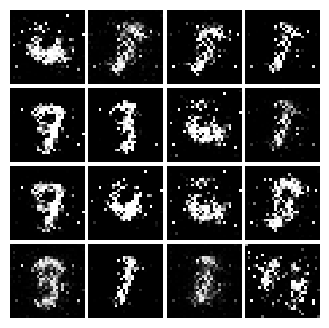

Epoch: 2, Iter: 1160, D: 0.1258, G:0.3825


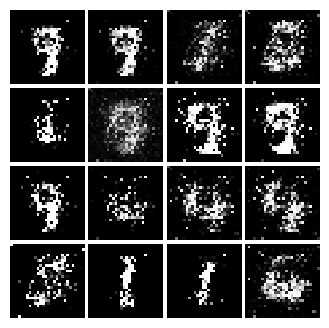

Epoch: 2, Iter: 1180, D: 0.1568, G:0.217


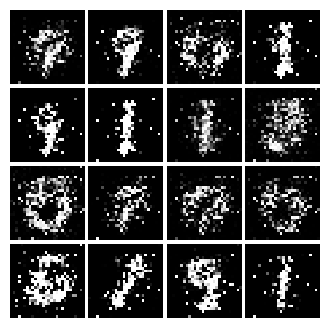

Epoch: 2, Iter: 1200, D: 0.1599, G:0.2815


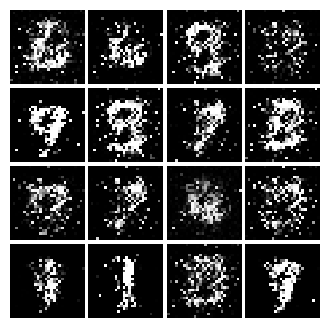

Epoch: 2, Iter: 1220, D: 0.653, G:0.3654


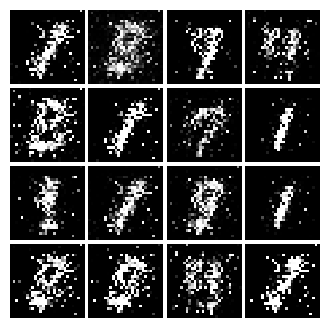

Epoch: 2, Iter: 1240, D: 0.1608, G:0.2872


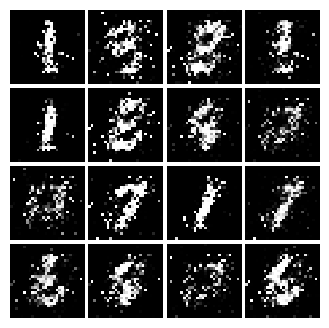

Epoch: 2, Iter: 1260, D: 0.2311, G:0.2163


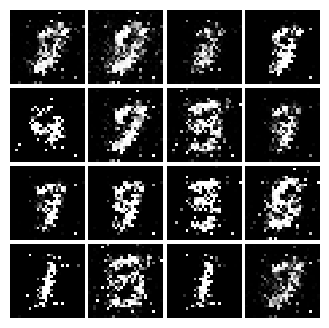

Epoch: 2, Iter: 1280, D: 0.1912, G:0.2354


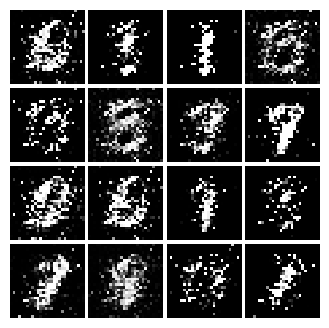

Epoch: 2, Iter: 1300, D: 0.1585, G:0.2412


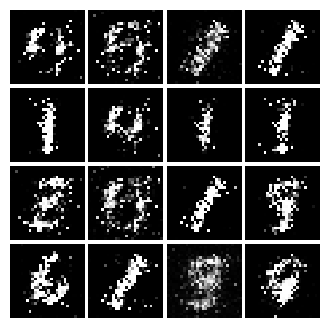

Epoch: 2, Iter: 1320, D: 0.148, G:0.3628


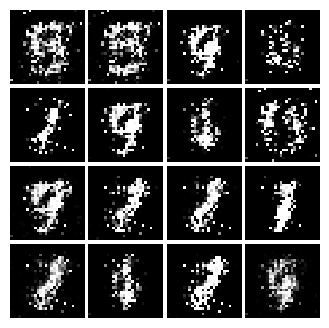

Epoch: 2, Iter: 1340, D: 0.1568, G:0.2499


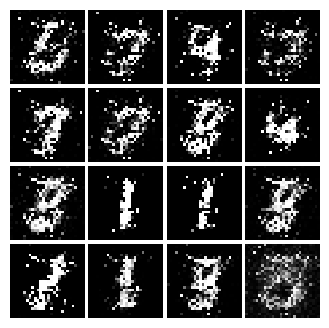

Epoch: 2, Iter: 1360, D: 0.1646, G:0.2223


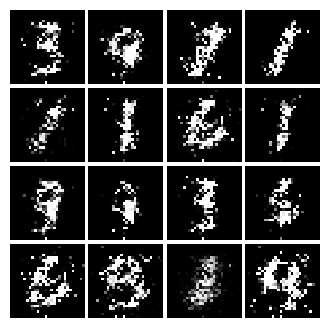

Epoch: 2, Iter: 1380, D: 0.1751, G:0.276


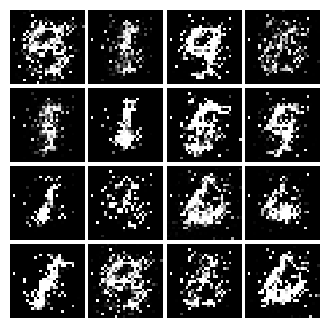

Epoch: 2, Iter: 1400, D: 0.1136, G:0.397


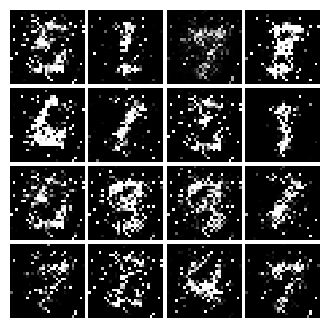

Epoch: 3, Iter: 1420, D: 0.2199, G:0.2061


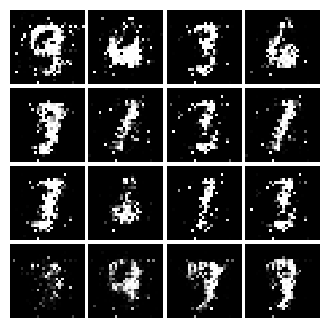

Epoch: 3, Iter: 1440, D: 0.1849, G:0.2151


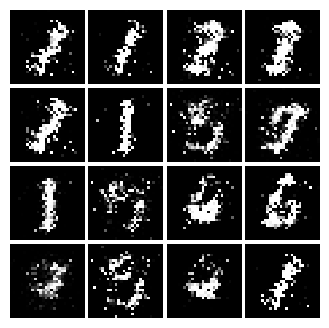

Epoch: 3, Iter: 1460, D: 0.2089, G:0.2303


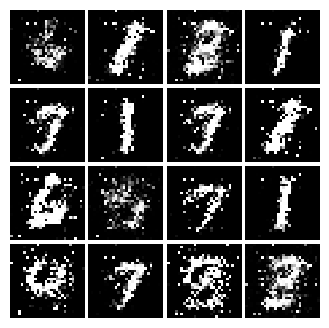

Epoch: 3, Iter: 1480, D: 0.1571, G:0.2847


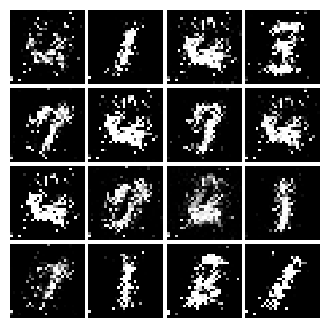

Epoch: 3, Iter: 1500, D: 0.1678, G:0.2965


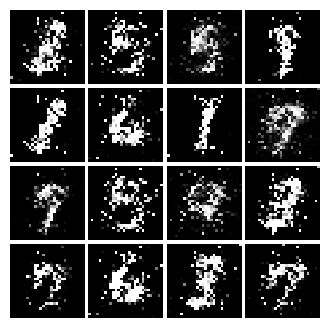

Epoch: 3, Iter: 1520, D: 0.1496, G:0.2868


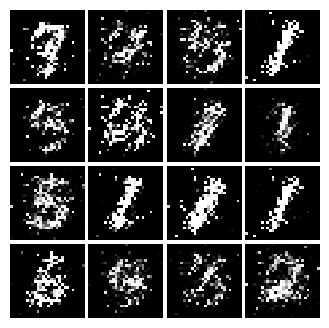

Epoch: 3, Iter: 1540, D: 0.1784, G:0.2812


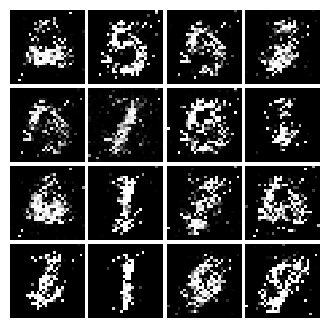

Epoch: 3, Iter: 1560, D: 0.1439, G:0.4


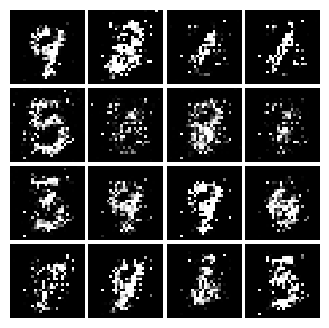

Epoch: 3, Iter: 1580, D: 0.1965, G:0.2981


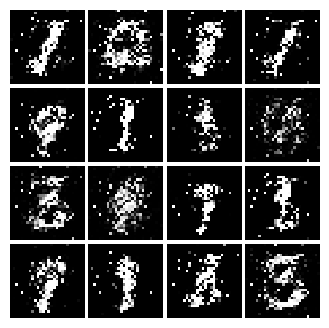

Epoch: 3, Iter: 1600, D: 0.1499, G:0.41


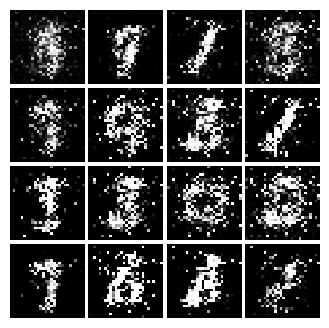

Epoch: 3, Iter: 1620, D: 0.1501, G:0.2778


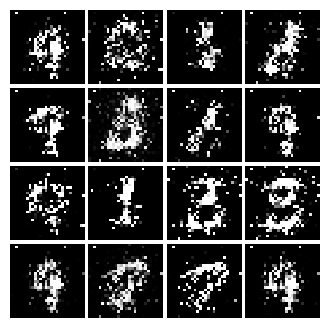

Epoch: 3, Iter: 1640, D: 0.2147, G:0.3136


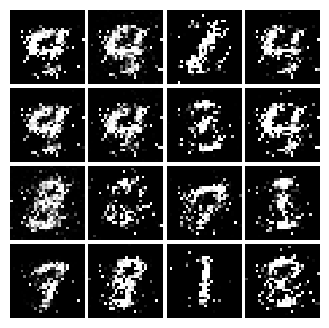

Epoch: 3, Iter: 1660, D: 0.1841, G:0.214


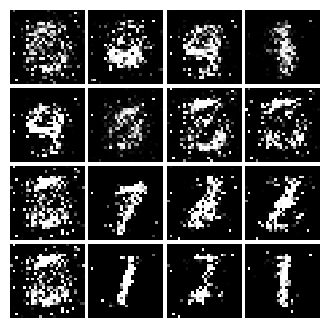

Epoch: 3, Iter: 1680, D: 0.1603, G:0.2853


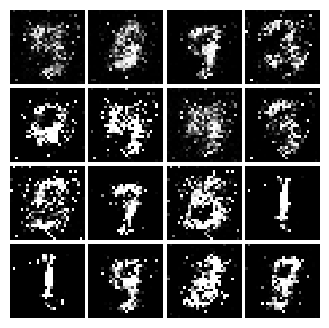

Epoch: 3, Iter: 1700, D: 0.2031, G:0.2054


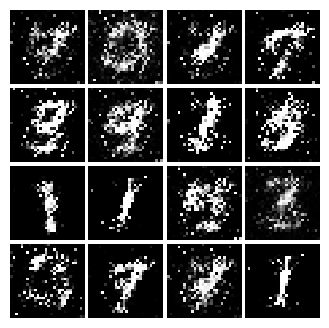

Epoch: 3, Iter: 1720, D: 0.1815, G:0.2296


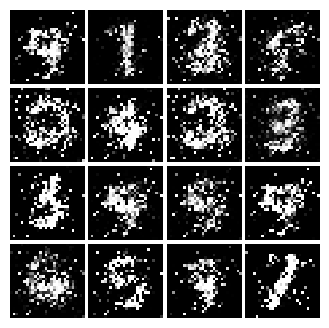

Epoch: 3, Iter: 1740, D: 0.1819, G:0.2082


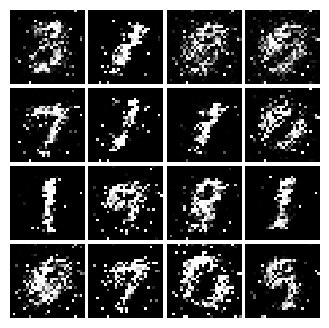

Epoch: 3, Iter: 1760, D: 0.1543, G:0.3016


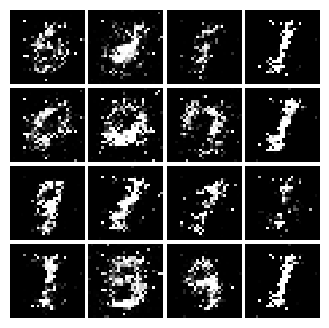

Epoch: 3, Iter: 1780, D: 0.1633, G:0.2836


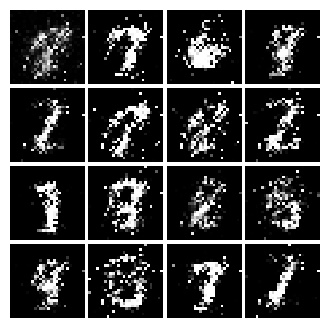

Epoch: 3, Iter: 1800, D: 0.2091, G:0.1945


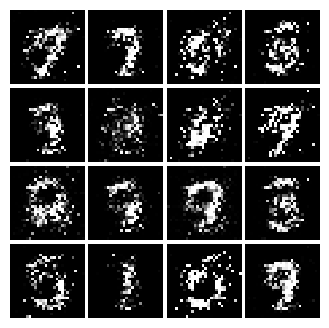

Epoch: 3, Iter: 1820, D: 0.2112, G:0.3766


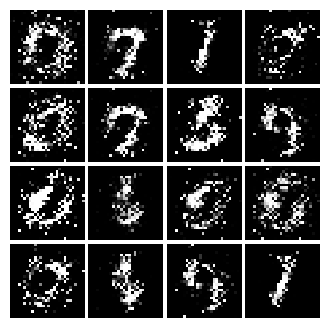

Epoch: 3, Iter: 1840, D: 0.1858, G:0.27


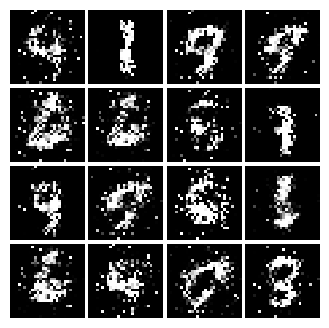

Epoch: 3, Iter: 1860, D: 0.1967, G:0.226


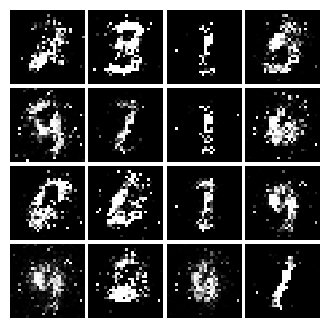

Epoch: 4, Iter: 1880, D: 0.2034, G:0.2078


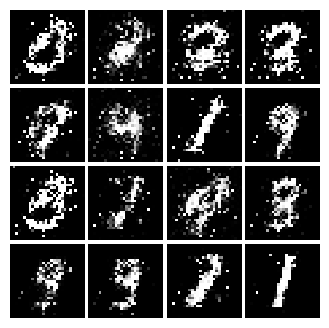

Epoch: 4, Iter: 1900, D: 0.1718, G:0.2169


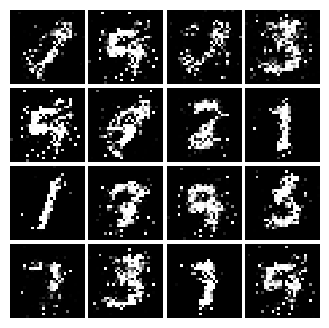

Epoch: 4, Iter: 1920, D: 0.188, G:0.2524


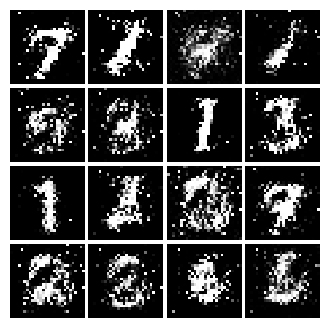

Epoch: 4, Iter: 1940, D: 0.1964, G:0.2201


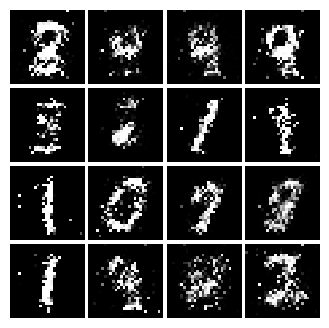

Epoch: 4, Iter: 1960, D: 0.2029, G:0.4499


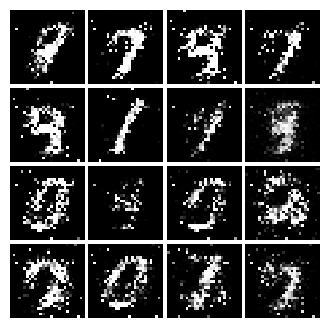

Epoch: 4, Iter: 1980, D: 0.1951, G:0.2092


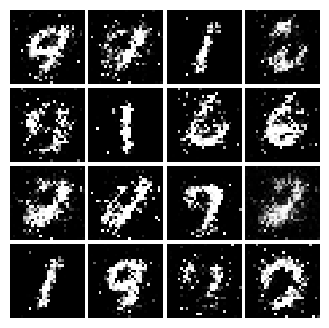

Epoch: 4, Iter: 2000, D: 0.2241, G:0.1686


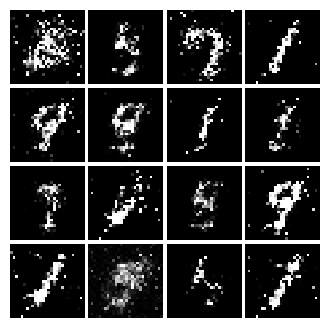

Epoch: 4, Iter: 2020, D: 0.2029, G:0.2375


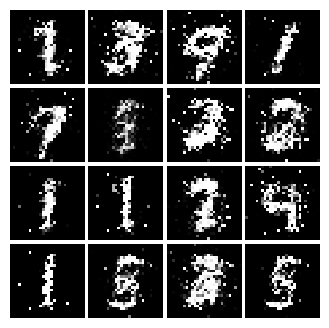

Epoch: 4, Iter: 2040, D: 0.2242, G:0.1825


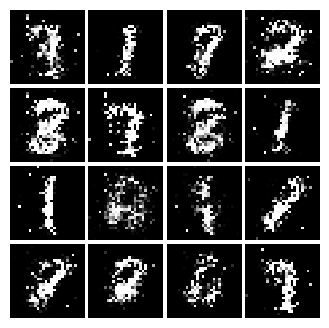

Epoch: 4, Iter: 2060, D: 0.2315, G:0.1902


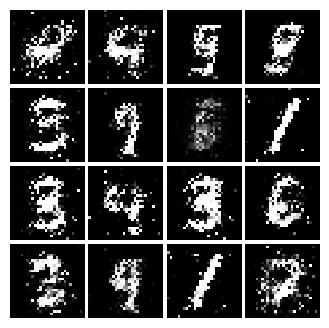

Epoch: 4, Iter: 2080, D: 0.2231, G:0.1804


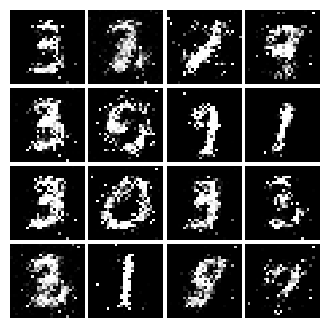

Epoch: 4, Iter: 2100, D: 0.2376, G:0.1539


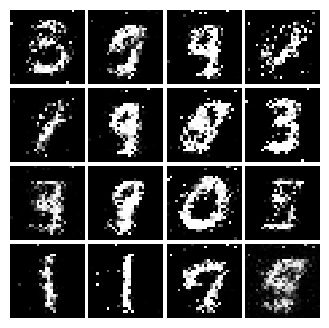

Epoch: 4, Iter: 2120, D: 0.2262, G:0.2158


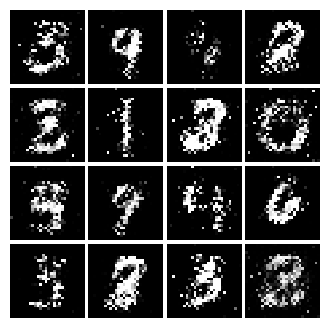

Epoch: 4, Iter: 2140, D: 0.1914, G:0.1907


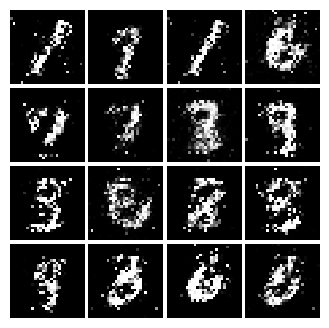

Epoch: 4, Iter: 2160, D: 0.2232, G:0.2014


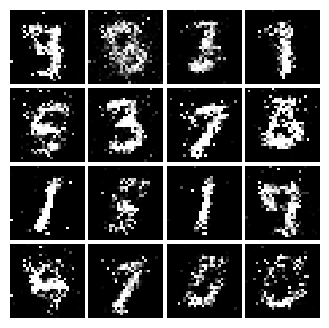

Epoch: 4, Iter: 2180, D: 0.2066, G:0.1736


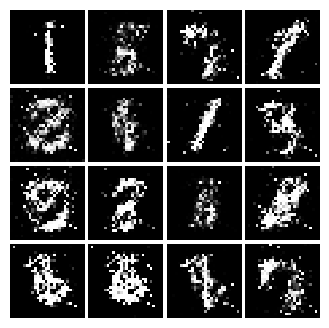

Epoch: 4, Iter: 2200, D: 0.2048, G:0.2167


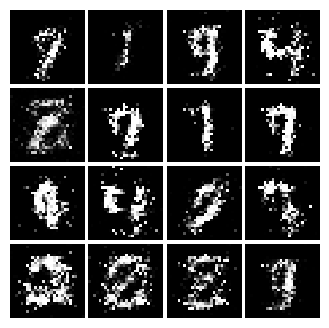

Epoch: 4, Iter: 2220, D: 0.1949, G:0.2204


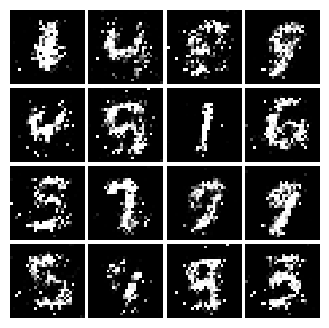

Epoch: 4, Iter: 2240, D: 0.2397, G:0.2075


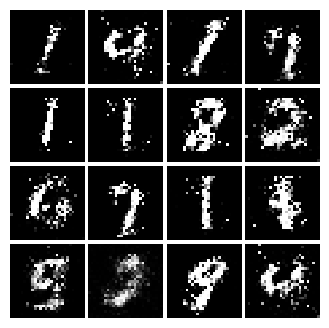

Epoch: 4, Iter: 2260, D: 0.2079, G:0.249


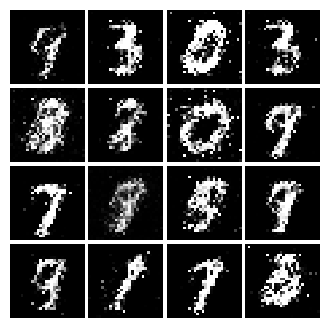

Epoch: 4, Iter: 2280, D: 0.2153, G:0.1946


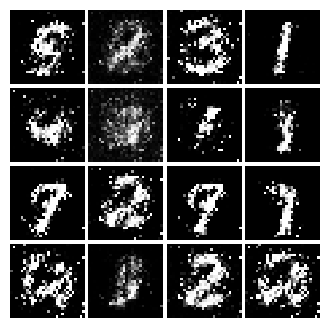

Epoch: 4, Iter: 2300, D: 0.2161, G:0.2116


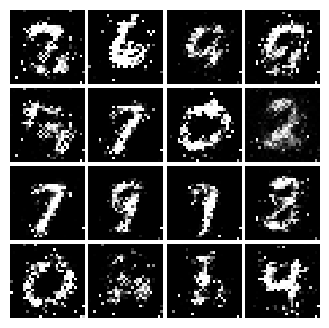

Epoch: 4, Iter: 2320, D: 0.22, G:0.1952


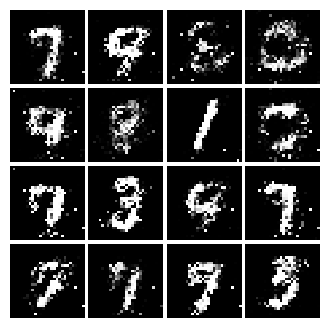

Epoch: 4, Iter: 2340, D: 0.1933, G:0.2592


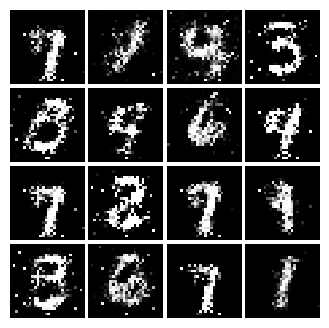

Epoch: 5, Iter: 2360, D: 0.2197, G:0.2248


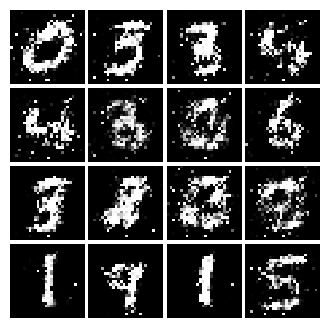

Epoch: 5, Iter: 2380, D: 0.2185, G:0.1767


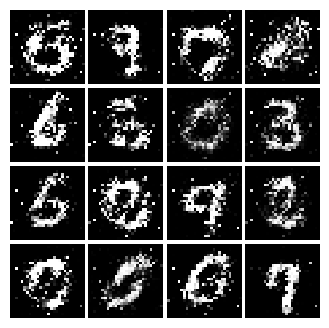

Epoch: 5, Iter: 2400, D: 0.2203, G:0.1687


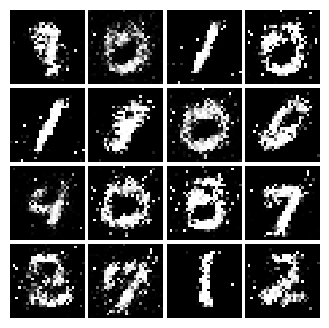

Epoch: 5, Iter: 2420, D: 0.2018, G:0.1837


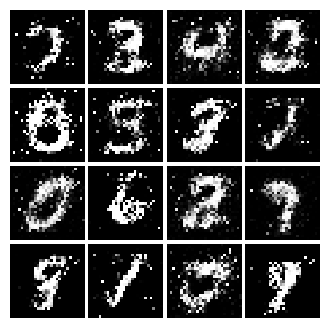

Epoch: 5, Iter: 2440, D: 0.2125, G:0.1929


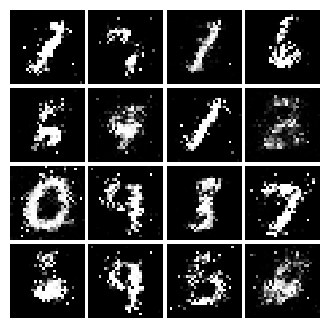

Epoch: 5, Iter: 2460, D: 0.1977, G:0.1919


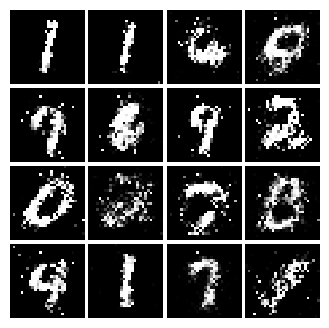

Epoch: 5, Iter: 2480, D: 0.2043, G:0.182


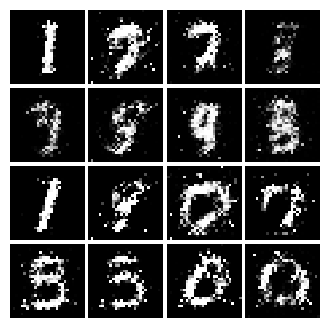

Epoch: 5, Iter: 2500, D: 0.1883, G:0.2154


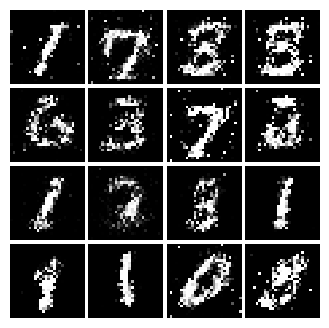

Epoch: 5, Iter: 2520, D: 0.2523, G:0.1526


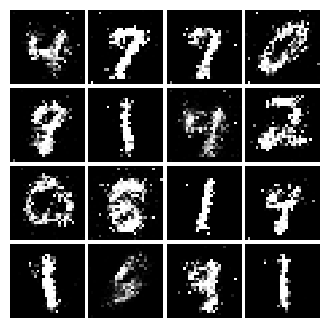

Epoch: 5, Iter: 2540, D: 0.2258, G:0.1787


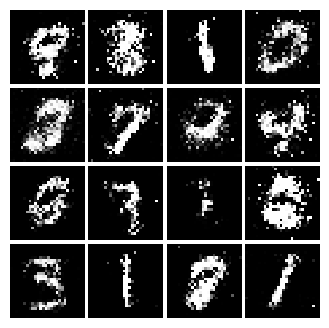

Epoch: 5, Iter: 2560, D: 0.231, G:0.2068


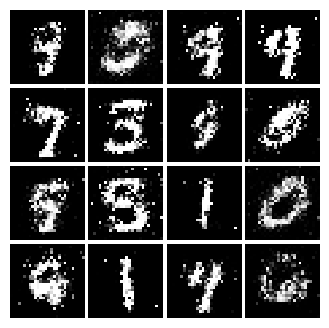

Epoch: 5, Iter: 2580, D: 0.2314, G:0.1655


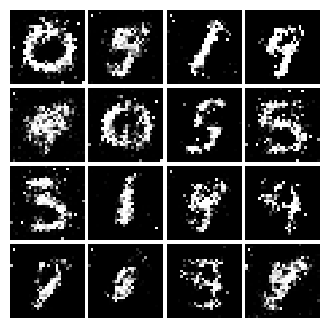

Epoch: 5, Iter: 2600, D: 0.2532, G:0.1622


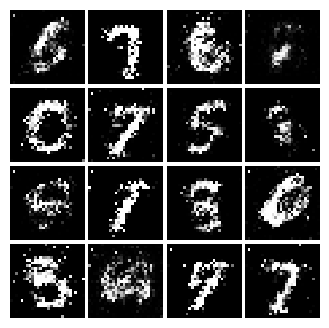

Epoch: 5, Iter: 2620, D: 0.1999, G:0.2272


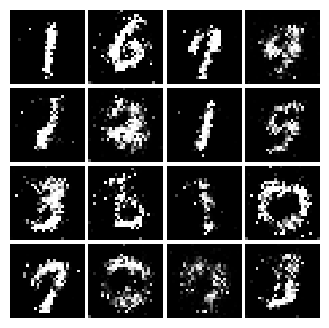

Epoch: 5, Iter: 2640, D: 0.2285, G:0.1742


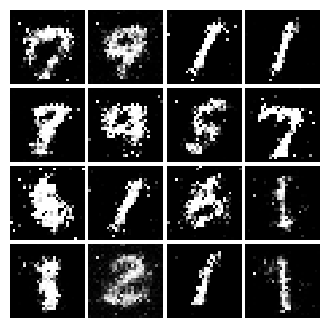

Epoch: 5, Iter: 2660, D: 0.2298, G:0.199


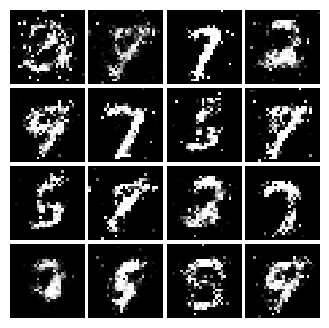

Epoch: 5, Iter: 2680, D: 0.2518, G:0.1725


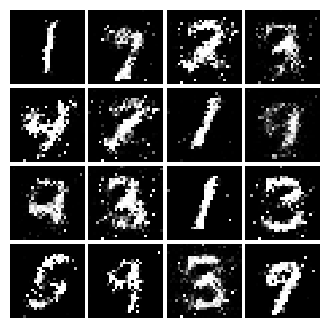

Epoch: 5, Iter: 2700, D: 0.2451, G:0.1767


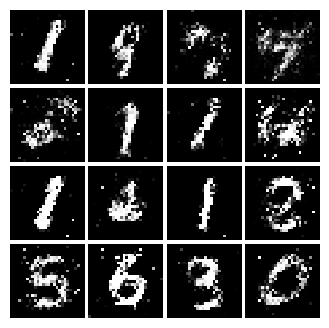

Epoch: 5, Iter: 2720, D: 0.2103, G:0.1812


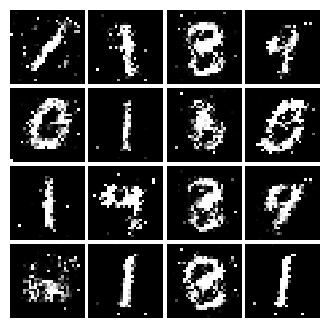

Epoch: 5, Iter: 2740, D: 0.2268, G:0.1728


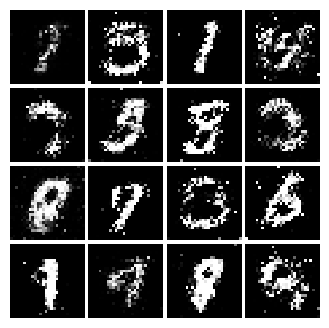

Epoch: 5, Iter: 2760, D: 0.2224, G:0.1813


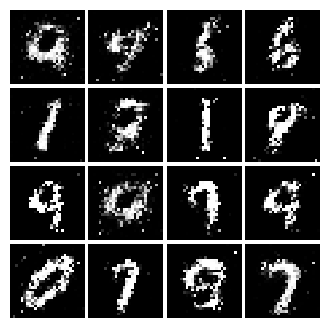

Epoch: 5, Iter: 2780, D: 0.2214, G:0.1787


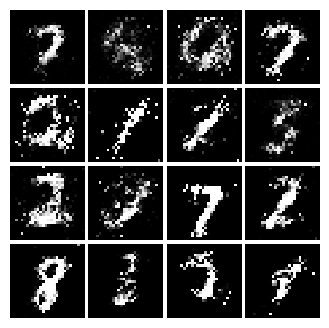

Epoch: 5, Iter: 2800, D: 0.2046, G:0.2105


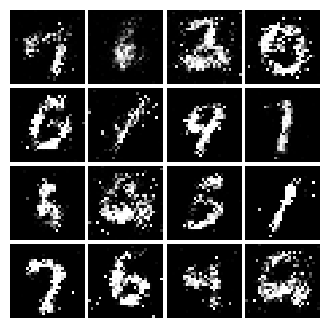

Epoch: 6, Iter: 2820, D: 0.2238, G:0.2174


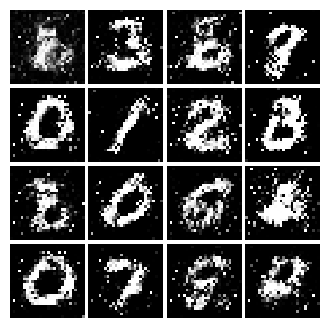

Epoch: 6, Iter: 2840, D: 0.2207, G:0.185


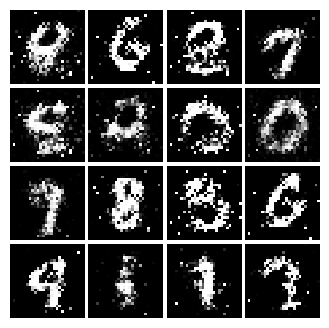

Epoch: 6, Iter: 2860, D: 0.2105, G:0.151


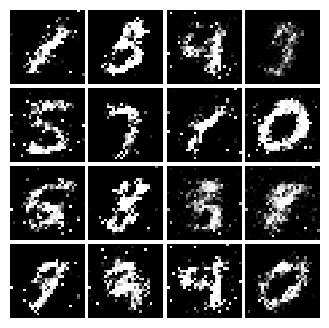

Epoch: 6, Iter: 2880, D: 0.2285, G:0.1885


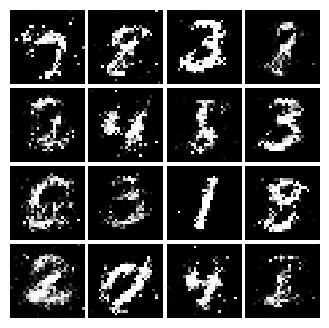

Epoch: 6, Iter: 2900, D: 0.2443, G:0.1609


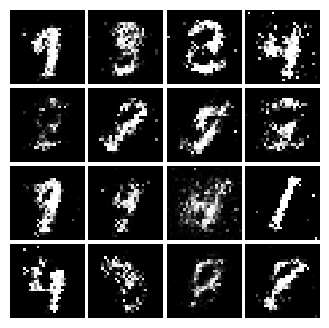

Epoch: 6, Iter: 2920, D: 0.2291, G:0.1717


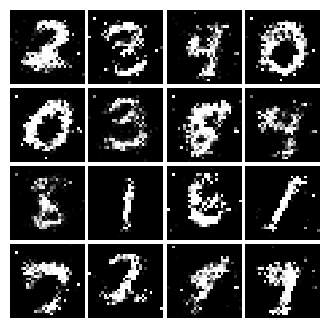

Epoch: 6, Iter: 2940, D: 0.2251, G:0.1634


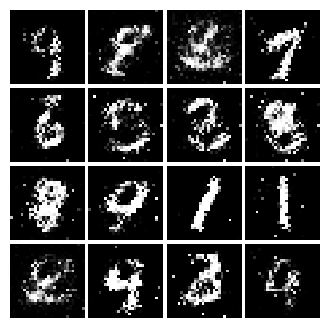

Epoch: 6, Iter: 2960, D: 0.2328, G:0.1824


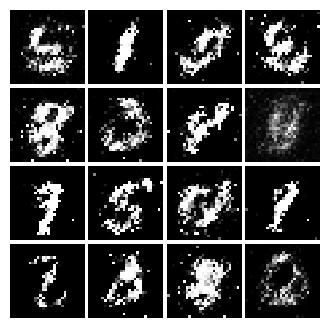

Epoch: 6, Iter: 2980, D: 0.2286, G:0.149


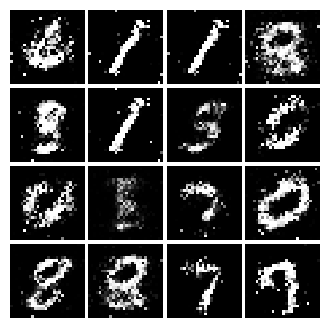

Epoch: 6, Iter: 3000, D: 0.2357, G:0.1817


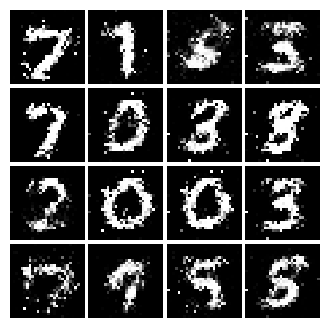

Epoch: 6, Iter: 3020, D: 0.2258, G:0.1573


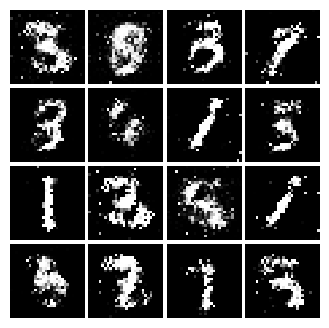

Epoch: 6, Iter: 3040, D: 0.2081, G:0.1746


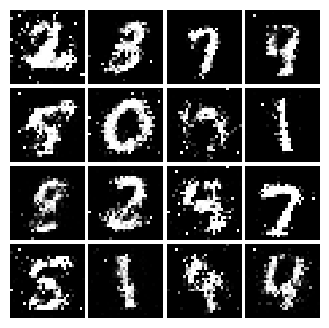

Epoch: 6, Iter: 3060, D: 0.228, G:0.1628


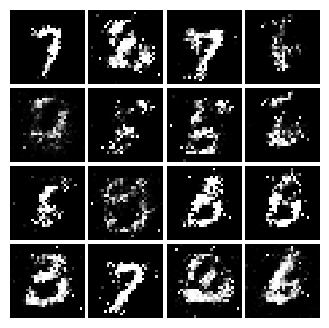

Epoch: 6, Iter: 3080, D: 0.214, G:0.1903


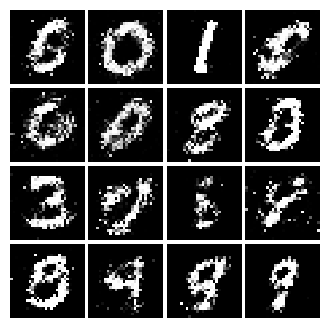

Epoch: 6, Iter: 3100, D: 0.2337, G:0.1767


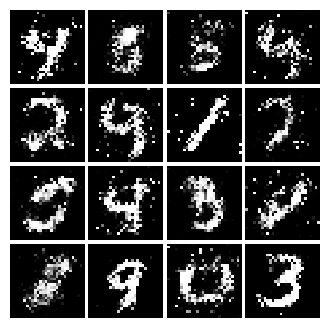

Epoch: 6, Iter: 3120, D: 0.2171, G:0.1942


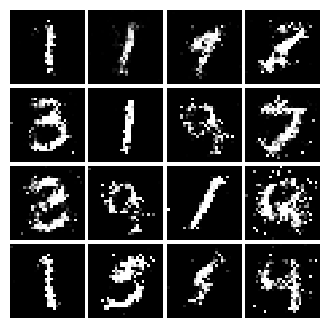

Epoch: 6, Iter: 3140, D: 0.2401, G:0.1702


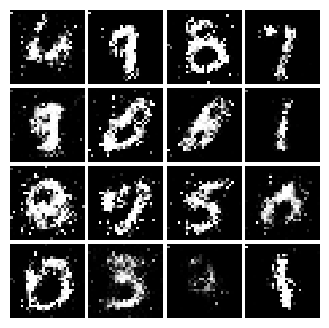

Epoch: 6, Iter: 3160, D: 0.2419, G:0.1855


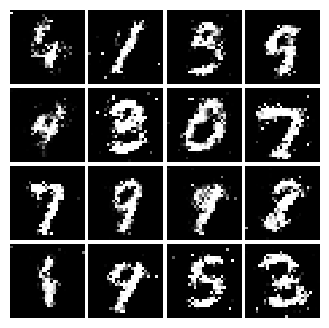

Epoch: 6, Iter: 3180, D: 0.217, G:0.1853


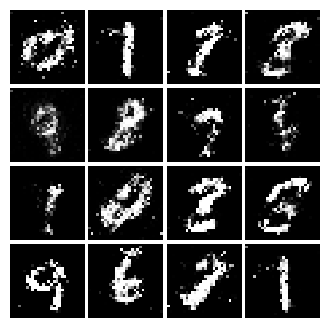

Epoch: 6, Iter: 3200, D: 0.2172, G:0.1586


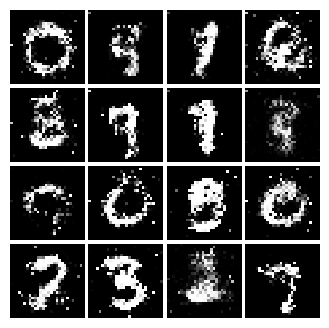

Epoch: 6, Iter: 3220, D: 0.2165, G:0.1664


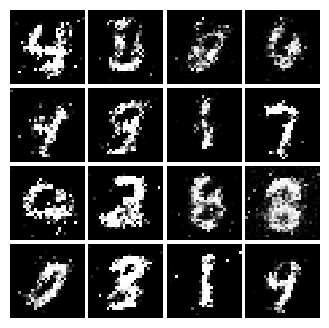

Epoch: 6, Iter: 3240, D: 0.2264, G:0.1741


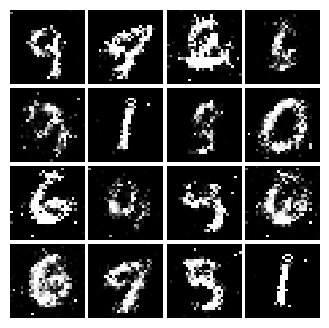

Epoch: 6, Iter: 3260, D: 0.2517, G:0.1599


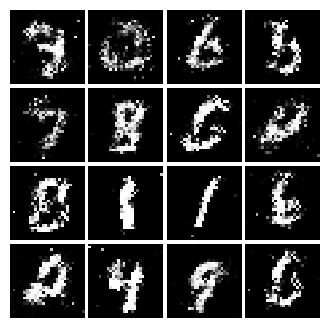

Epoch: 6, Iter: 3280, D: 0.2462, G:0.1786


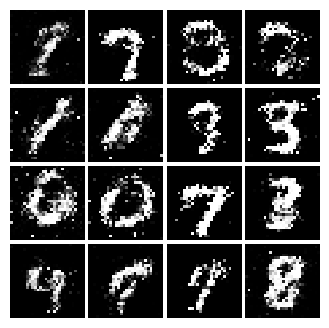

Epoch: 7, Iter: 3300, D: 0.2119, G:0.21


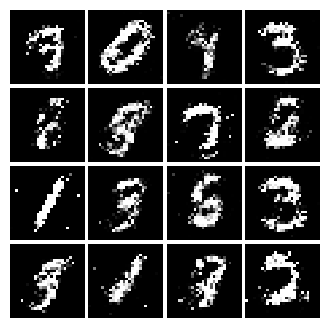

Epoch: 7, Iter: 3320, D: 0.2109, G:0.1735


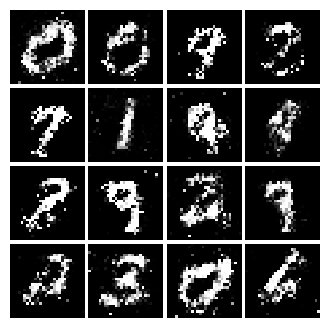

Epoch: 7, Iter: 3340, D: 0.2188, G:0.2019


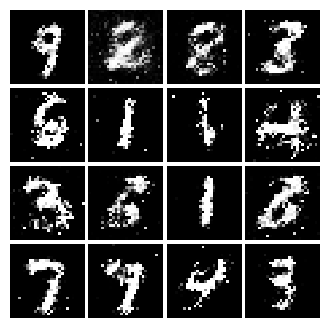

Epoch: 7, Iter: 3360, D: 0.2374, G:0.1832


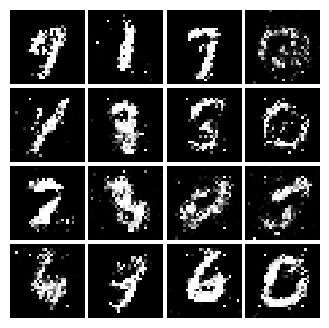

Epoch: 7, Iter: 3380, D: 0.2069, G:0.1647


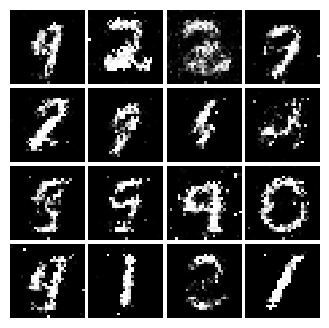

Epoch: 7, Iter: 3400, D: 0.2236, G:0.1586


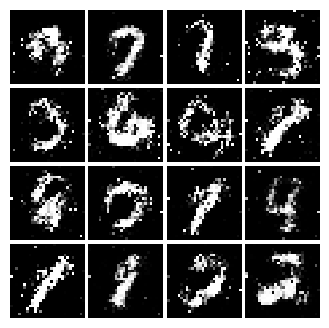

Epoch: 7, Iter: 3420, D: 0.2302, G:0.1584


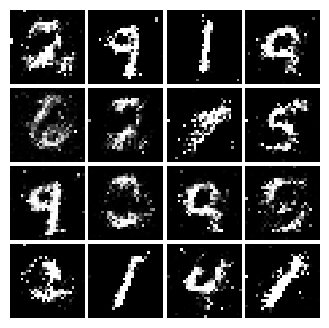

Epoch: 7, Iter: 3440, D: 0.223, G:0.2055


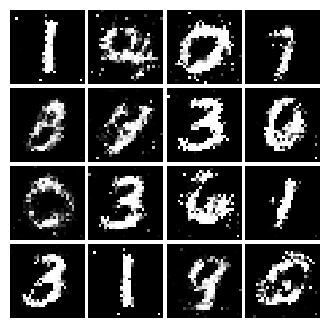

Epoch: 7, Iter: 3460, D: 0.2378, G:0.1641


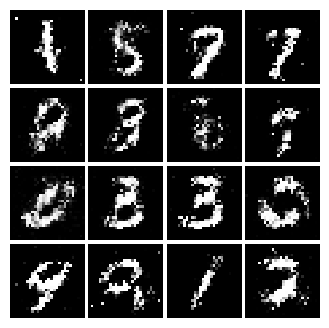

Epoch: 7, Iter: 3480, D: 0.2301, G:0.1527


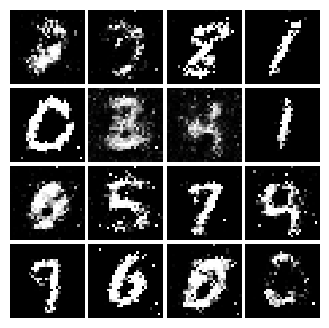

Epoch: 7, Iter: 3500, D: 0.2391, G:0.1493


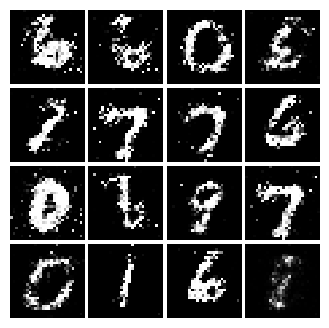

Epoch: 7, Iter: 3520, D: 0.2205, G:0.1617


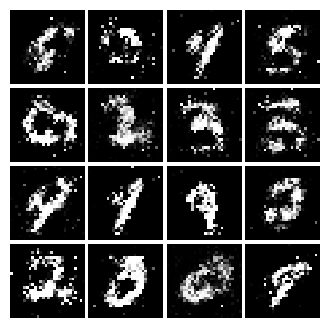

Epoch: 7, Iter: 3540, D: 0.2199, G:0.1626


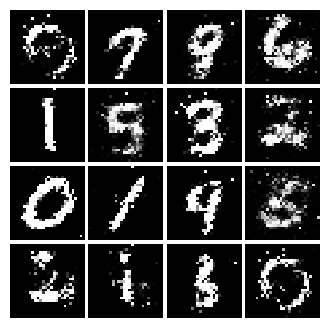

Epoch: 7, Iter: 3560, D: 0.203, G:0.191


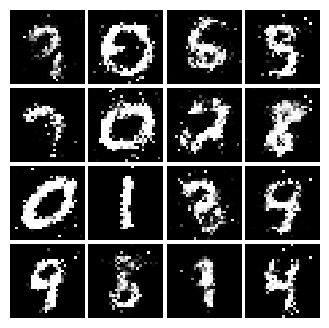

Epoch: 7, Iter: 3580, D: 0.2261, G:0.1584


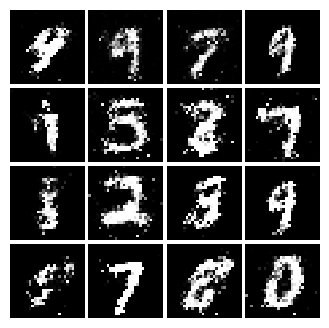

Epoch: 7, Iter: 3600, D: 0.2466, G:0.1807


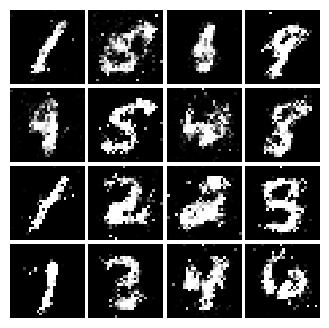

Epoch: 7, Iter: 3620, D: 0.2254, G:0.2116


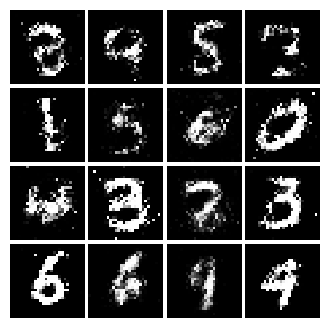

Epoch: 7, Iter: 3640, D: 0.2312, G:0.1607


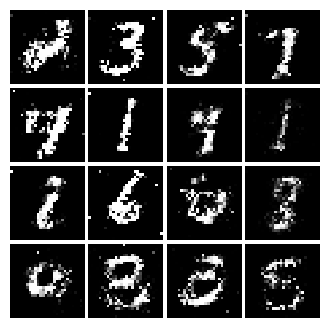

Epoch: 7, Iter: 3660, D: 0.2262, G:0.1553


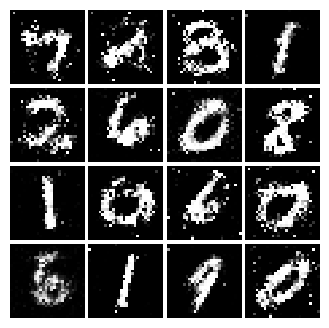

Epoch: 7, Iter: 3680, D: 0.2595, G:0.1583


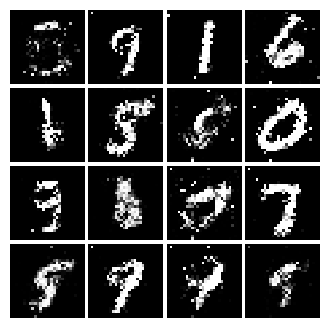

Epoch: 7, Iter: 3700, D: 0.2245, G:0.1718


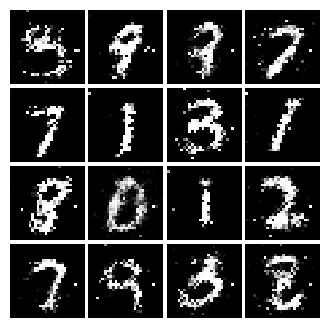

Epoch: 7, Iter: 3720, D: 0.223, G:0.1765


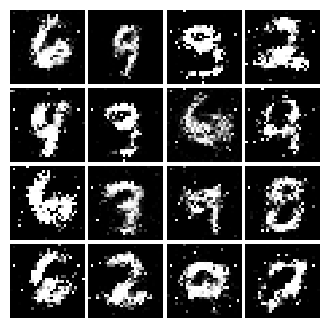

Epoch: 7, Iter: 3740, D: 0.2254, G:0.1719


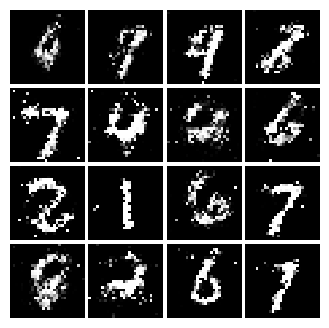

Epoch: 8, Iter: 3760, D: 0.2119, G:0.2023


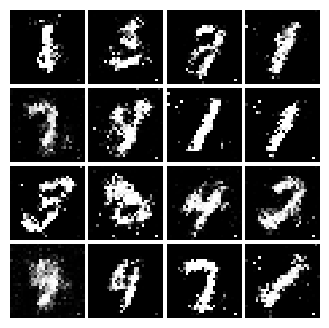

Epoch: 8, Iter: 3780, D: 0.2284, G:0.1496


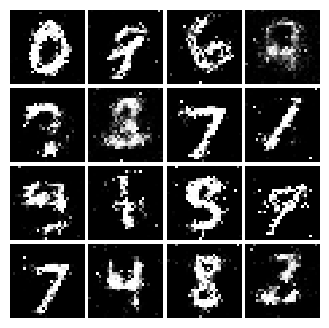

Epoch: 8, Iter: 3800, D: 0.2244, G:0.1714


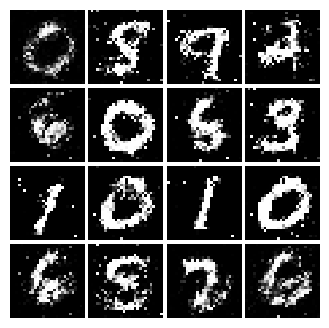

Epoch: 8, Iter: 3820, D: 0.2347, G:0.1576


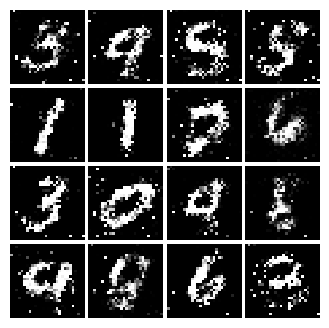

Epoch: 8, Iter: 3840, D: 0.2288, G:0.157


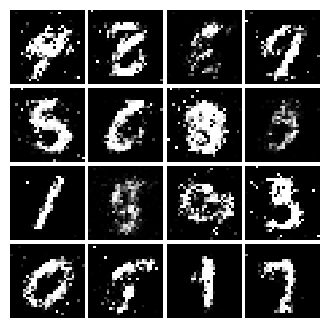

Epoch: 8, Iter: 3860, D: 0.225, G:0.1638


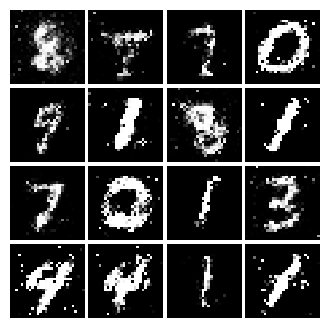

Epoch: 8, Iter: 3880, D: 0.215, G:0.1692


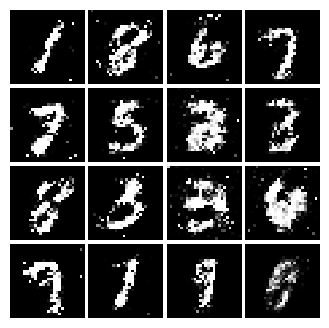

Epoch: 8, Iter: 3900, D: 0.2369, G:0.1563


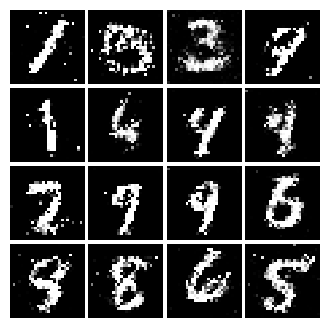

Epoch: 8, Iter: 3920, D: 0.213, G:0.1825


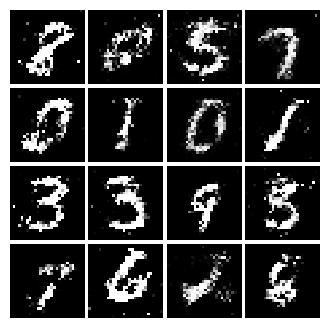

Epoch: 8, Iter: 3940, D: 0.2334, G:0.1528


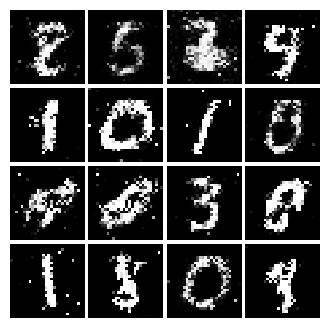

Epoch: 8, Iter: 3960, D: 0.2276, G:0.1969


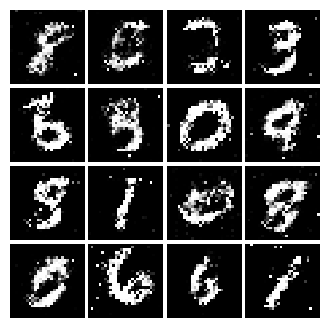

Epoch: 8, Iter: 3980, D: 0.2326, G:0.1689


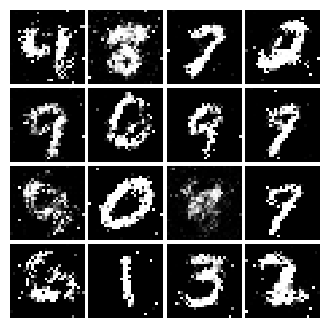

Epoch: 8, Iter: 4000, D: 0.2151, G:0.1748


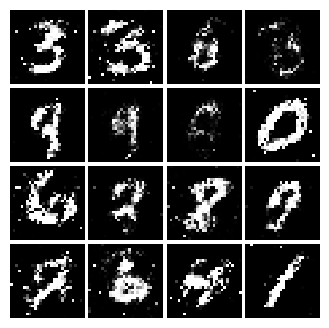

Epoch: 8, Iter: 4020, D: 0.2171, G:0.1685


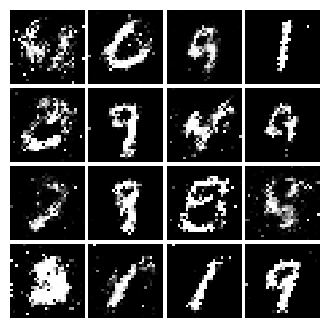

Epoch: 8, Iter: 4040, D: 0.2384, G:0.1905


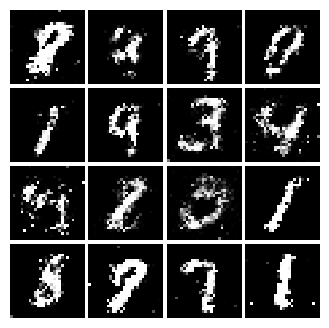

Epoch: 8, Iter: 4060, D: 0.224, G:0.1732


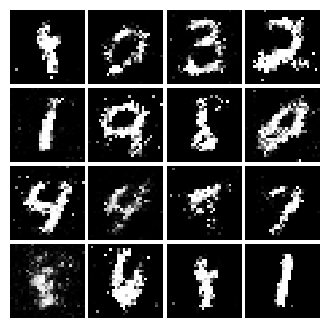

Epoch: 8, Iter: 4080, D: 0.2513, G:0.1596


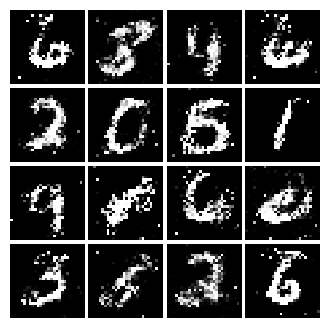

Epoch: 8, Iter: 4100, D: 0.2333, G:0.2056


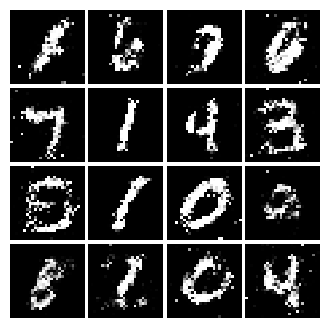

Epoch: 8, Iter: 4120, D: 0.2282, G:0.1404


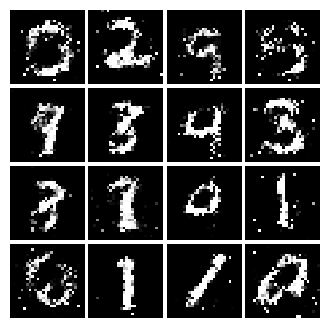

Epoch: 8, Iter: 4140, D: 0.2433, G:0.1754


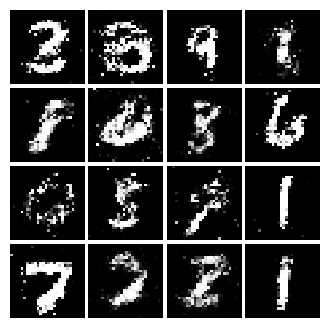

Epoch: 8, Iter: 4160, D: 0.2253, G:0.1583


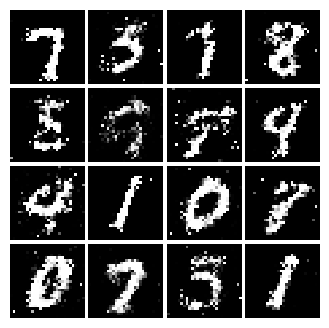

Epoch: 8, Iter: 4180, D: 0.2615, G:0.1614


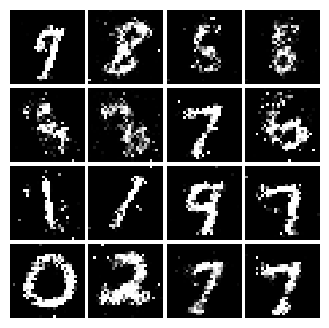

Epoch: 8, Iter: 4200, D: 0.2138, G:0.1685


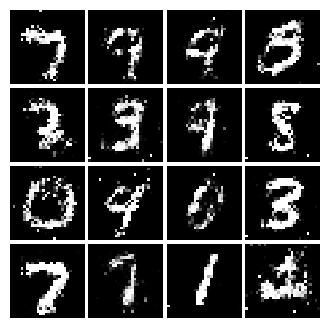

Epoch: 8, Iter: 4220, D: 0.2509, G:0.177


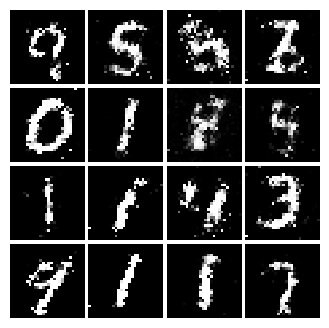

Epoch: 9, Iter: 4240, D: 0.2377, G:0.1761


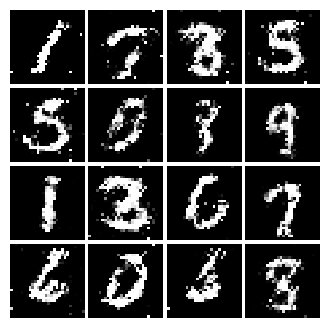

Epoch: 9, Iter: 4260, D: 0.2205, G:0.182


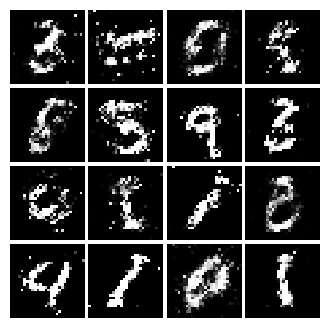

Epoch: 9, Iter: 4280, D: 0.2411, G:0.1477


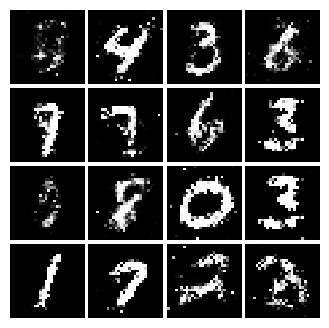

Epoch: 9, Iter: 4300, D: 0.2506, G:0.1536


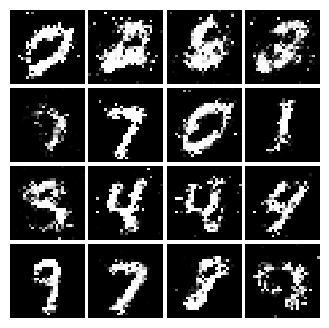

Epoch: 9, Iter: 4320, D: 0.252, G:0.1611


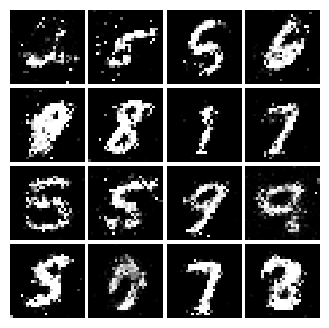

Epoch: 9, Iter: 4340, D: 0.239, G:0.1792


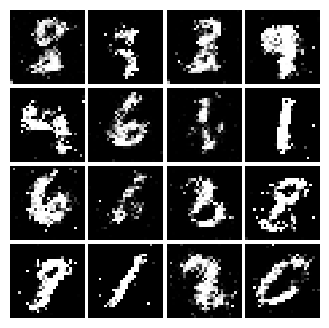

Epoch: 9, Iter: 4360, D: 0.2393, G:0.1619


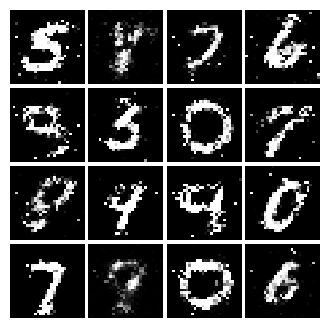

Epoch: 9, Iter: 4380, D: 0.2551, G:0.1488


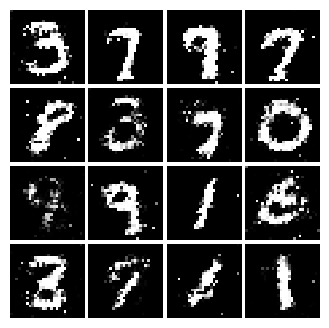

Epoch: 9, Iter: 4400, D: 0.2218, G:0.1577


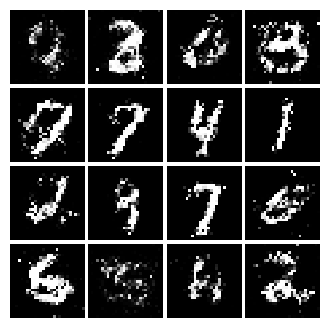

Epoch: 9, Iter: 4420, D: 0.2202, G:0.1388


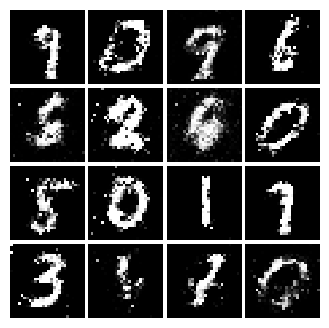

Epoch: 9, Iter: 4440, D: 0.2532, G:0.147


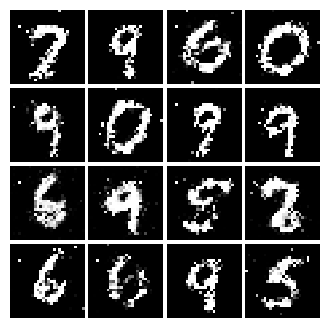

Epoch: 9, Iter: 4460, D: 0.241, G:0.1629


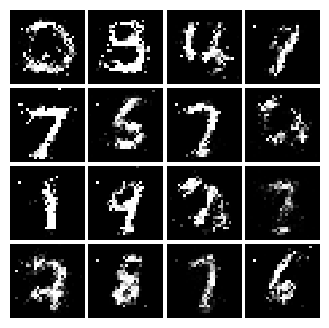

Epoch: 9, Iter: 4480, D: 0.2194, G:0.1964


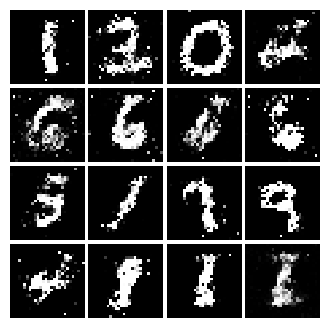

Epoch: 9, Iter: 4500, D: 0.2447, G:0.1616


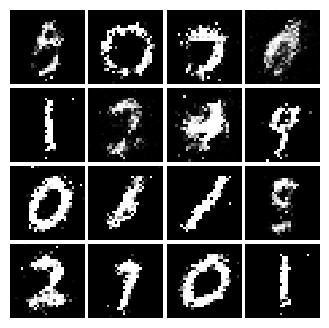

Epoch: 9, Iter: 4520, D: 0.2235, G:0.1549


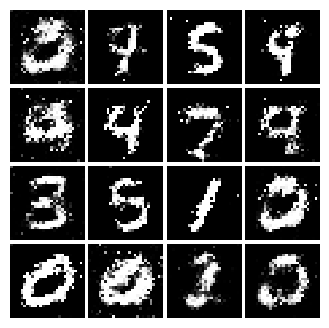

Epoch: 9, Iter: 4540, D: 0.2172, G:0.1752


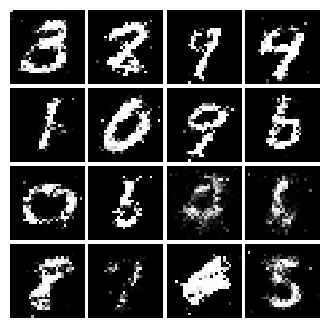

Epoch: 9, Iter: 4560, D: 0.2364, G:0.1583


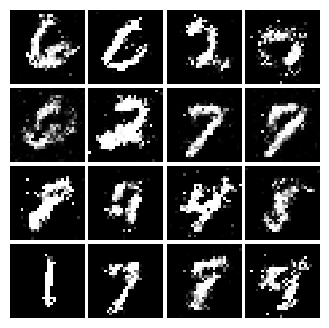

Epoch: 9, Iter: 4580, D: 0.2261, G:0.157


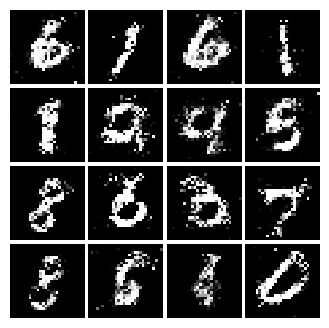

Epoch: 9, Iter: 4600, D: 0.2384, G:0.1588


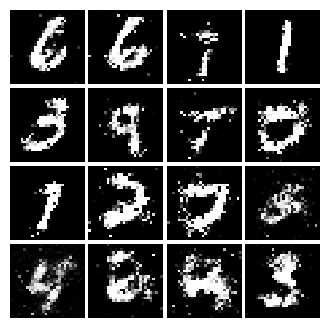

Epoch: 9, Iter: 4620, D: 0.2499, G:0.1533


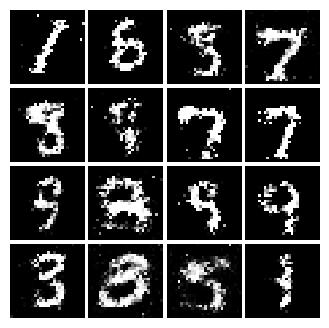

Epoch: 9, Iter: 4640, D: 0.2264, G:0.1652


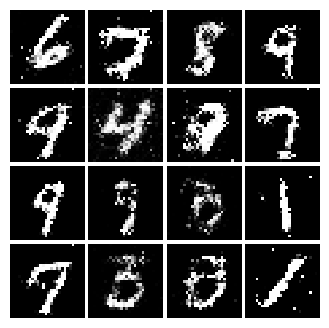

Epoch: 9, Iter: 4660, D: 0.235, G:0.1706


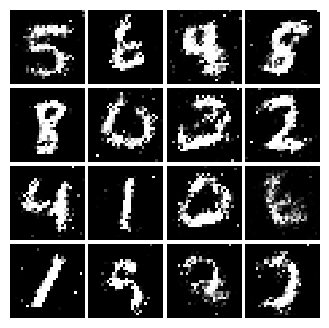

Epoch: 9, Iter: 4680, D: 0.2474, G:0.1626


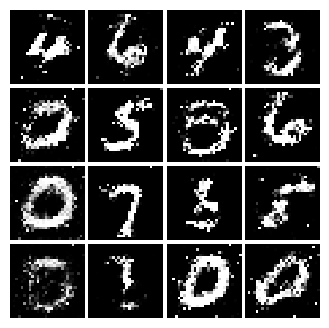

Final images


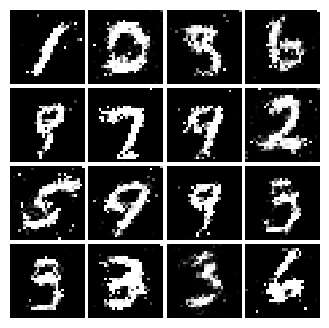

In [20]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [21]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Reshape((28,28,1)),
        tf.keras.layers.Conv2D(32,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Conv2D(64,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [22]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    tf.keras.layers.InputLayer(noise_dim),
    tf.keras.layers.Dense(1024,activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(7*7*128,activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((7,7,128)),
    tf.keras.layers.Conv2DTranspose(filters=64,kernel_size=(4,4),strides = 2,activation = tf.nn.relu,padding = 'SAME'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(filters=1,kernel_size=(4,4),strides = 2,activation = tf.tanh,padding = 'SAME')
    ])
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.326, G:0.6554


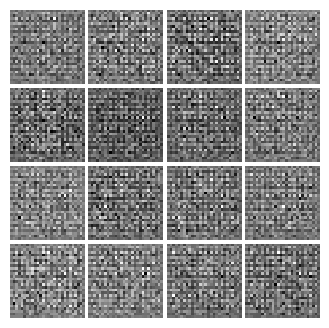

Epoch: 0, Iter: 20, D: 0.2962, G:1.557


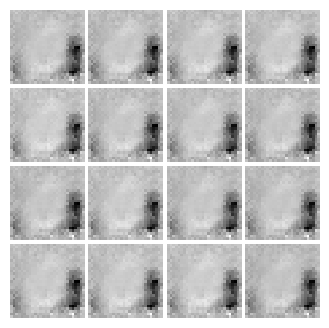

Epoch: 0, Iter: 40, D: 0.007975, G:4.949


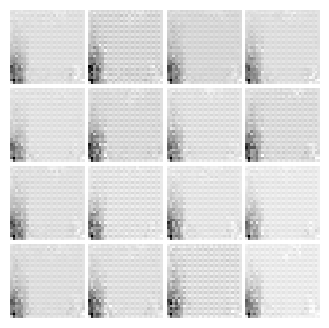

Epoch: 0, Iter: 60, D: 0.002052, G:6.259


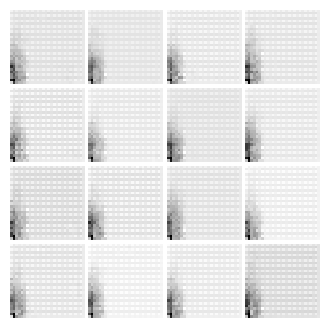

Epoch: 0, Iter: 80, D: 0.0009907, G:6.979


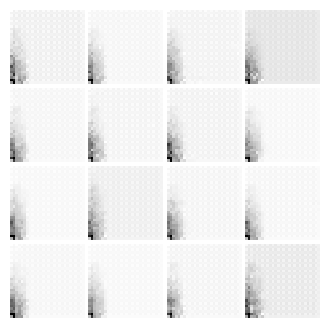

Epoch: 0, Iter: 100, D: 0.0005558, G:7.533


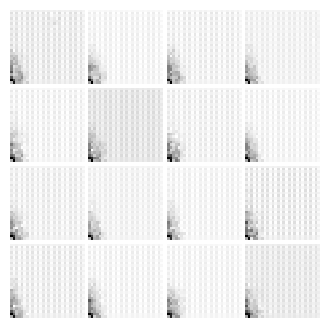

Epoch: 0, Iter: 120, D: 0.00037, G:7.933


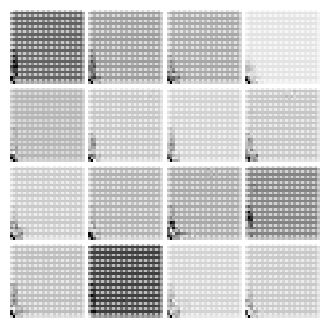

Epoch: 0, Iter: 140, D: 0.0002557, G:8.293


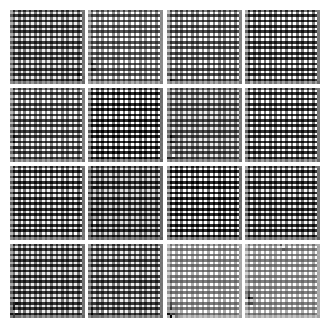

Epoch: 0, Iter: 160, D: 0.0001922, G:8.583


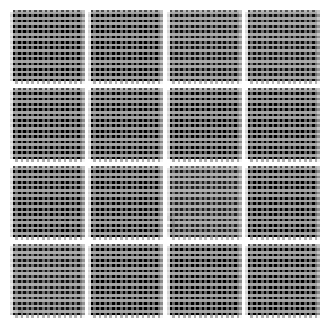

Epoch: 0, Iter: 180, D: 0.0001618, G:8.786


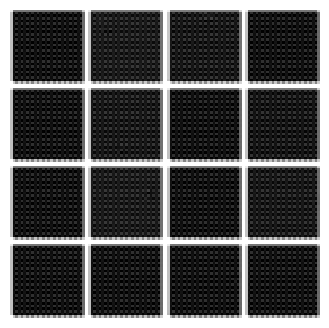

Epoch: 0, Iter: 200, D: 0.0005711, G:8.044


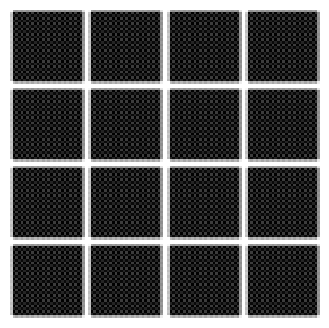

Epoch: 0, Iter: 220, D: 0.7156, G:0.7438


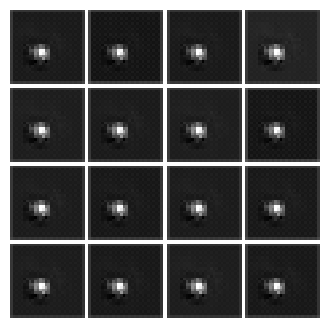

Epoch: 0, Iter: 240, D: 0.8622, G:2.204


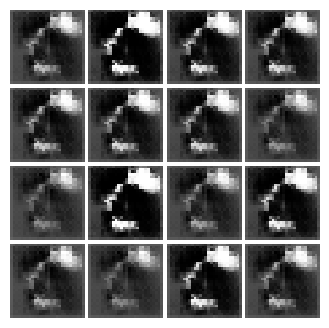

Epoch: 0, Iter: 260, D: 0.9262, G:1.667


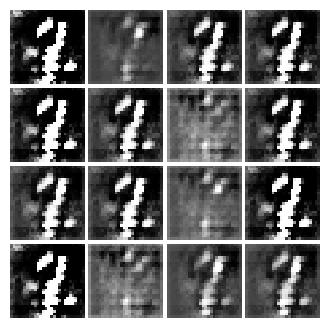

Epoch: 0, Iter: 280, D: 1.178, G:1.43


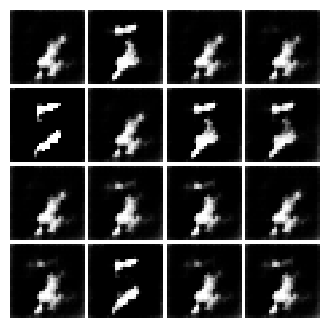

Epoch: 0, Iter: 300, D: 1.053, G:1.521


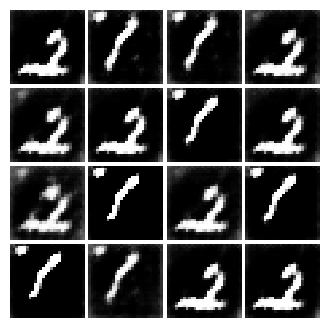

Epoch: 0, Iter: 320, D: 1.28, G:3.403


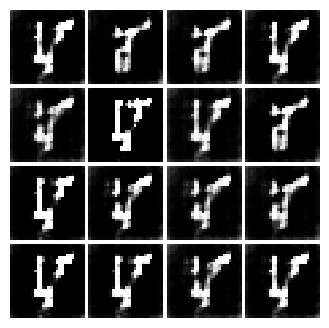

Epoch: 0, Iter: 340, D: 1.216, G:1.678


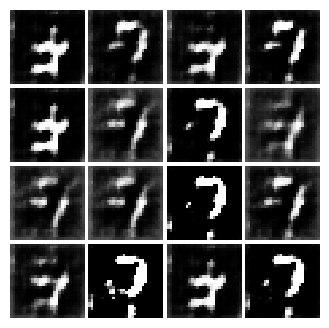

Epoch: 0, Iter: 360, D: 0.6197, G:2.141


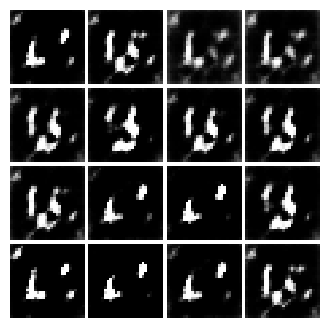

Epoch: 0, Iter: 380, D: 1.999, G:1.462


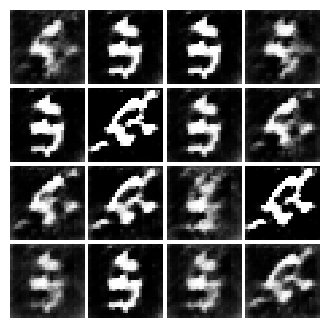

Epoch: 0, Iter: 400, D: 0.9984, G:2.165


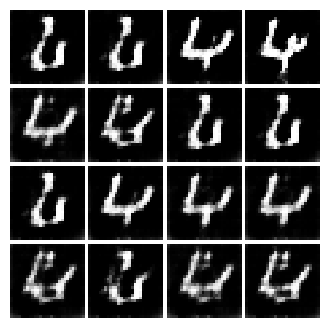

Epoch: 0, Iter: 420, D: 1.14, G:2.336


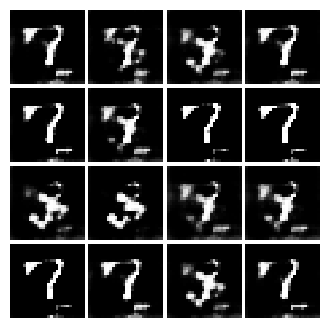

Epoch: 0, Iter: 440, D: 0.8736, G:1.61


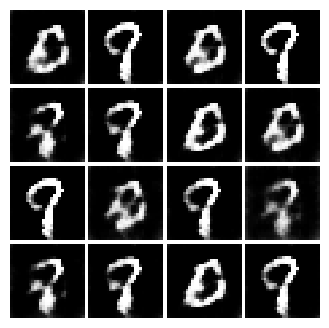

Epoch: 0, Iter: 460, D: 1.031, G:1.25


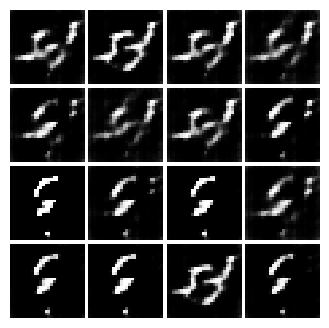

Epoch: 1, Iter: 480, D: 0.858, G:2.23


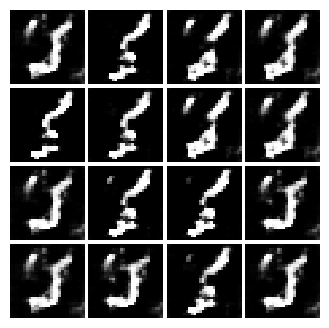

Epoch: 1, Iter: 500, D: 0.8385, G:3.464


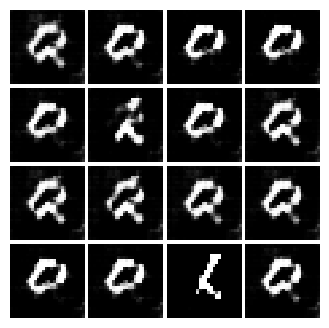

Epoch: 1, Iter: 520, D: 0.4647, G:3.399


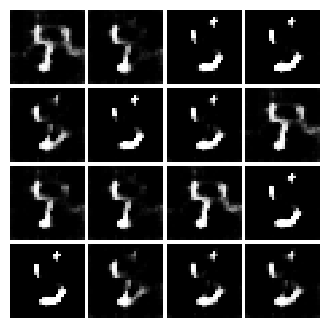

Epoch: 1, Iter: 540, D: 1.079, G:2.848


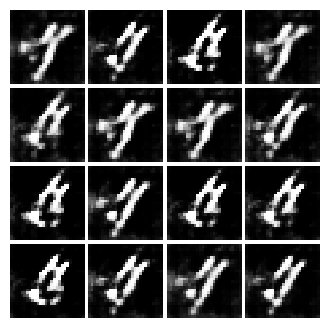

Epoch: 1, Iter: 560, D: 0.3755, G:2.437


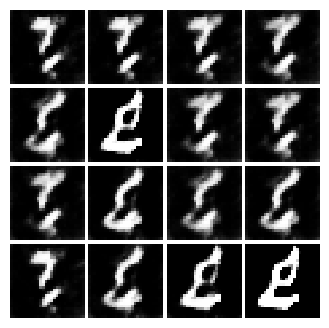

Epoch: 1, Iter: 580, D: 1.298, G:1.828


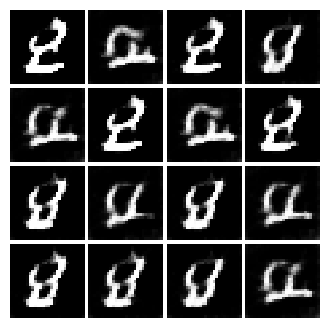

Epoch: 1, Iter: 600, D: 0.9222, G:8.123


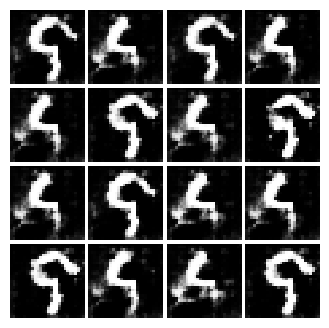

Epoch: 1, Iter: 620, D: 1.049, G:2.304


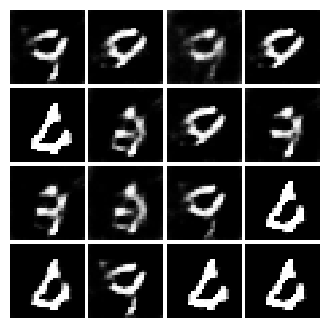

Epoch: 1, Iter: 640, D: 0.7136, G:3.188


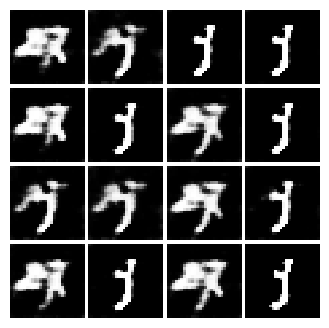

Epoch: 1, Iter: 660, D: 0.2222, G:2.477


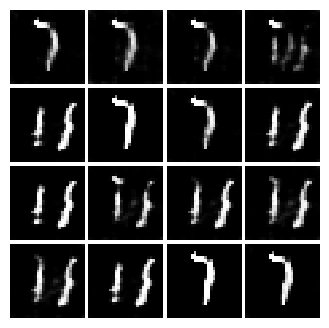

Epoch: 1, Iter: 680, D: 0.3607, G:2.328


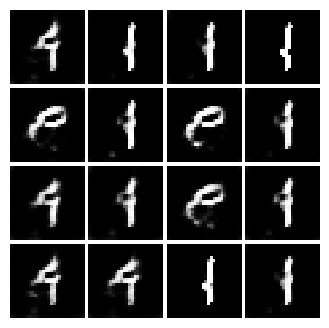

Epoch: 1, Iter: 700, D: 0.6653, G:2.565


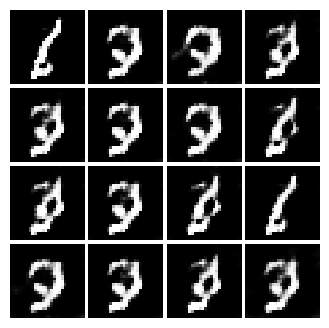

Epoch: 1, Iter: 720, D: 0.1595, G:4.078


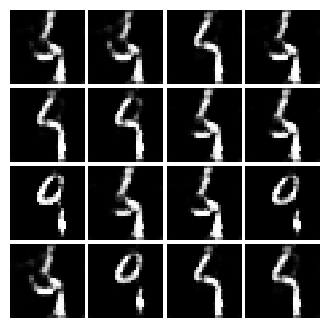

Epoch: 1, Iter: 740, D: 0.7235, G:1.825


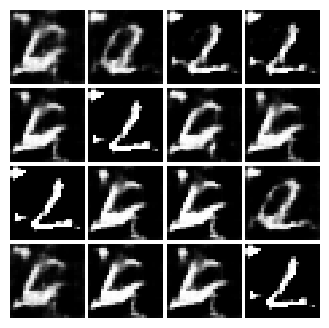

Epoch: 1, Iter: 760, D: 1.067, G:3.105


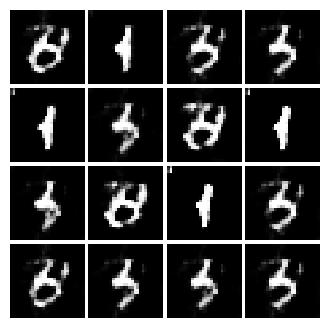

Epoch: 1, Iter: 780, D: 0.4908, G:2.092


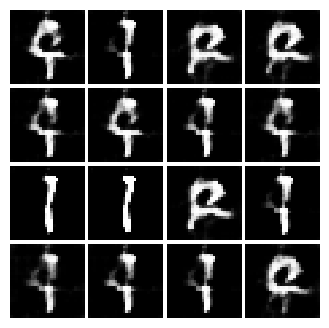

Epoch: 1, Iter: 800, D: 0.3026, G:3.248


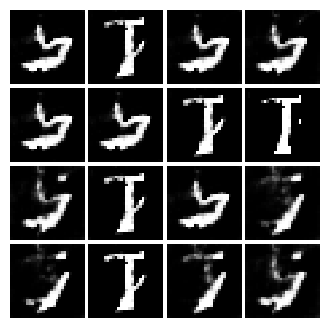

Epoch: 1, Iter: 820, D: 0.75, G:1.771


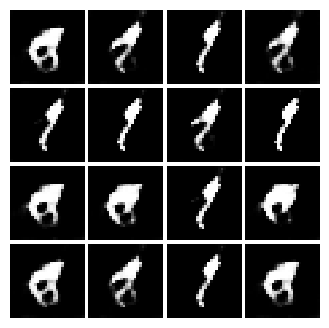

Epoch: 1, Iter: 840, D: 0.576, G:2.105


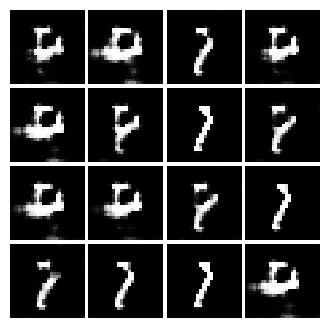

Epoch: 1, Iter: 860, D: 0.9164, G:2.491


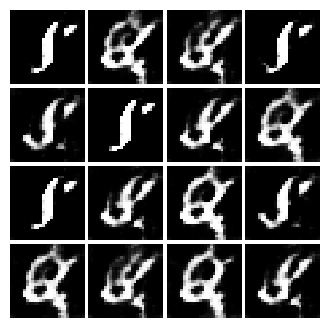

Epoch: 1, Iter: 880, D: 0.577, G:3.092


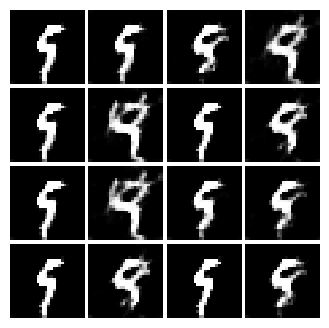

Epoch: 1, Iter: 900, D: 0.5806, G:3.008


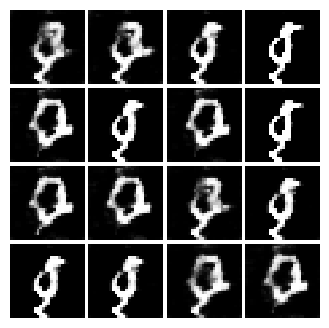

Epoch: 1, Iter: 920, D: 1.896, G:2.124


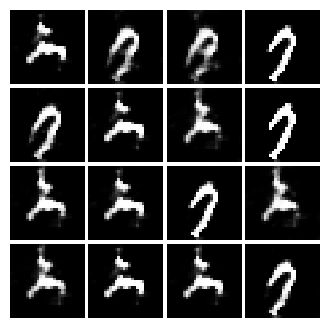

Epoch: 2, Iter: 940, D: 0.7307, G:5.394


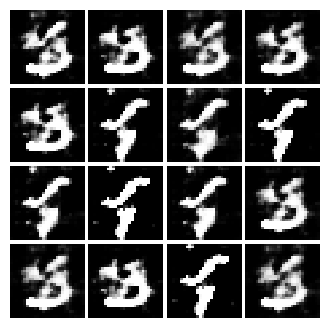

Epoch: 2, Iter: 960, D: 1.059, G:2.29


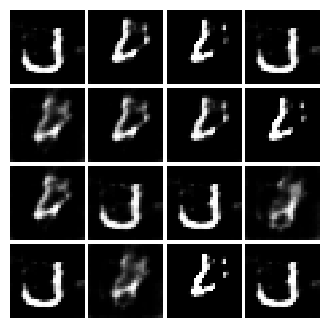

Epoch: 2, Iter: 980, D: 2.308, G:3.235


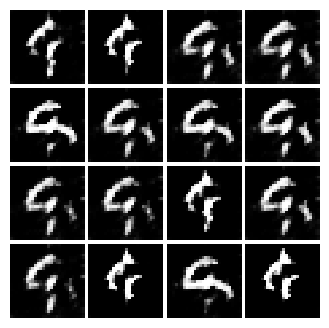

Epoch: 2, Iter: 1000, D: 0.9518, G:3.057


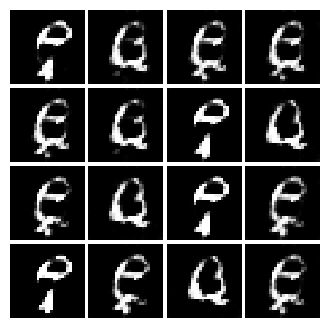

Epoch: 2, Iter: 1020, D: 0.2036, G:3.475


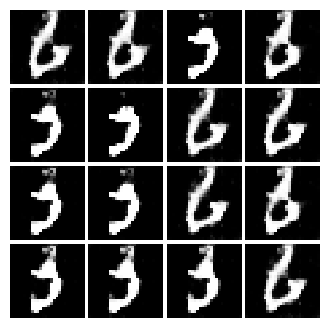

Epoch: 2, Iter: 1040, D: 0.7396, G:4.946


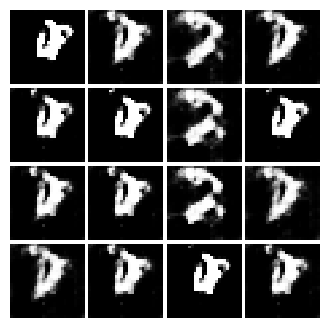

Epoch: 2, Iter: 1060, D: 0.6063, G:3.403


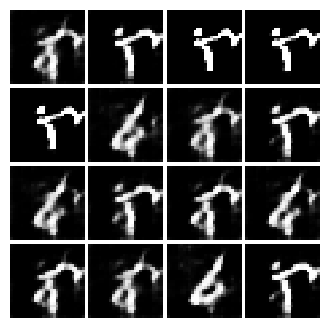

Epoch: 2, Iter: 1080, D: 0.523, G:3.0


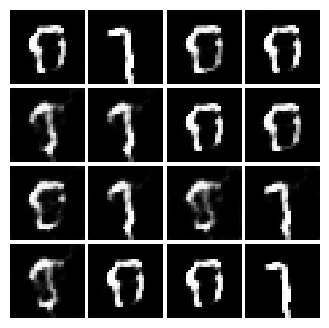

Epoch: 2, Iter: 1100, D: 0.516, G:3.537


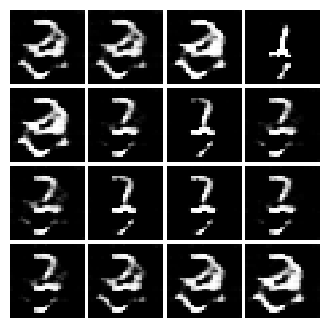

Epoch: 2, Iter: 1120, D: 0.1341, G:3.561


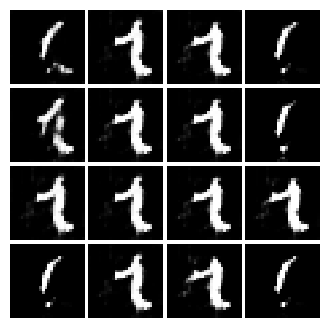

Epoch: 2, Iter: 1140, D: 0.5435, G:2.296


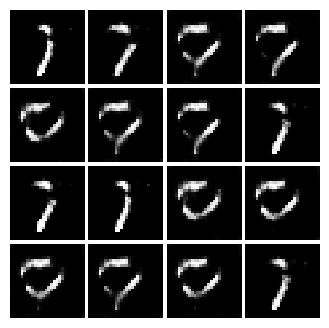

Epoch: 2, Iter: 1160, D: 0.6818, G:3.486


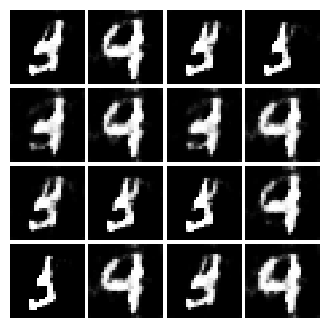

Epoch: 2, Iter: 1180, D: 0.6067, G:4.082


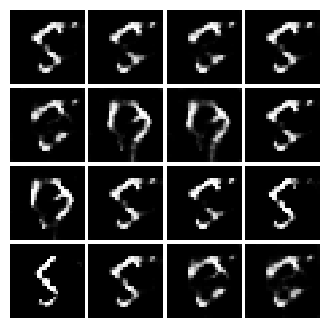

Epoch: 2, Iter: 1200, D: 1.64, G:5.439


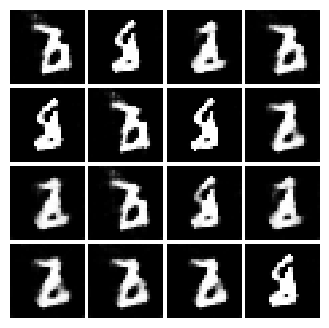

Epoch: 2, Iter: 1220, D: 0.5021, G:2.825


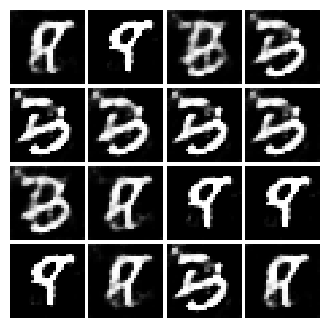

Epoch: 2, Iter: 1240, D: 0.3789, G:4.133


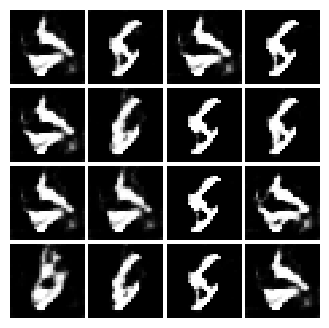

Epoch: 2, Iter: 1260, D: 0.5981, G:2.577


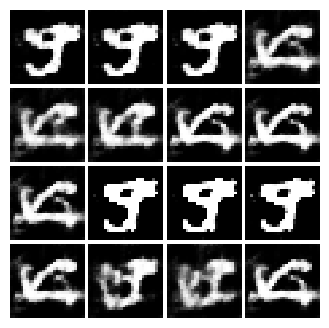

Epoch: 2, Iter: 1280, D: 0.3316, G:2.698


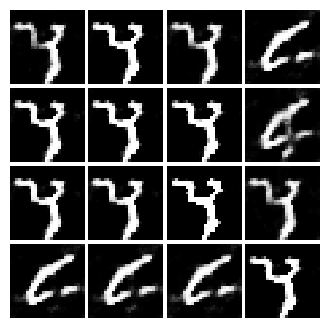

Epoch: 2, Iter: 1300, D: 0.7661, G:3.199


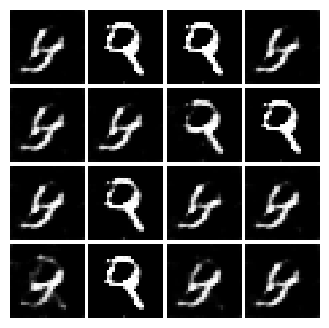

Epoch: 2, Iter: 1320, D: 0.9697, G:2.499


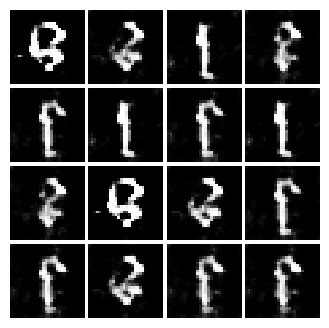

Epoch: 2, Iter: 1340, D: 0.2746, G:3.825


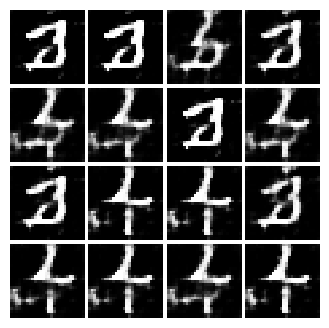

Epoch: 2, Iter: 1360, D: 0.6996, G:2.582


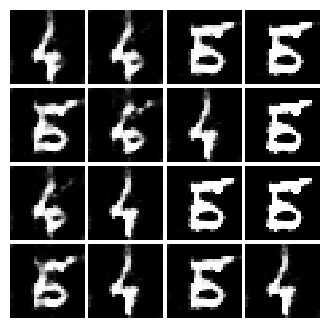

Epoch: 2, Iter: 1380, D: 0.3018, G:3.653


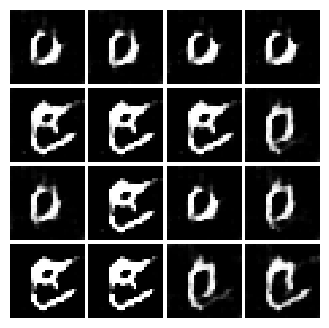

Epoch: 2, Iter: 1400, D: 0.107, G:3.452


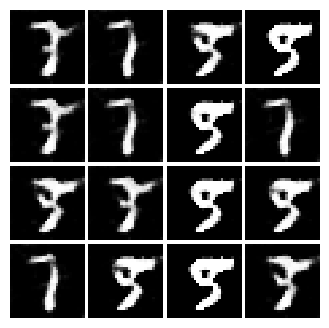

Epoch: 3, Iter: 1420, D: 0.2171, G:3.635


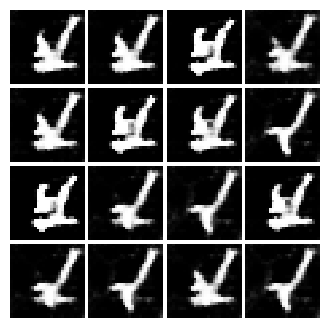

Epoch: 3, Iter: 1440, D: 0.2132, G:4.959


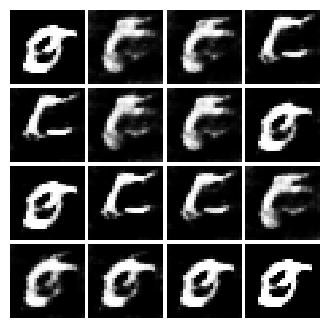

Epoch: 3, Iter: 1460, D: 0.5383, G:3.012


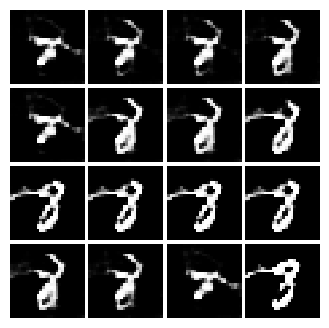

Epoch: 3, Iter: 1480, D: 0.3677, G:5.093


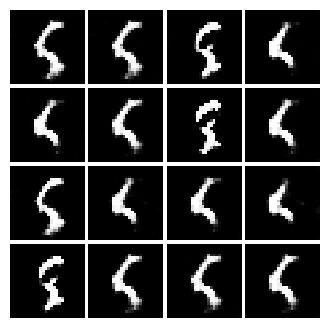

Epoch: 3, Iter: 1500, D: 0.4363, G:3.702


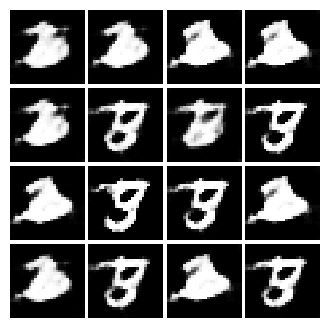

Epoch: 3, Iter: 1520, D: 0.308, G:2.756


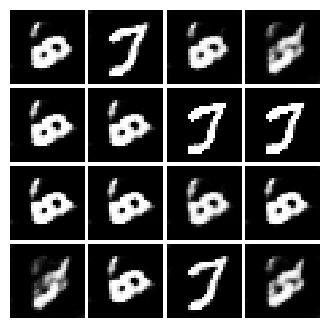

Epoch: 3, Iter: 1540, D: 0.5908, G:3.789


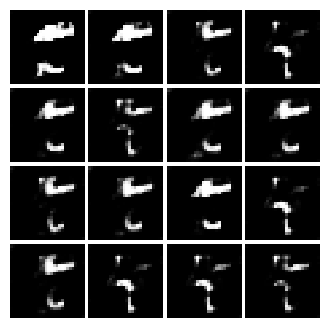

Epoch: 3, Iter: 1560, D: 0.7846, G:8.393


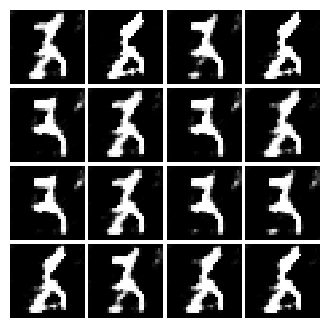

Epoch: 3, Iter: 1580, D: 0.2217, G:3.56


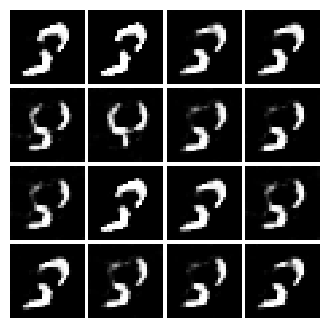

Epoch: 3, Iter: 1600, D: 0.4708, G:4.402


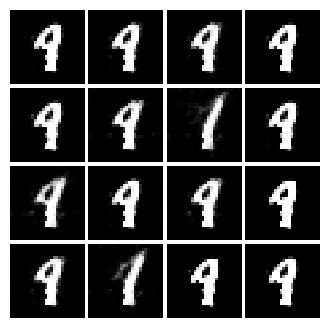

Epoch: 3, Iter: 1620, D: 0.3882, G:3.425


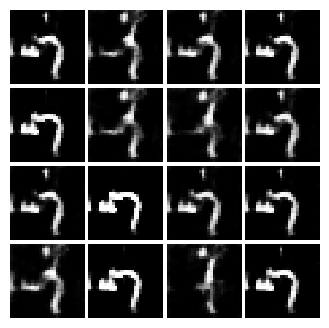

Epoch: 3, Iter: 1640, D: 0.5736, G:3.873


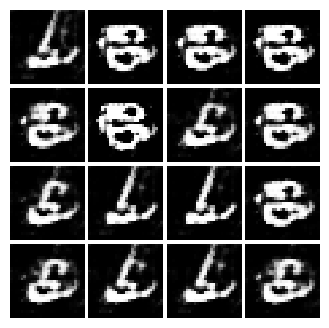

Epoch: 3, Iter: 1660, D: 0.444, G:2.615


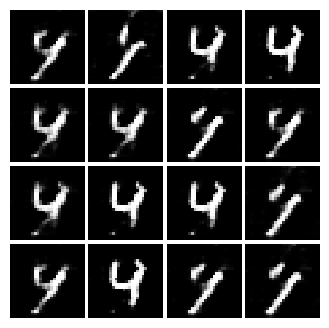

Epoch: 3, Iter: 1680, D: 0.2577, G:3.368


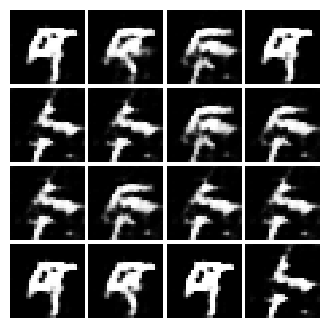

Epoch: 3, Iter: 1700, D: 0.3269, G:2.687


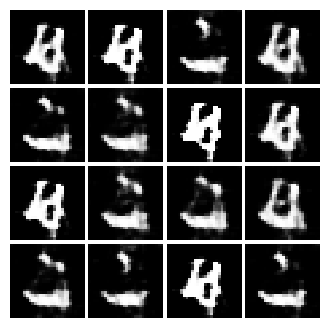

Epoch: 3, Iter: 1720, D: 0.5368, G:2.736


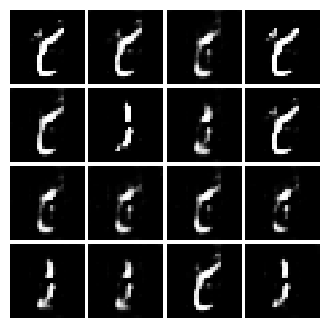

Epoch: 3, Iter: 1740, D: 0.8453, G:2.749


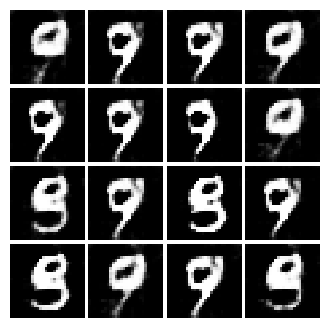

Epoch: 3, Iter: 1760, D: 0.3818, G:3.196


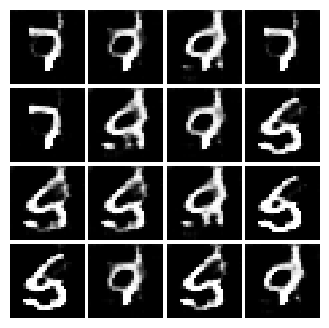

Epoch: 3, Iter: 1780, D: 0.1806, G:5.126


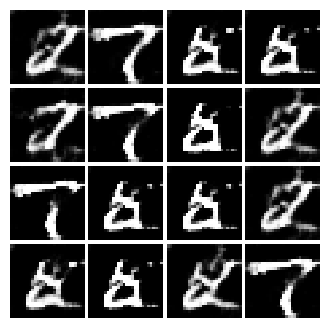

Epoch: 3, Iter: 1800, D: 0.8416, G:2.071


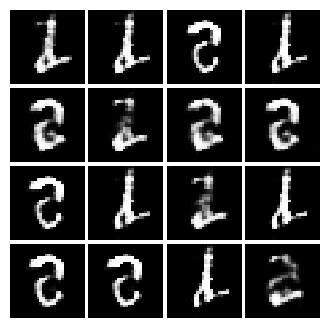

Epoch: 3, Iter: 1820, D: 2.358, G:0.9725


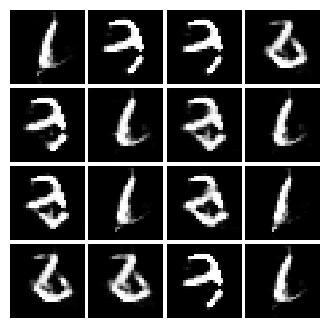

Epoch: 3, Iter: 1840, D: 0.5447, G:3.207


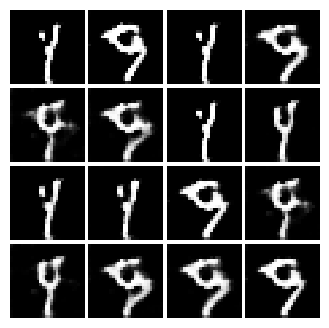

Epoch: 3, Iter: 1860, D: 0.3919, G:2.535


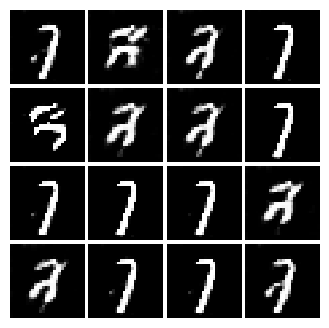

Epoch: 4, Iter: 1880, D: 0.2369, G:3.625


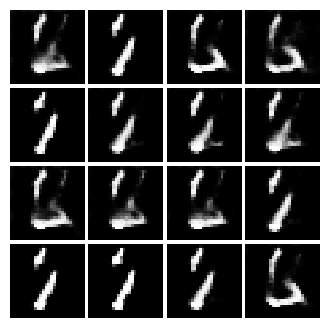

Epoch: 4, Iter: 1900, D: 0.2414, G:5.417


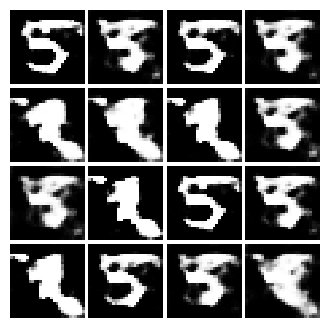

Epoch: 4, Iter: 1920, D: 0.3501, G:3.298


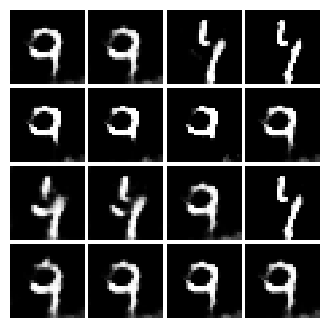

Epoch: 4, Iter: 1940, D: 0.2049, G:3.767


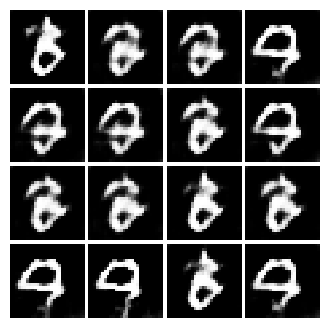

Epoch: 4, Iter: 1960, D: 0.4724, G:2.352


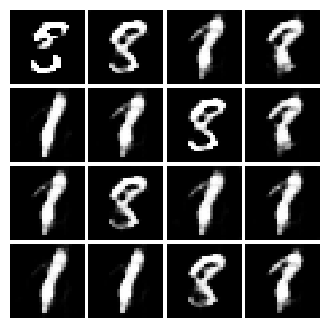

Epoch: 4, Iter: 1980, D: 0.3371, G:2.407


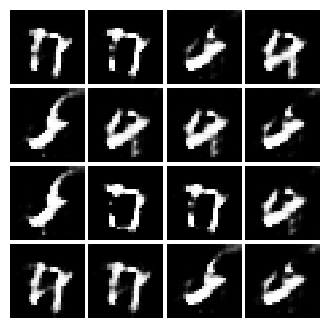

Epoch: 4, Iter: 2000, D: 0.2785, G:3.729


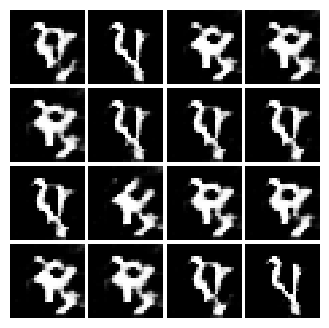

Epoch: 4, Iter: 2020, D: 0.2541, G:4.032


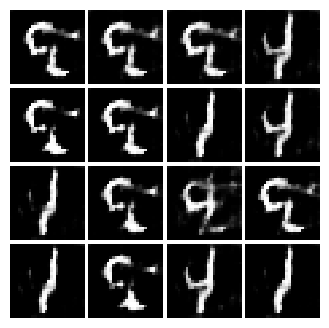

Epoch: 4, Iter: 2040, D: 0.7178, G:4.093


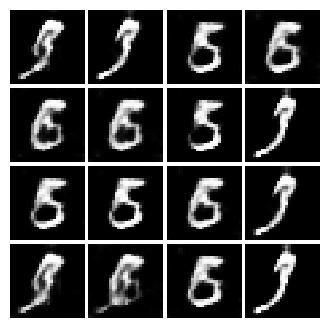

Epoch: 4, Iter: 2060, D: 0.3614, G:3.538


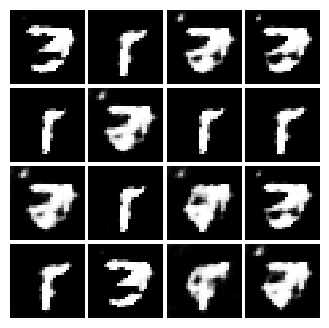

Epoch: 4, Iter: 2080, D: 0.5619, G:3.958


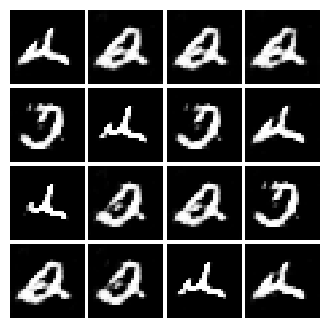

Epoch: 4, Iter: 2100, D: 0.5581, G:3.579


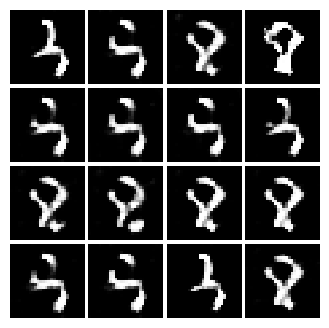

Epoch: 4, Iter: 2120, D: 0.4167, G:3.446


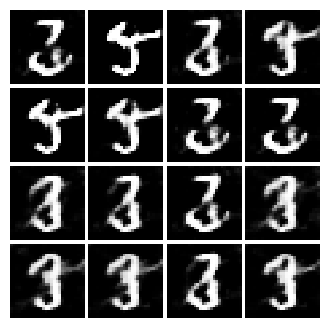

Epoch: 4, Iter: 2140, D: 0.606, G:1.545


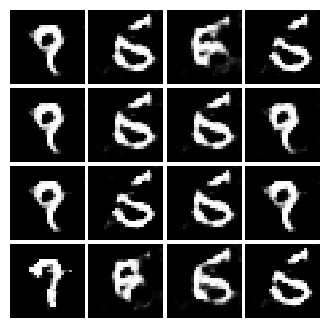

Epoch: 4, Iter: 2160, D: 0.4201, G:4.25


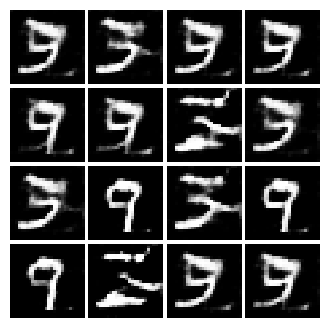

Epoch: 4, Iter: 2180, D: 0.2998, G:3.312


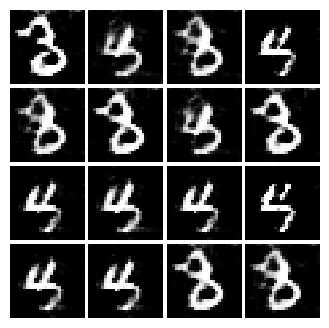

Epoch: 4, Iter: 2200, D: 0.2795, G:4.07


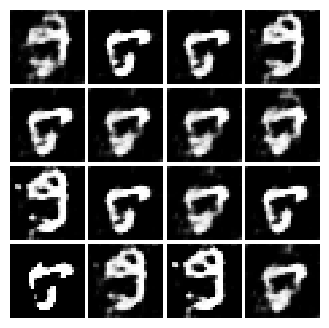

Epoch: 4, Iter: 2220, D: 0.5064, G:2.761


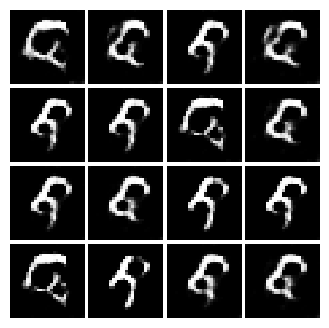

Epoch: 4, Iter: 2240, D: 0.3464, G:3.784


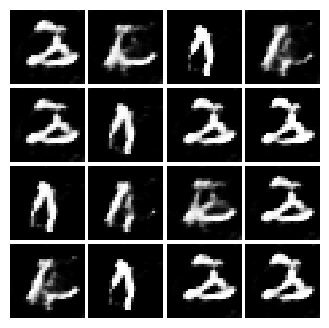

Epoch: 4, Iter: 2260, D: 0.2964, G:3.528


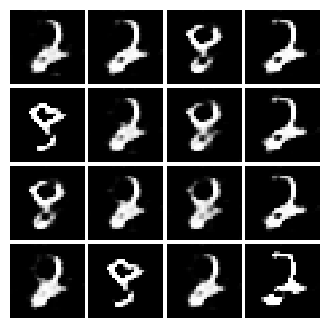

Epoch: 4, Iter: 2280, D: 0.473, G:4.782


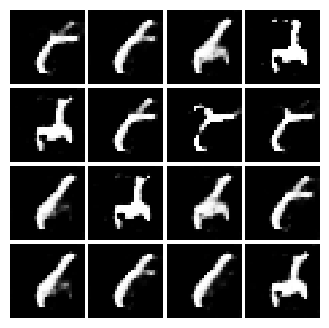

Epoch: 4, Iter: 2300, D: 0.5233, G:3.316


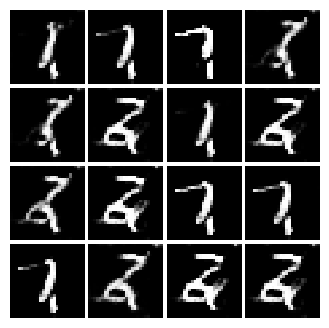

Epoch: 4, Iter: 2320, D: 0.1858, G:4.597


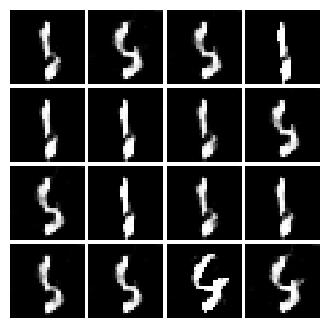

Epoch: 4, Iter: 2340, D: 1.068, G:2.643


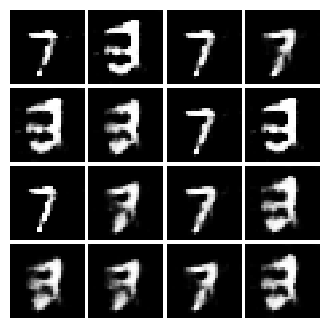

Final images


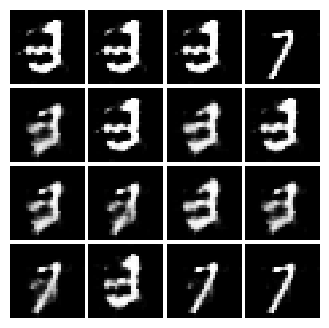

In [23]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

In [24]:
D.save('/kaggle/working/discriminator.h5')
G.save('/kaggle/working/generator.h5')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
